In [1]:
%cd
import os
import uproot4 as uproot
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import mplhep as hep
import pandas as pd
import awkward as ak
import logging
from matplotlib.backends.backend_pdf import PdfPages
plt.style.use(hep.style.ATLAS)  # or ATLAS/LHCb

/home/rdhill13


In [2]:
def get_truthHCAL(data):
    barrelE = data['HcalBarrelClusters.energy'].array(library='np')
    barrel_polTheta = data['HcalBarrelClusters.polar.theta'].array(library='np')
    barrel_polPhi = data['HcalBarrelClusters.polar.phi'].array(library='np')
    hEndcapE = data['HcalHadronEndcapClusters.energy'].array(library='np')
    hEndcapT = data['HcalHadronEndcapClusters.polar.theta'].array(library='np')
    hEndcapP = data['HcalHadronEndcapClusters.polar.phi'].array(library='np')
    eEndcapE = data['HcalElectronEndcapClusters.energy'].array(library='np')
    eEndcapT = data['HcalElectronEndcapClusters.polar.theta'].array(library='np')
    eEndcapP = data['HcalElectronEndcapClusters.polar.phi'].array(library='np')
    return barrelE, barrel_polTheta, barrel_polPhi, hEndcapE, hEndcapT, hEndcapP, eEndcapE, eEndcapT, eEndcapP


def get_truthECAL(data):
    barrelE = data['EcalBarrelClusters.energy'].array(library='np')
    barrel_polTheta = data['EcalBarrelClusters.polar.theta'].array(library='np')
    barrel_polPhi = data['EcalBarrelClusters.polar.phi'].array(library='np')
    hEndcapE = data['EcalEndcapPClusters.energy'].array(library='np')
    hEndcapT = data['EcalEndcapPClusters.polar.theta'].array(library='np')
    hEndcapP = data['EcalEndcapPClusters.polar.phi'].array(library='np')
    eEndcapE = data['EcalEndcapNClusters.energy'].array(library='np')
    eEndcapT = data['EcalEndcapNClusters.polar.theta'].array(library='np')
    eEndcapP = data['EcalEndcapNClusters.polar.phi'].array(library='np')
    return barrelE, barrel_polTheta, barrel_polPhi, hEndcapE, hEndcapT, hEndcapP, eEndcapE, eEndcapT, eEndcapP


def get_truthMCP(gen_events):
    g4parent = gen_events['mcparticles.g4Parent'].array(library='np')
    pdgID = gen_events['mcparticles.pdgID'].array(library='np')
    status = gen_events['mcparticles.status'].array(library='np')
    genStatus = gen_events['mcparticles.genStatus'].array(library='np')
    pex = gen_events['mcparticles.psx'].array(library='np')
    pey = gen_events['mcparticles.psy'].array(library='np')
    pez = gen_events['mcparticles.psz'].array(library='np')
    mass = gen_events['mcparticles.mass'].array(library='np')
    return pdgID, status, genStatus, pex, pey, pez, mass, g4parent


def truth_df(clusters, mcp):
    hcalTruth = {}
    #hcalTruth['HcalBarrelClusters.energy'], hcalTruth['HcalBarrelClusters.polar.theta'], hcalTruth['HcalBarrelClusters.polar.phi'] = get_truthHCAL(hcal) 
    hcalTruth['HcalBarrelClusters.energy'], hcalTruth['HcalBarrelClusters.polar.theta'], hcalTruth['HcalBarrelClusters.polar.phi'], \
    hcalTruth['HcalHadronEndcapClusters.energy'], hcalTruth['HcalHadronEndcapClusters.polar.theta'], hcalTruth['HcalHadronEndcapClusters.polar.phi'], \
    hcalTruth['HcalElectronEndcapClusters.energy'], hcalTruth['HcalElectronEndcapClusters.polar.theta'], hcalTruth['HcalElectronEndcapClusters.polar.phi'] = get_truthHCAL(clusters) 
    hcal_df = pd.DataFrame(hcalTruth)
    
    ecalTruth = {}
    #ecalTruth['EcalBarrelClusters.energy'], ecalTruth['EcalBarrelClusters.polar.theta'], ecalTruth['EcalBarrelClusters.polar.phi'] = get_truthECAL(ecal) 
    ecalTruth['EcalBarrelClusters.energy'], ecalTruth['EcalBarrelClusters.polar.theta'], ecalTruth['EcalBarrelClusters.polar.phi'], \
    ecalTruth['EcalEndcapPClusters.energy'], ecalTruth['EcalEndcapPClusters.polar.theta'], ecalTruth['EcalEndcapPClusters.polar.phi'], \
    ecalTruth['EcalEndcapNClusters.energy'], ecalTruth['EcalEndcapNClusters.polar.theta'], ecalTruth['EcalEndcapNClusters.polar.phi'] = get_truthECAL(clusters) 
    ecal_df = pd.DataFrame(ecalTruth)
    
    barrels = hcal_df.join(ecal_df)
    
    mc = {}
    mc['mcparticles.pdgID'], mc['mcparticles.status'], mc['mcparticles.genStatus'], mc['mcparticles.psx'], mc['mcparticles.psy'], mc['mcparticles.psz'], \
    mc['mcparticles.mass'], mc['mcparticles.g4Parent'] = get_truthMCP(mcp)
    mcparticles = pd.DataFrame(mc)
    final_df = mcparticles.join(barrels)
    return final_df

In [3]:
class HistManager:
    def __init__(self):
        self.histograms = {}
    

    def clear(self):
        self.histograms = {}

    def add(self, df, name, x, cuts=[], nbins=100, range=[0,1], density=False):
        
        
        #branch = df[varString].ravel()
    
        mask = np.ones(len(x), dtype=bool)

        for cut in cuts:
            if len(mask) != len(cut):
                print("Error: existing bitmask and new cut bitmask have different sizes!")

            mask = np.bitwise_and(np.array(mask), np.array(cut))
        
        if name not in self.histograms:
            print(f"Creating histogram named {name} ... ")
            self.histograms[name] = np.histogram(x[mask], nbins, range, density=density)
        else:
            (hist, bins) = np.histogram(x[mask], nbins, range)
            newhist = np.sum([hist, self.histograms[name][0]], axis=0)
            self.histograms[name] = (newhist, self.histograms[name][1])
    
    def get_all(self):
        return self.histograms

    def get(self, name):
        return self.histograms[name]

    def get_hist(self, name):
        return self.histograms[name][0]
    
    def get_bins(self, name):
        return self.histograms[name][1]

def HCALEnergy(row, eta_range=[-3.5,-1]):
    # Primary theta and phi
    primary_theta = row["PrimaryTheta"]
    primary_phi = row["PrimaryPhi"]
    
    primary_eta = -np.log(np.tan(primary_theta/2.0))
    
    if (primary_eta < eta_range[0] or primary_eta > eta_range[1]):
        return -1.0
    
    dRmax = 1.0
    TotalHCAL = 0.0

    for system in ["HcalBarrel", "HcalHadronEndcap", "HcalElectronEndcap"]:
        try:
            cl_energy = row[f"{system}Clusters.energy"]
            cl_theta  = row[f"{system}Clusters.polar.theta"]
            cl_phi    = row[f"{system}Clusters.polar.phi"]
            deltaR = np.sqrt( np.power(cl_theta - primary_theta,2) + np.power(cl_phi - primary_phi, 2))
            TotalHCAL += np.sum(cl_energy[deltaR < dRmax])
        except:
            pass

        
    return TotalHCAL


def ECALEnergy(row, eta_range=[-3.5,-1]):
    # Primary theta and phi
    primary_theta = row["PrimaryTheta"]
    primary_phi = row["PrimaryPhi"]
    
    primary_eta = -np.log(np.tan(primary_theta/2.0))
    
    if (primary_eta < eta_range[0] or primary_eta > eta_range[1]):
        return -1.0
        
    dRmax = 1.0
    TotalECAL = 0.0
    
    for system in ["EcalBarrel", "EcalEndcapP", "EcalEndcapN"]:
        try:
            cl_energy = row[f"{system}Clusters.energy"]
            cl_theta  = row[f"{system}Clusters.polar.theta"]
            cl_phi    = row[f"{system}Clusters.polar.phi"]
            deltaR = np.sqrt( np.power(cl_theta - primary_theta,2) + np.power(cl_phi - primary_phi, 2))
            TotalECAL += np.sum(cl_energy[deltaR < dRmax])
        except:
            pass
        
    return TotalECAL


def PrimaryTrackTheta(row):
    mc_ID = row["mcparticles.pdgID"]
    mc_status = row["mcparticles.genStatus"]
    mc_g4 = row["mcparticles.g4Parent"]
    mc_vx = row["mcparticles.psx"]
    mc_vy = row["mcparticles.psy"]
    mc_vz = row["mcparticles.psz"]
    
    isThrown = mc_g4 == 0 # mc_status# == 1  # mc_g4 == 0
    thrown_ID = mc_ID[isThrown]
    theta = np.arctan2(np.sqrt(mc_vx[isThrown]**2 + mc_vy[isThrown]**2), mc_vz[isThrown])
    phi = np.arctan2(mc_vy[isThrown],mc_vx[isThrown])
    
    return theta[0]

def PrimaryTrackPhi(row):
    mc_ID = row["mcparticles.pdgID"]
    mc_status = row["mcparticles.genStatus"]
    mc_g4 = row["mcparticles.g4Parent"]
    mc_vx = row["mcparticles.psx"]
    mc_vy = row["mcparticles.psy"]
    mc_vz = row["mcparticles.psz"]
    
    isThrown = mc_g4 == 0 # mc_status# == 1
    thrown_ID = mc_ID[isThrown]
    theta = np.arctan2(np.sqrt(mc_vx[isThrown]**2 + mc_vy[isThrown]**2), mc_vz[isThrown])
    phi = np.arctan2(mc_vy[isThrown],mc_vx[isThrown])
    
    return phi[0]

def PrimaryTrackID(row):
    mc_ID = row["mcparticles.pdgID"]
    mc_status = row["mcparticles.genStatus"]
    mc_g4 = row["mcparticles.g4Parent"]
    
    isThrown = mc_g4 == 0 # g4 allows us to figure out what the original particle was. mc_status#  == 1
    thrown_ID = mc_ID[isThrown]
    
    return thrown_ID[0]

def GoodClusters(energy = np.array([]), theta = np.array([]), phi = np.array([])):
    
    return (energy != 0) & (theta != 0) & (phi != 0)
    

def ElectronID(row):
    # Find the highest-energy cluster and the energy in a region around it
    
    MaxCluster_E = 0.0
    MaxCluster_Phi = -999
    MaxCluster_Theta = -999
    IsolationEnergy = -999
    
    # Barrrel energies
    for system in ["EcalBarrel", "EcalEndcap", "CrystalEcal"]:
        cl_energy = row[f"{system}Clusters.energy"]
        cl_theta  = row[f"{system}Clusters.polar.theta"]
        cl_phi    = row[f"{system}Clusters.polar.phi"]

        if len(cl_energy) == 0:
            continue

        good = GoodClusters(cl_energy, cl_theta, cl_phi)

        if len(cl_energy[good]) == 0:
            continue

        NewMaxCluster_E = np.max(cl_energy[good])
        if NewMaxCluster_E > MaxCluster_E:
            MaxCluster_E = NewMaxCluster_E
            index = np.where(cl_energy == MaxCluster_E)
            MaxCluster_Phi = cl_phi[index][0]
            MaxCluster_Theta = cl_theta[index][0]
    
    if MaxCluster_E > 0.0:

        # Compute the isolation energy
        IsolationEnergy = 0.0
        for system in ["EcalBarrel", "EcalEndcap", "CrystalEcal"]:
            if len(row[f"{system}Clusters.energy"]) == 0:
                continue

            cl_energy = row[f"{system}Clusters.energy"]
            cl_theta  = row[f"{system}Clusters.polar.theta"]
            cl_phi    = row[f"{system}Clusters.polar.phi"]

            good = GoodClusters(cl_energy, cl_theta, cl_phi)
            
            if len(cl_energy[good]) == 0:
                continue
            
            for index, cluster_energy in enumerate(cl_energy[good]):
                if cluster_energy == 0.0:
                    continue

                cl_eta = -np.log(np.tan(cl_theta[good][index]/2))
                max_cl_eta = -np.log(np.tan(MaxCluster_Theta/2))
                
                DeltaR = np.sqrt((cl_phi[good][index] - MaxCluster_Phi)**2 + (cl_eta - max_cl_eta)**2)
                if DeltaR < 1.0 and DeltaR > 0.1:
                    IsolationEnergy += cluster_energy

    return pd.Series((MaxCluster_Theta, MaxCluster_Phi, IsolationEnergy))



def ProcessFiles(files={}, branches=[], hist_manager=None, name="", eta_range=[-1,1], output_arrays = None):
    count = 0
    for batch in uproot.iterate([files], 
                            branches, 
                            step_size = '1000 MB',
                            library="np"):

        df = pd.DataFrame(batch)
        df["PrimaryID"]     = df.apply(PrimaryTrackID, axis=1)
        df["PrimaryTheta"]  = df.apply(PrimaryTrackTheta, axis=1)
        df["PrimaryPhi"]    = df.apply(PrimaryTrackPhi,  axis=1)
        df["ECALEnergy"] = df.apply(ECALEnergy, eta_range=eta_range, axis=1) 
        df["HCALEnergy"] = df.apply(HCALEnergy, eta_range=eta_range, axis=1)
        df["ECALEnergyFraction"] = df["ECALEnergy"]/(df["ECALEnergy"] + df["HCALEnergy"])
        
        #df[["ElectronTheta", "ElectronPhi", "ElectronIsoE"]] = df.apply(ElectronID, axis=1)
    
        hist_manager.add(df, f"{name}ECALEnergyFraction", x=df["ECALEnergyFraction"], cuts=[(df["ECALEnergy"] + df["HCALEnergy"]) > 0], nbins=100, range=[0,1.0], density=True)
        hist_manager.add(df, f"{name}ECALEnergy", x=df["ECALEnergy"]/1000.0, cuts=[], nbins=100, range=[0,10.0], density=True)
        hist_manager.add(df, f"{name}HCALEnergy", x=df["HCALEnergy"]/1000.0, cuts=[], nbins=100, range=[0,10.0], density=True)
        count += 1
        
        if output_arrays is not None:
            for key in output_arrays:
                output_arrays[key] = np.concatenate([output_arrays[key], df[key]])
                
                
def ProcessFiles2(dataframe, hist_manager=None, name="", eta_range=[-1,-1], output_arrays = None, rng=[0,1]):
    df = dataframe
    df["PrimaryID"]     = df.apply(PrimaryTrackID, axis=1)
    df["PrimaryTheta"]  = df.apply(PrimaryTrackTheta, axis=1)
    df["PrimaryPhi"]    = df.apply(PrimaryTrackPhi,  axis=1)
    df["ECALEnergy"] = df.apply(ECALEnergy, eta_range=eta_range, axis=1)  # apply function ECALEnergy to each row. 
    df["HCALEnergy"] = df.apply(HCALEnergy, eta_range=eta_range, axis=1)
    df["ECALEnergyFraction"] = df["ECALEnergy"]/(df["ECALEnergy"] + df["HCALEnergy"])
        
    #df[["ElectronTheta", "ElectronPhi", "ElectronIsoE"]] = df.apply(ElectronID, axis=1)
    
    hist_manager.add(df, f"{name}ECALEnergyFraction", x=df["ECALEnergyFraction"], cuts=[(df["ECALEnergy"] + df["HCALEnergy"]) > 0], nbins=100, range=[0,1.0], density=True)
    hist_manager.add(df, f"{name}ECALEnergy", x=df["ECALEnergy"]/1000.0, cuts=[], nbins=100, range=rng, density=False)
    hist_manager.add(df, f"{name}HCALEnergy", x=df["HCALEnergy"]/1000.0, cuts=[], nbins=100, range=rng, density=False)
        
    if output_arrays is not None:
        for key in output_arrays:
            output_arrays[key] = np.concatenate([output_arrays[key], df[key]])

In [4]:
def process(df, name, pp, eta_range=[-1,1], eng="", rng=[0,1]):
    hm = HistManager()
    hm.clear()

    data_arrays = {}
    data_arrays["ECALEnergyFraction"] = np.array([])
    data_arrays["ECALEnergy"] = np.array([])
    data_arrays["HCALEnergy"] = np.array([])
    data_arrays["PrimaryTheta"] = np.array([])
    data_arrays["PrimaryPhi"] = np.array([])

    bak_data_arrays = data_arrays.copy()
    fwd_data_arrays = data_arrays.copy()
    ProcessFiles2(df, hm, name, eta_range=eta_range, output_arrays=data_arrays, rng=rng)
    
    plt.figure(1)
    hep.histplot(hm.get_hist(f"{name}ECALEnergy"), hm.get_bins(f"{name}ECALEnergy"), label=f"{name}ECALEnergy", alpha=1.0, color='c', fill=False, lw=3)
    hep.histplot(hm.get_hist(f"{name}HCALEnergy"), hm.get_bins(f"{name}HCALEnergy"), label=f"{name}HCALEnergy", alpha=1.0, color='k', fill=False, lw=3)
    plt.title(r"$\bf{ATHENA}$" +' simulation [DD4hep] \nPythia8+Geant4',fontsize=22)
    plt.xlabel("Energy (GeV)")
    plt.ylabel("Density")
    plt.legend()
    plt.ylim([1e-3,1e7])
    plt.yscale("log")
    # plt.xscale("log")
    plt.text(0.05,1e6,"${}<\eta<{}$ @ {}".format(eta_range[0], eta_range[1], eng))
    plt.tight_layout()
    plt.savefig('Pictures/FullSim/'+f"{name}_{eng}_eta=({eta_range[0]}-{eta_range[1]}).png", dpi=200)
    pp.savefig()
    plt.show()
    
    plt.figure(2)
    hep.histplot(hm.get_hist(f"{name}ECALEnergyFraction"), hm.get_bins(f"{name}ECALEnergyFraction"), label="{}@{}".format(name, eng),
                 alpha=1.0, color='c', fill=True, lw=3)
    #hep.histplot(hm.get_hist("piECALEnergyFraction"), hm.get_bins("piECALEnergyFraction"), label="$\pi$ [p=1 GeV/c]",alpha=0.35, color='r', fill=True)
    plt.title(r"$\bf{ATHENA}$" +' simulation [DD4hep] \nPythia8+Geant4',fontsize=22)
    plt.xlabel("$f_{EM} \equiv E_{EM}/E_{CALO}$")
    plt.ylabel("Density")
    plt.legend()
    plt.ylim([1e-3,1e7])
    plt.yscale("log")
    # plt.xscale("log")
    plt.text(0.05,1e6,"${}<\eta<{}$".format(eta_range[0], eta_range[1]))
    plt.tight_layout()
    plt.savefig('Pictures/FullSim/'+f"{name}_{eng}_eta=({eta_range[0]}-{eta_range[1]})_EMFraction.png", dpi=200)
    pp.savefig()
    plt.show()
    
    df = pd.DataFrame(data_arrays, columns = data_arrays.keys())
    #df = df[df["ECALEnergy"] + df["HCALEnergy"] > 0.0]
    #print(df.head())
    
    pTheta = df["PrimaryTheta"]
    df["PrimaryEta"] = -np.log(np.tan(pTheta/2.0))
    pEta = df["PrimaryEta"]
    totalEng = df["ECALEnergy"] + df["HCALEnergy"]
        
    plt.figure(3)
    plt.hist2d(pEta[df["HCALEnergy"]>100], (df["HCALEnergy"][df["HCALEnergy"]>100])/1000, bins=(60, 60), cmap=plt.cm.jet, cmin=1);
    plt.ylabel("HCALEnergy (GeV)",fontsize=15)
    plt.xlabel("Primary Eta",fontsize=15)
    plt.title("{}@{} spanning ${}<\eta<{}$".format(name, eng, eta_range[0], eta_range[1]))
    plt.colorbar()
    plt.tight_layout()
    plt.savefig('Pictures/FullSim/'+f"{name}_{eng}_eta=({eta_range[0]}-{eta_range[1]})_HCAL2d.png", dpi=200)
    pp.savefig()
    plt.show()
        
    plt.figure(4)
    plt.hist2d(pEta[df["ECALEnergy"]>0.0], (df["ECALEnergy"][df["ECALEnergy"]>0.0])/1000, bins=(60, 60), cmap=plt.cm.jet, cmin=1); # binary
    plt.ylabel("ECALEnergy (GeV)",fontsize=15)
    plt.xlabel("Primary Eta",fontsize=15)
    plt.title("{}@{} spanning ${}<\eta<{}$".format(name, eng, eta_range[0], eta_range[1]))
    plt.colorbar()
    plt.tight_layout()
    plt.savefig('Pictures/FullSim/'+f"{name}_{eng}_eta=({eta_range[0]}-{eta_range[1]})_ECAL2d.png", dpi=200)
    pp.savefig()
    plt.show()
       
    plt.figure(5)
    plt.hist2d(pEta[totalEng > 0.0], (df["ECALEnergy"][totalEng > 0.0]+df["HCALEnergy"][totalEng > 0.0])/1000, bins=(60, 60), cmap=plt.cm.jet, cmin=1);
    plt.ylabel("ECALEnergy + HCALEnergy (GeV)",fontsize=15)
    plt.xlabel("Primary Eta",fontsize=15)
    plt.title("{}@{} spanning ${}<\eta<{}$".format(name, eng, eta_range[0], eta_range[1]))
    plt.colorbar()
    plt.tight_layout()
    plt.savefig('Pictures/FullSim/'+f"{name}_{eng}_eta=({eta_range[0]}-{eta_range[1]})_(ECAL+HCAL)2d.png", dpi=200)
    pp.savefig()
    plt.show()
    return data_arrays, pp

In [5]:
efileR = ["/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/1GeV/45to135deg/e-_1GeV_45to135deg.0010.root",
          "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/1GeV/130to177deg/e-_1GeV_130to177deg.0010.root",
          "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/2GeV/130to177deg/e-_2GeV_130to177deg.0020.root",
          "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/5GeV/130to177deg/e-_5GeV_130to177deg.0020.root",
          "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/10GeV/130to177deg/e-_10GeV_130to177deg.0040.root",
          "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/20GeV/130to177deg/e-_20GeV_130to177deg.0040.root",
          "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/50GeV/130to177deg/e-_50GeV_130to177deg.0100.root"]

gamfileR = ["/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/1GeV/45to135deg/gamma_1GeV_45to135deg.0010.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/2GeV/45to135deg/gamma_2GeV_45to135deg.0020.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/5GeV/45to135deg/gamma_5GeV_45to135deg.0040.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/10GeV/45to135deg/gamma_10GeV_45to135deg.0040.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/20GeV/45to135deg/gamma_20GeV_45to135deg.0100.root"]            

kaonfileR = ["/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/1GeV/3to50deg/kaon0L_1GeV_3to50deg.0010.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/1GeV/45to135deg/kaon0L_1GeV_45to135deg.0010.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/2GeV/3to50deg/kaon0L_2GeV_3to50deg.0010.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/2GeV/45to135deg/kaon0L_2GeV_45to135deg.0010.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/5GeV/3to50deg/kaon0L_5GeV_3to50deg.0020.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/5GeV/45to135deg/kaon0L_5GeV_45to135deg.0020.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/10GeV/3to50deg/kaon0L_10GeV_3to50deg.0040.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/10GeV/45to135deg/kaon0L_10GeV_45to135deg.0040.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/20GeV/3to50deg/kaon0L_20GeV_3to50deg.0040.root",
             "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/20GeV/45to135deg/kaon0L_20GeV_45to135deg.0040.root"]

neutronfileR = ["/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/1GeV/45to135deg/neutron_1GeV_45to135deg.0010.root",
                "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/2GeV/45to135deg/neutron_2GeV_45to135deg.0020.root",
                "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/5GeV/45to135deg/neutron_5GeV_45to135deg.0040.root",
                "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/10GeV/45to135deg/neutron_10GeV_45to135deg.0040.root",
                "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/20GeV/45to135deg/neutron_20GeV_45to135deg.0040.root"] 

pipfileR = ["/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/1GeV/3to50deg/pi+_1GeV_3to50deg.0010.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/1GeV/45to135deg/pi+_1GeV_45to135deg.0010.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/2GeV/3to50deg/pi+_2GeV_3to50deg.0010.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/2GeV/45to135deg/pi+_2GeV_45to135deg.0010.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/5GeV/3to50deg/pi+_5GeV_3to50deg.0020.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/5GeV/45to135deg/pi+_5GeV_45to135deg.0020.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/10GeV/3to50deg/pi+_10GeV_3to50deg.0040.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/10GeV/45to135deg/pi+_10GeV_45to135deg.0040.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/20GeV/3to50deg/pi+_20GeV_3to50deg.0040.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/20GeV/45to135deg/pi+_20GeV_45to135deg.0040.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/50GeV/3to50deg/pi+_50GeV_3to50deg.0100.root",
            "/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/50GeV/45to135deg/pi+_50GeV_45to135deg.0100.root"]

recofiles = [efileR, gamfileR, kaonfileR, neutronfileR, pipfileR]  # files with cluster data
#recofiles = [kaonfileR, neutronfileR, pipfileR]


fullfiles = []
for i in recofiles:
    fullfiles.append([file.replace('reco', 'full') for file in i]) # files with mcparticles data. for loop to replace reco with full.

In [6]:
eEng = ["1GeV", "1GeV", "2GeV", "5GeV", "10GeV", "20GeV", "50GeV"]
gEng = ["1GeV", "2GeV", "5GeV", "10GeV", "20GeV"]
kEng = ["1GeV", "1GeV", "2GeV", "2GeV", "5GeV", "5GeV", "10GeV", "10GeV", "20GeV", "20GeV"]
nEng = ["1GeV", "2GeV", "5GeV", "10GeV", "20GeV"]
pEng = ["1GeV", "1GeV", "2GeV", "2GeV", "5GeV", "5GeV", "10GeV", "10GeV", "20GeV", "20GeV", "50GeV", "50GeV"]
energies = [eEng, gEng, kEng, nEng, pEng]
#energies = [kEng, nEng, pEng]

eRange = [[0,5], [0,5], [0,5], [0,10], [0, 15], [0, 25], [0,55]]
gRange  = [[0,5], [0,5], [0,10], [0, 15], [0, 25]]
kRange = [[0,5], [0,5], [0,5], [0,5], [0,10], [0,10], [0,15], [0,15], [0,25], [0,25]]
nRange  = [[0,5], [0,5], [0,10], [0, 15], [0, 25]]
pRange = [[0,5], [0,5], [0,5], [0,5], [0,10], [0,10], [0,15], [0,15], [0,25], [0,25], [0,55], [0,55]]
ranges = [eRange, gRange, kRange, nRange, pRange]
#ranges = [kRange, nRange, pRange]

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/1GeV/45to135deg/e-_1GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/1GeV/45to135deg/e-_1GeV_45to135deg.0010.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


/home/rdhill13/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


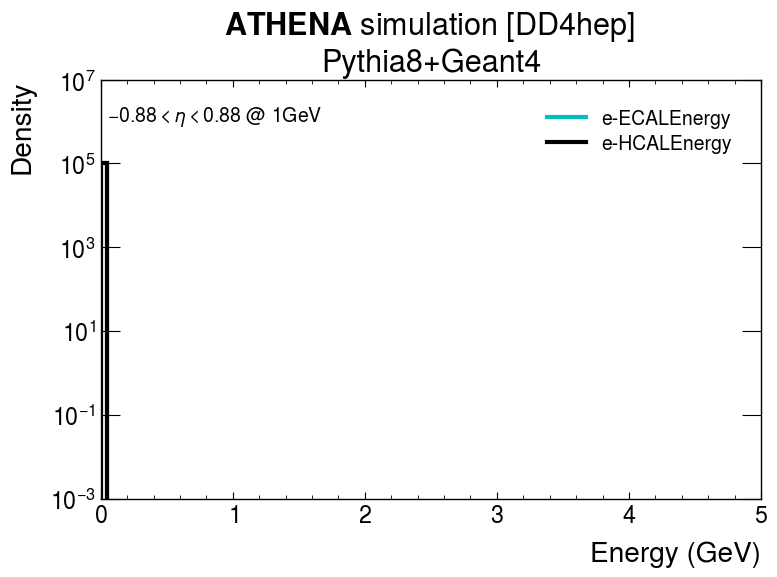

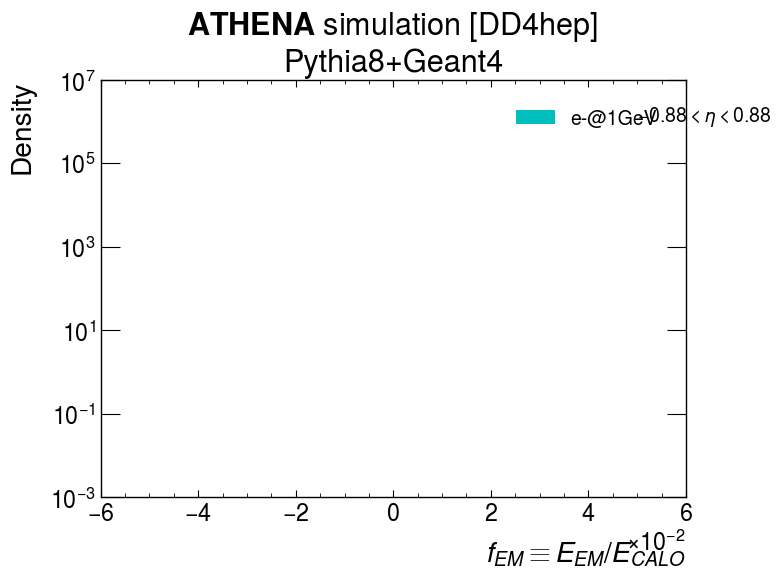

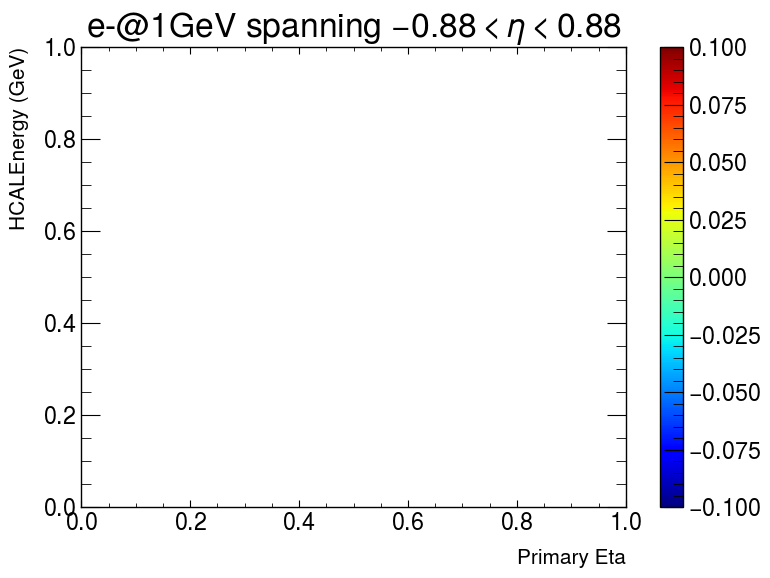

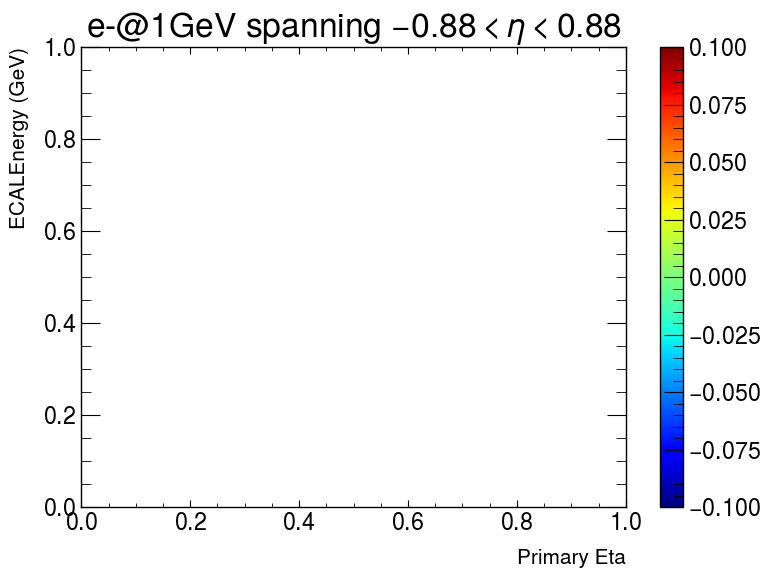

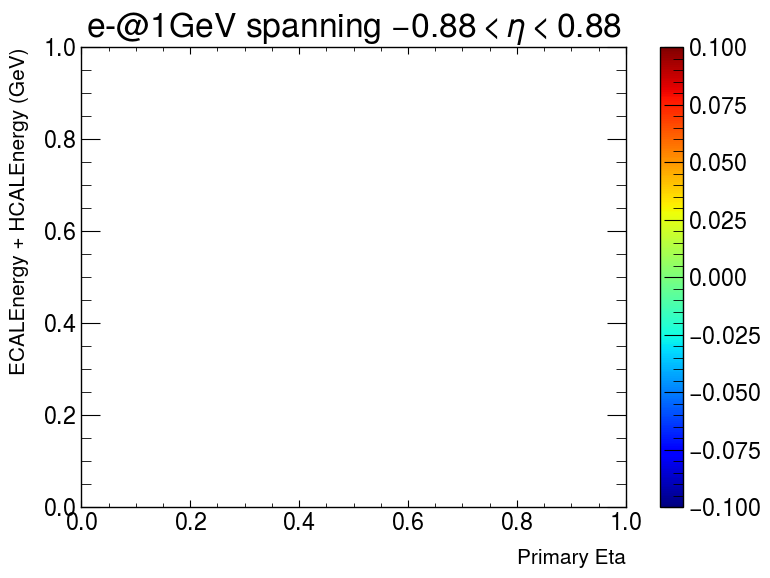

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/1GeV/130to177deg/e-_1GeV_130to177deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/1GeV/130to177deg/e-_1GeV_130to177deg.0010.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


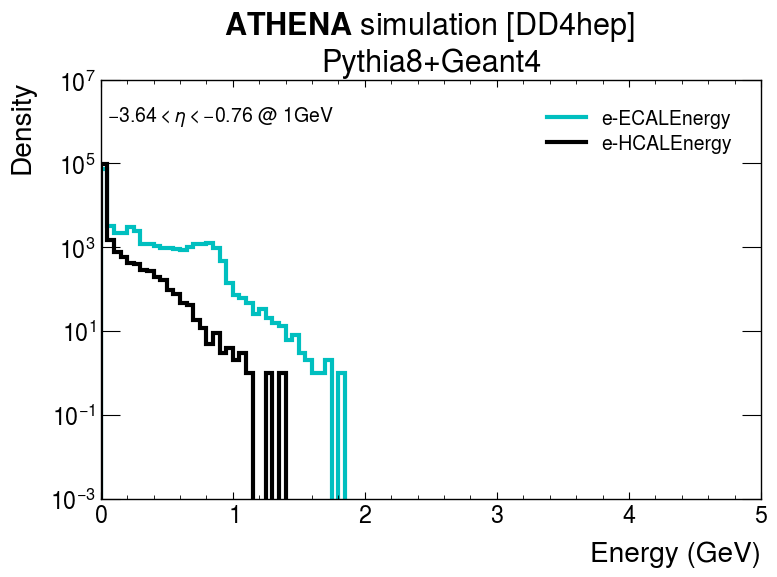

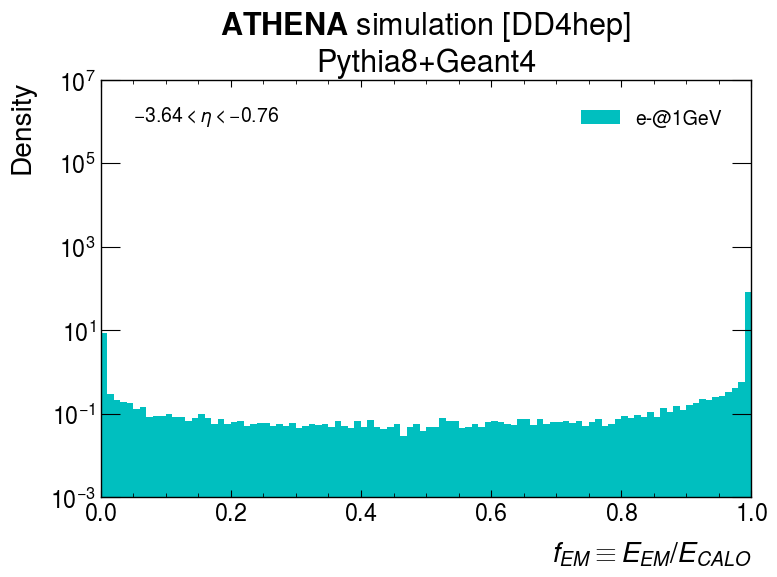

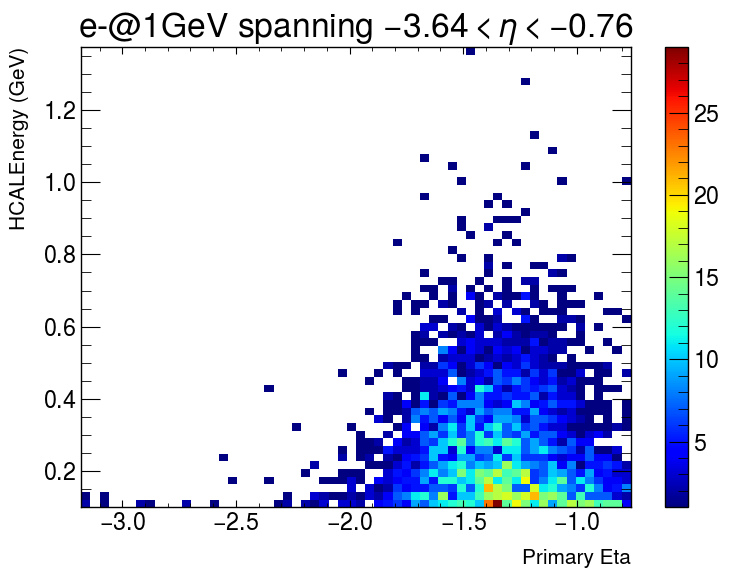

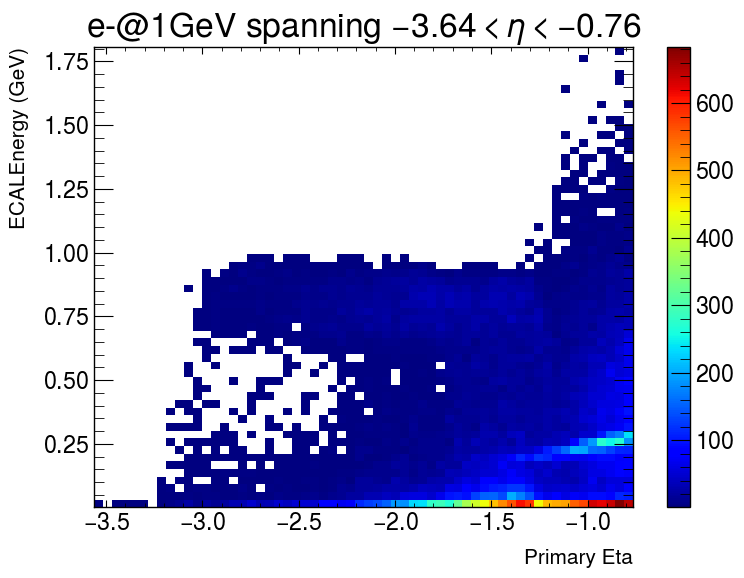

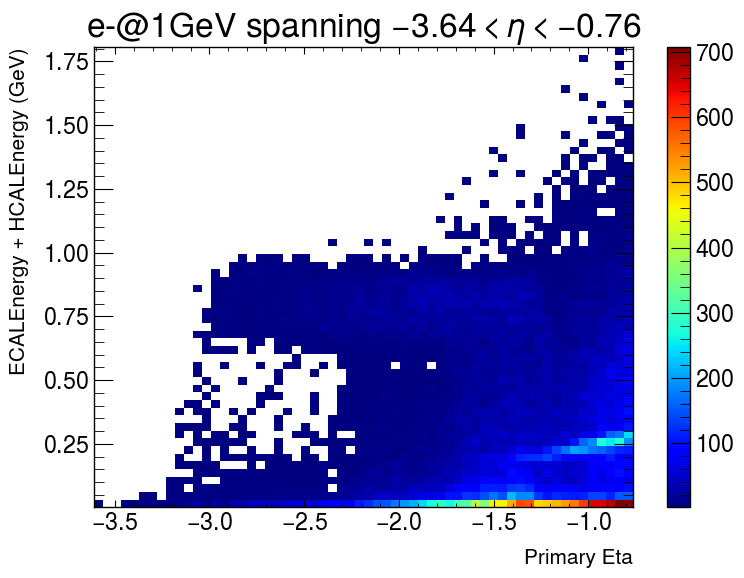

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/2GeV/130to177deg/e-_2GeV_130to177deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/2GeV/130to177deg/e-_2GeV_130to177deg.0020.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


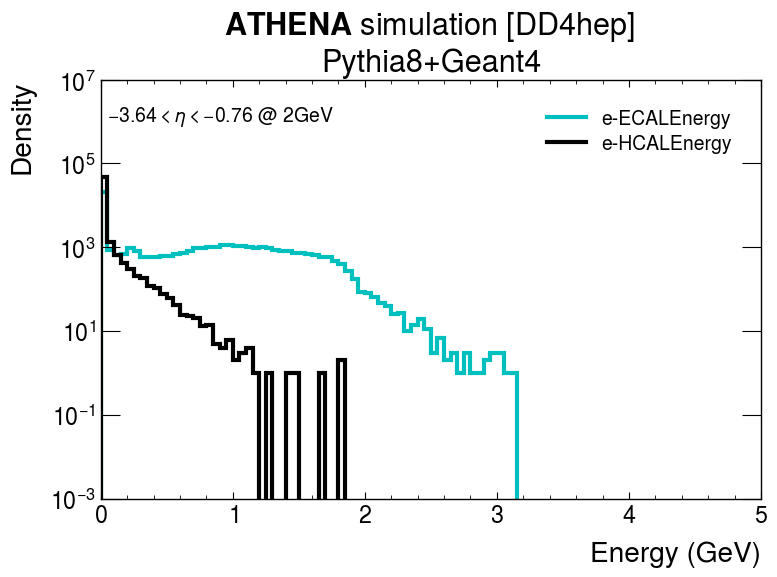

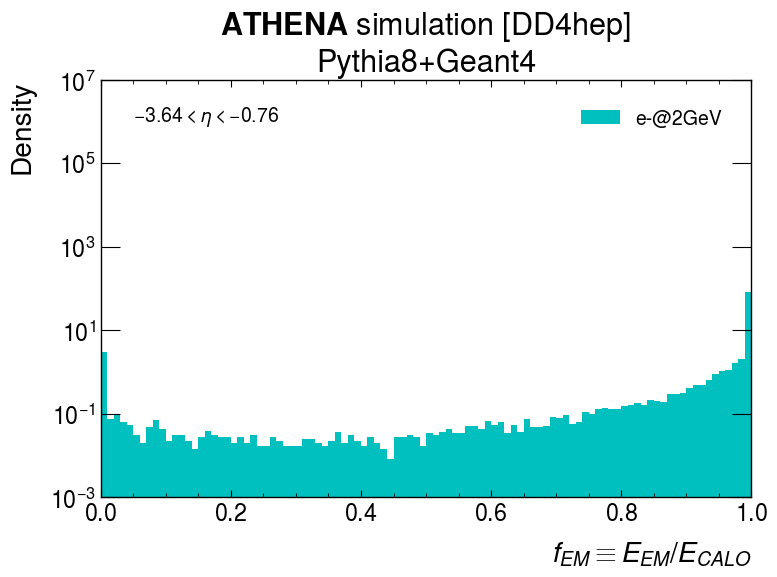

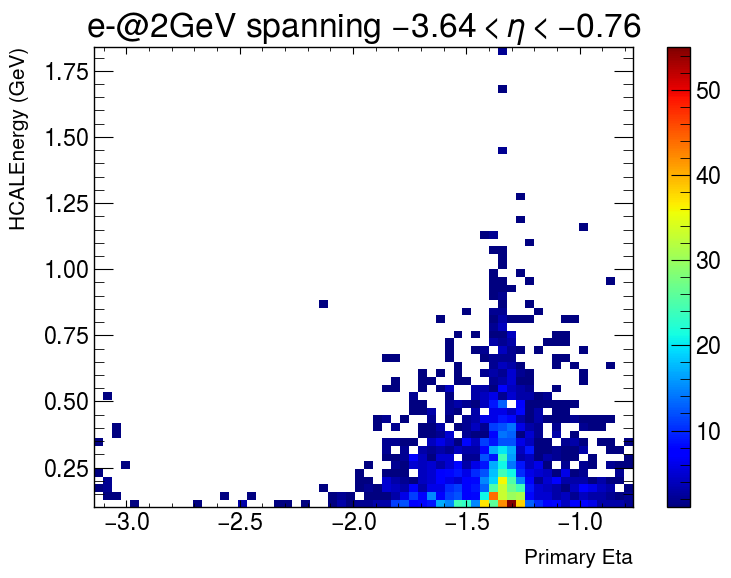

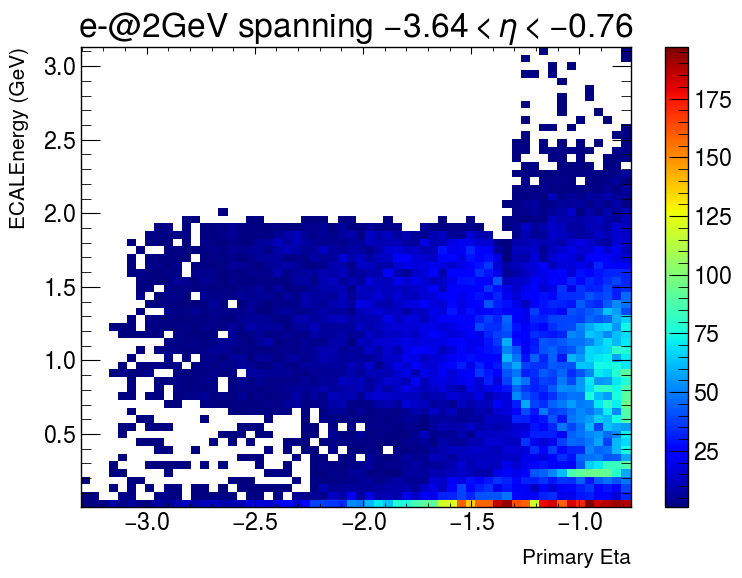

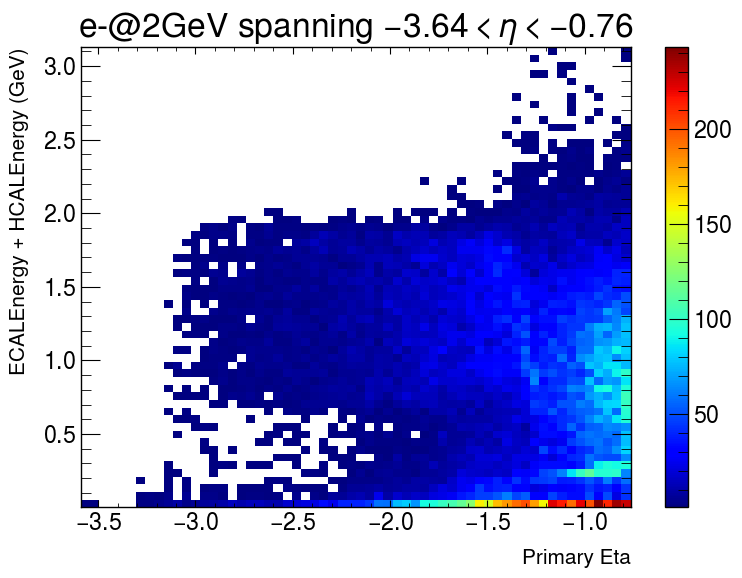

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/5GeV/130to177deg/e-_5GeV_130to177deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/5GeV/130to177deg/e-_5GeV_130to177deg.0020.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


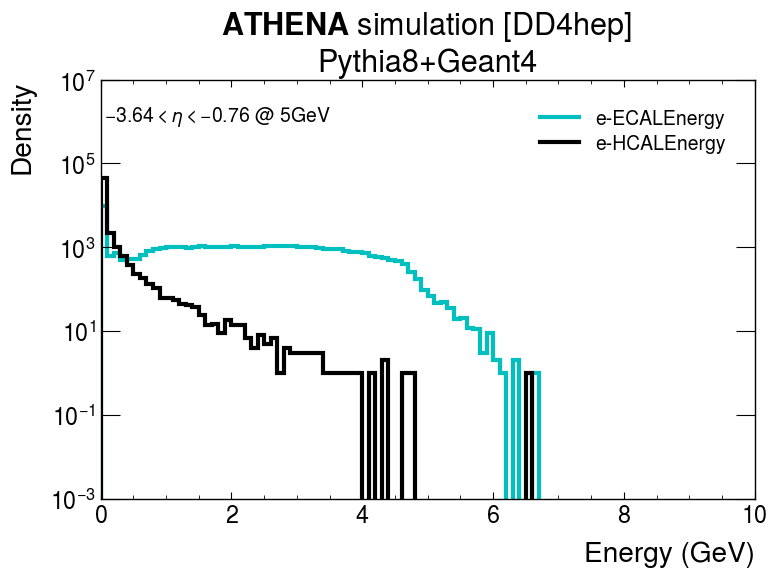

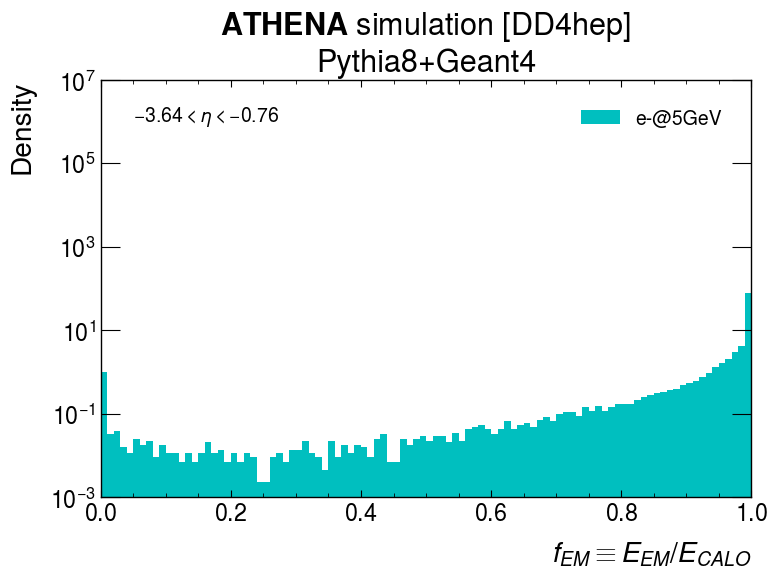

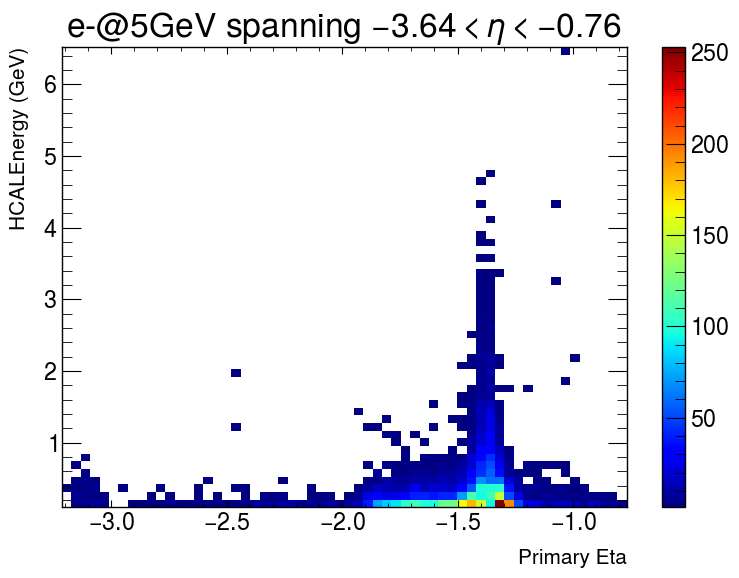

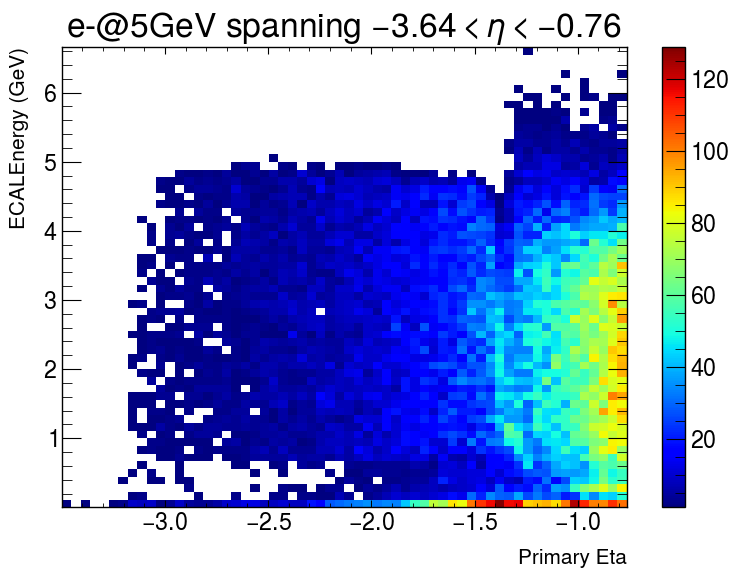

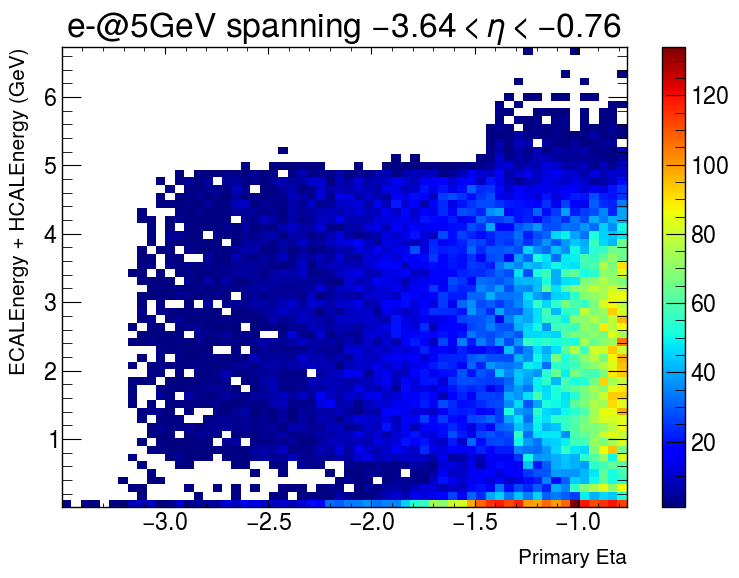

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/10GeV/130to177deg/e-_10GeV_130to177deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/10GeV/130to177deg/e-_10GeV_130to177deg.0040.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


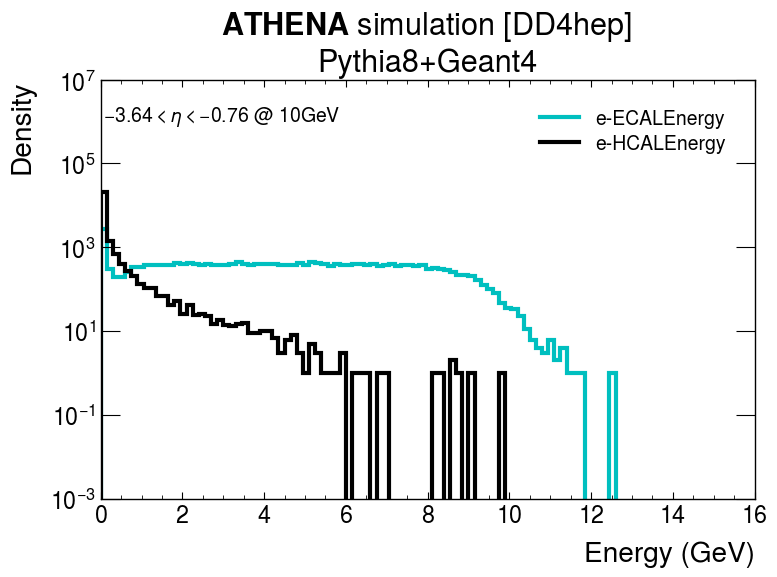

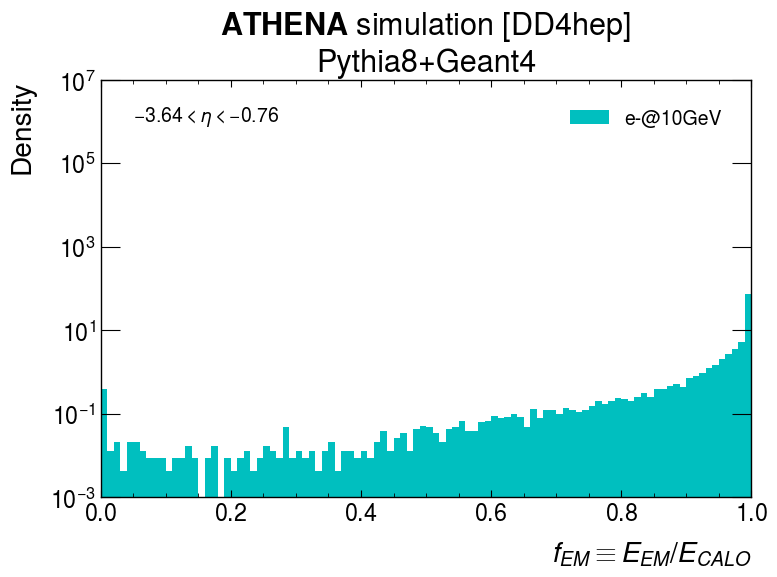

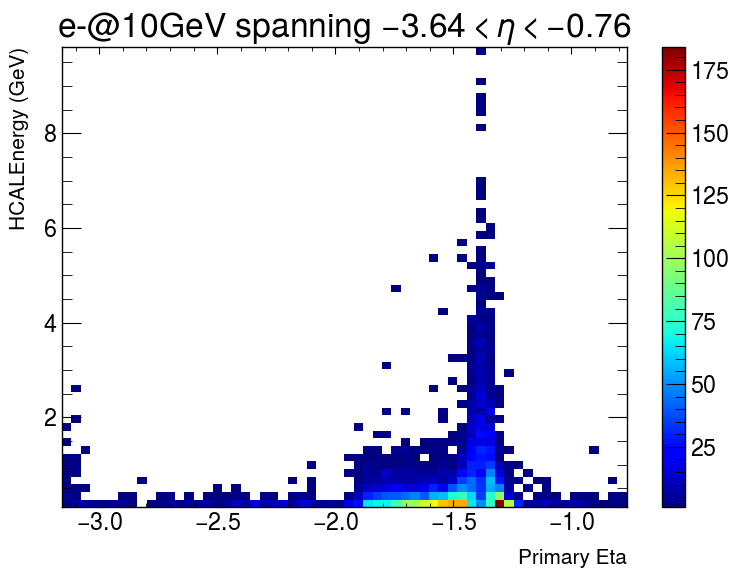

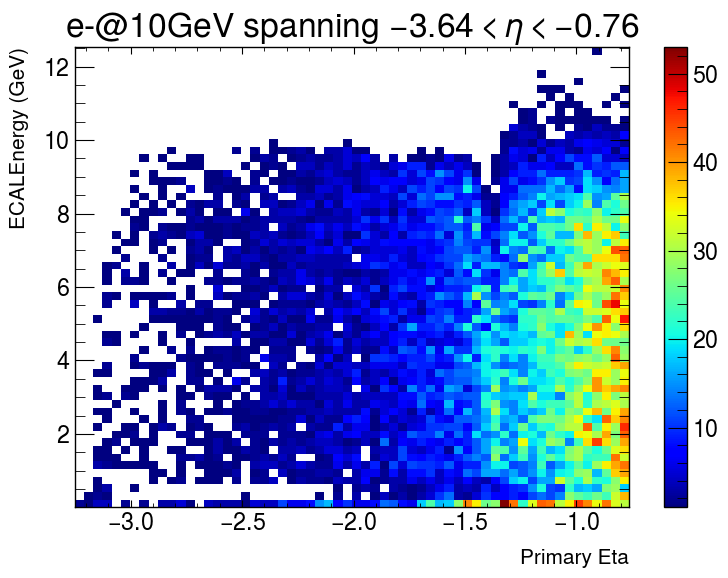

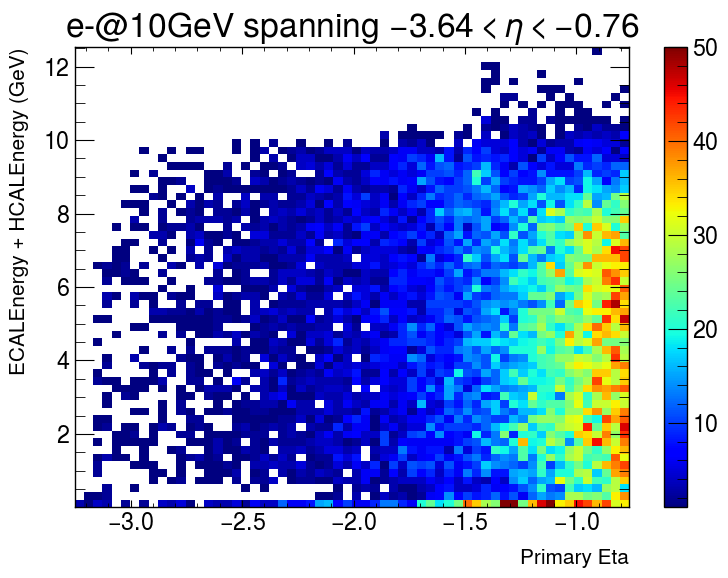

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/20GeV/130to177deg/e-_20GeV_130to177deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/20GeV/130to177deg/e-_20GeV_130to177deg.0040.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


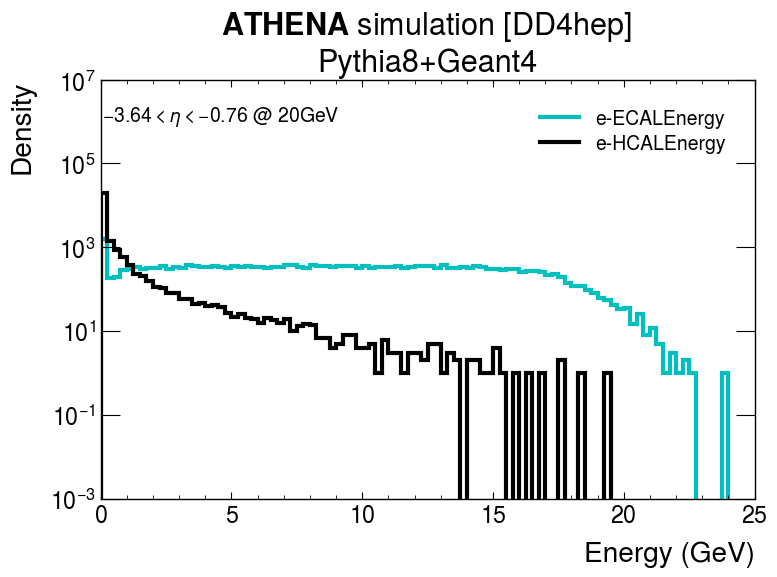

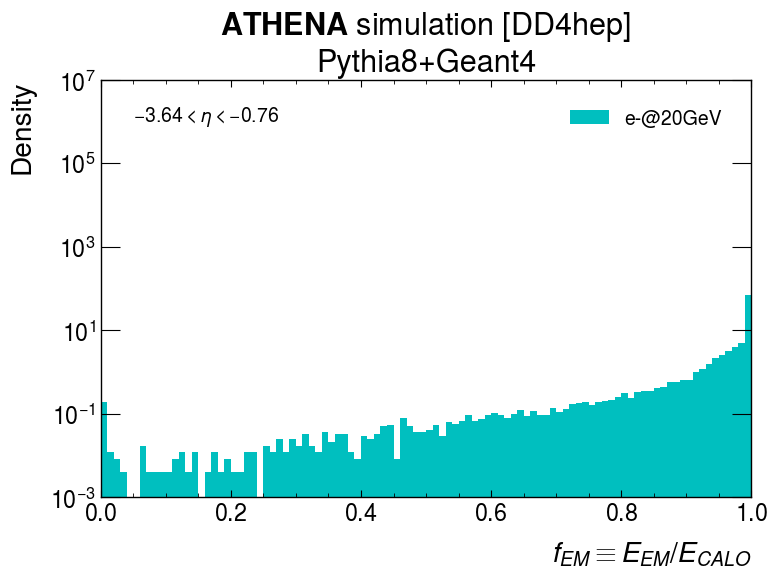

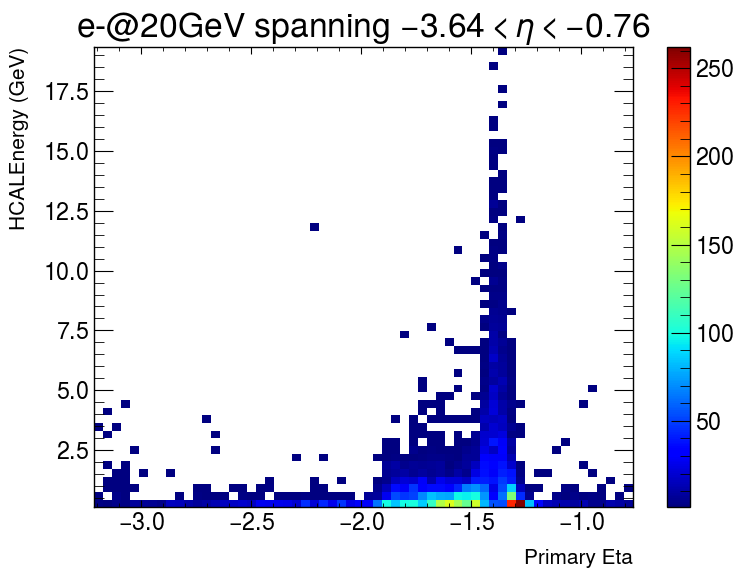

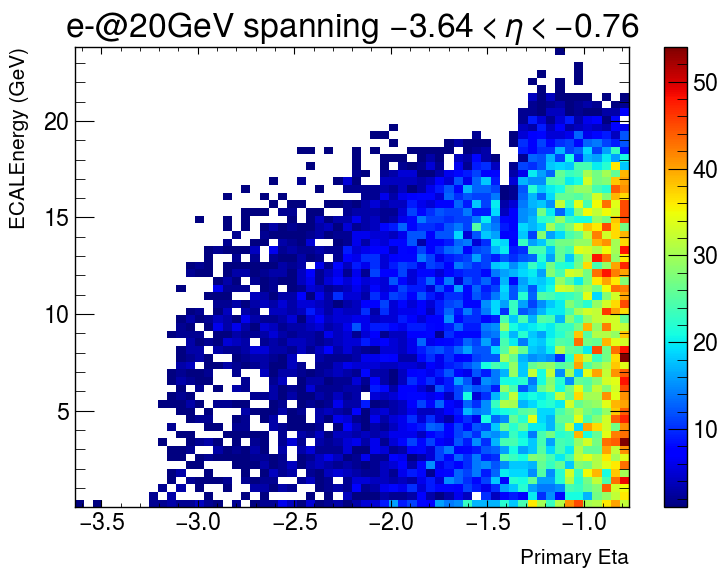

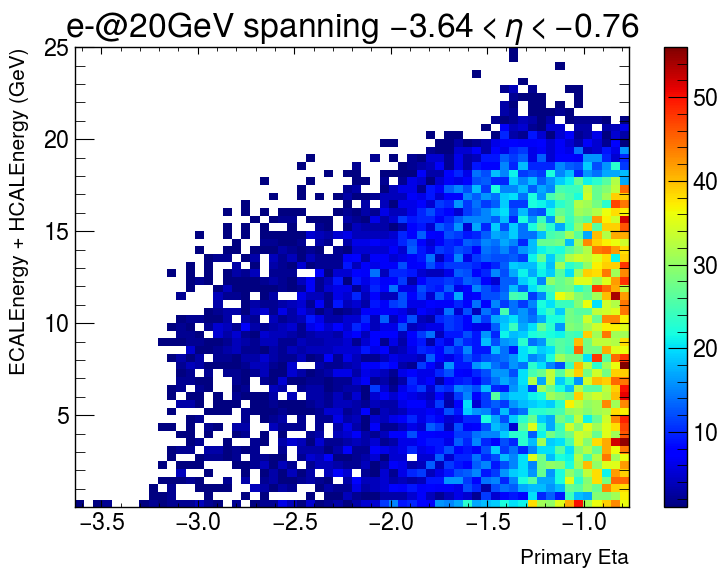

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/e-/50GeV/130to177deg/e-_50GeV_130to177deg.0100.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/e-/50GeV/130to177deg/e-_50GeV_130to177deg.0100.root
Creating histogram named e-ECALEnergyFraction ... 
Creating histogram named e-ECALEnergy ... 
Creating histogram named e-HCALEnergy ... 


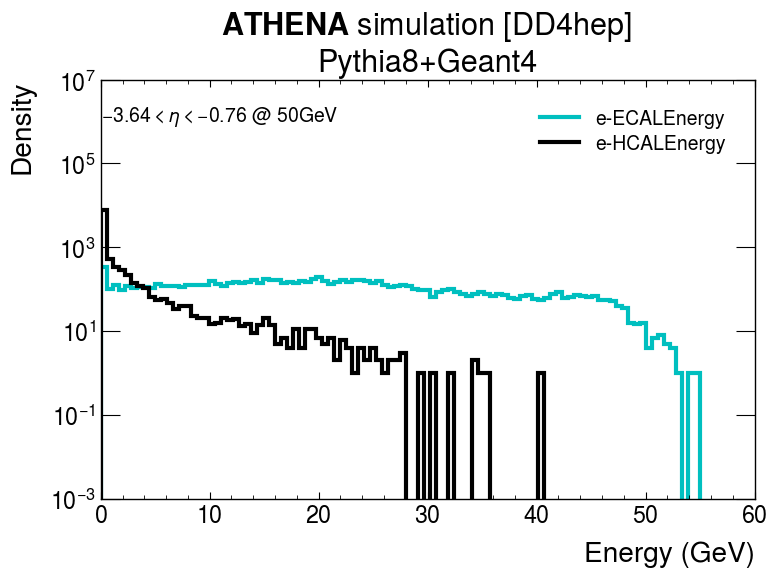

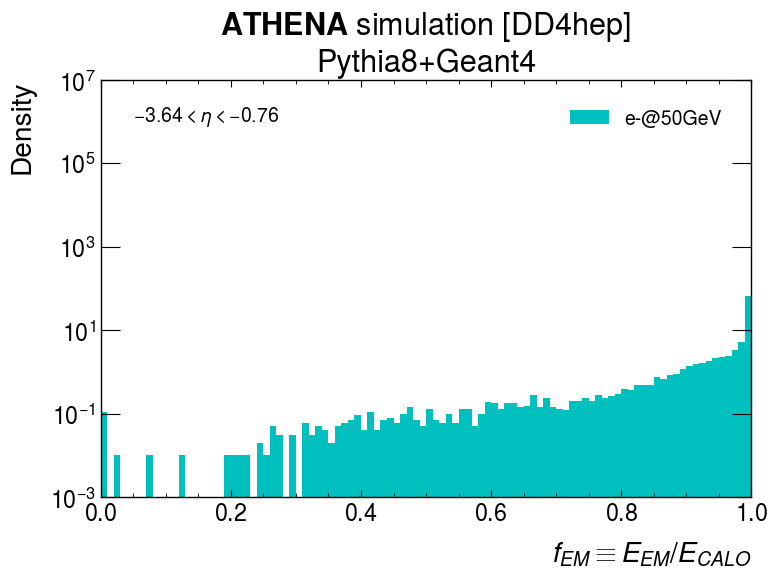

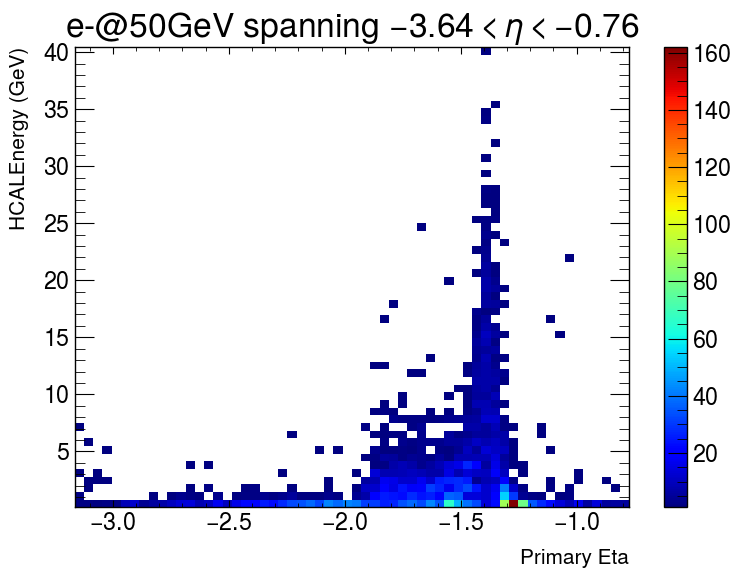

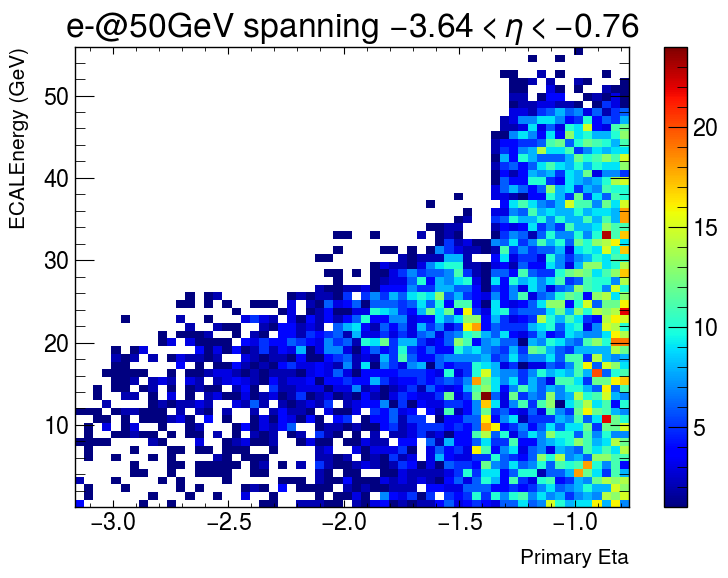

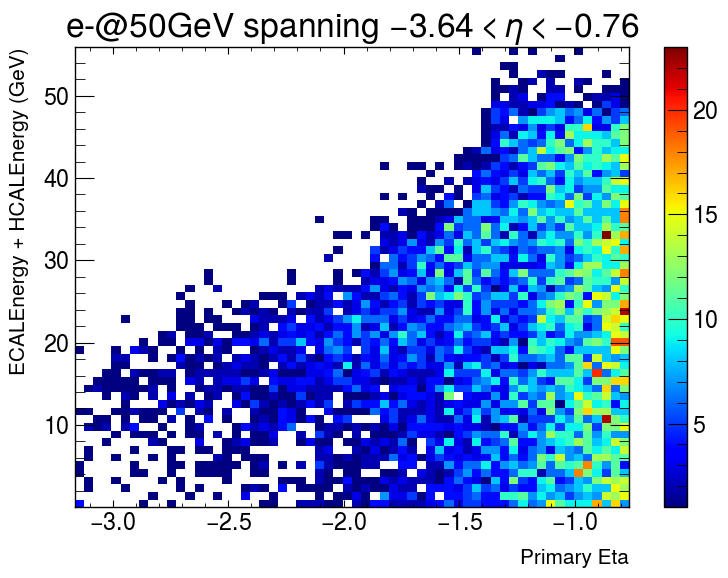

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/1GeV/45to135deg/gamma_1GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/gamma/1GeV/45to135deg/gamma_1GeV_45to135deg.0010.root
Creating histogram named gammaECALEnergyFraction ... 
Creating histogram named gammaECALEnergy ... 
Creating histogram named gammaHCALEnergy ... 


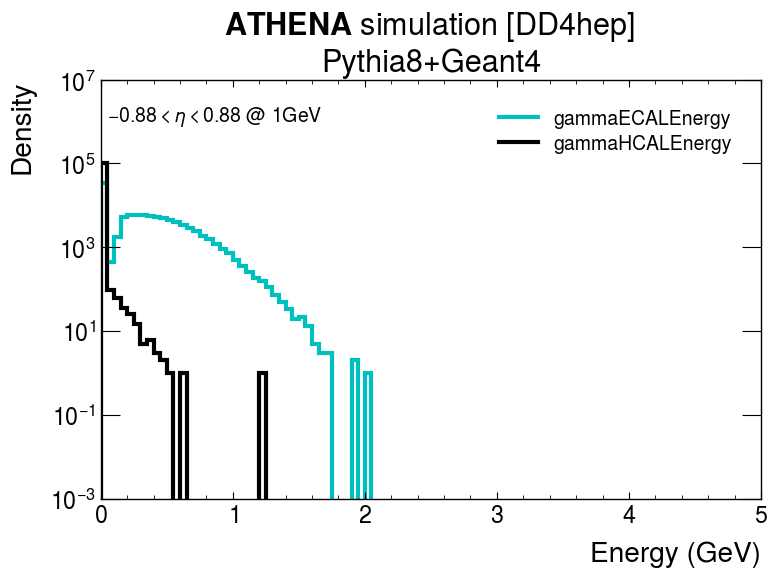

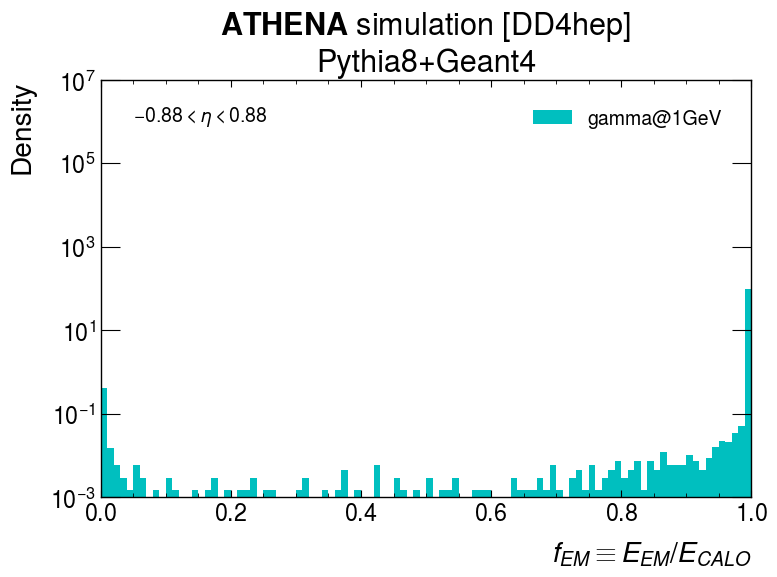

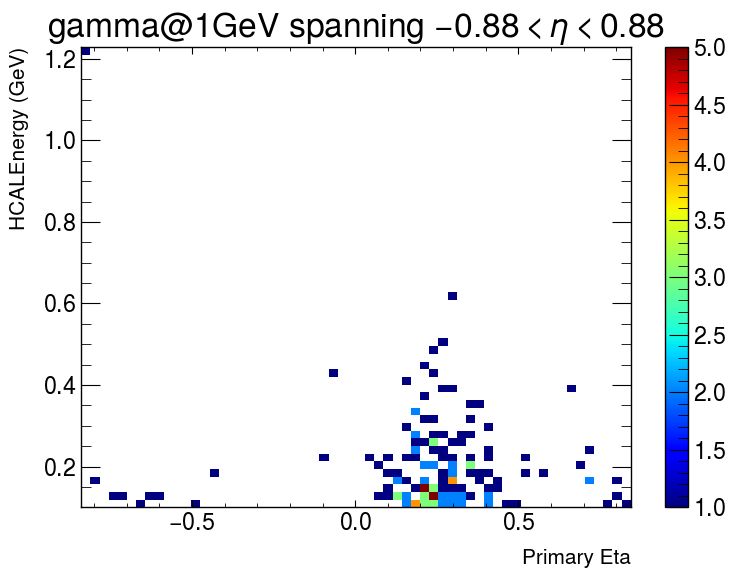

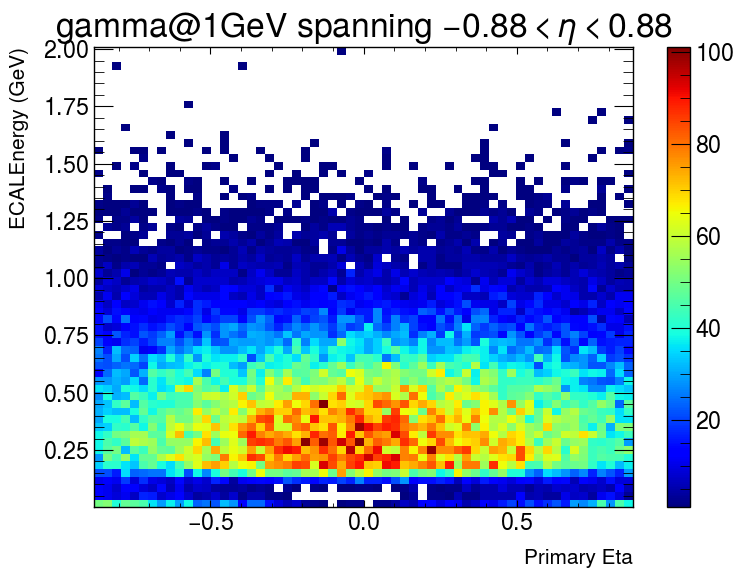

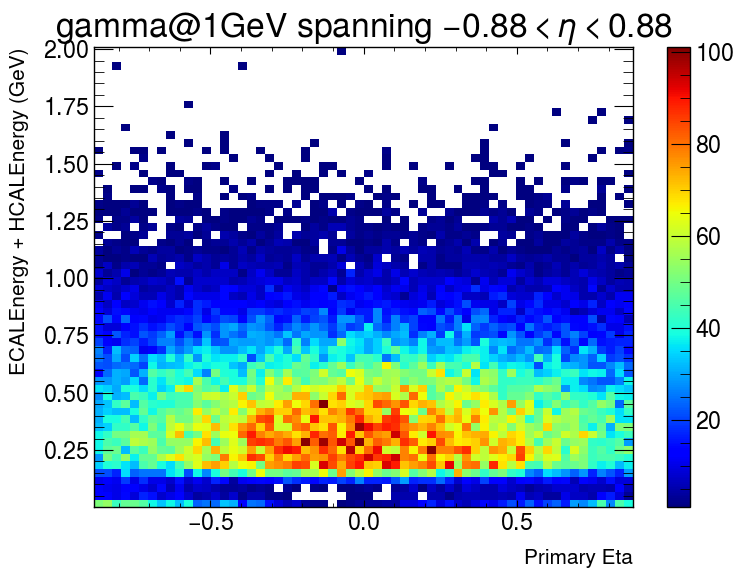

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/2GeV/45to135deg/gamma_2GeV_45to135deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/gamma/2GeV/45to135deg/gamma_2GeV_45to135deg.0020.root
Creating histogram named gammaECALEnergyFraction ... 
Creating histogram named gammaECALEnergy ... 
Creating histogram named gammaHCALEnergy ... 


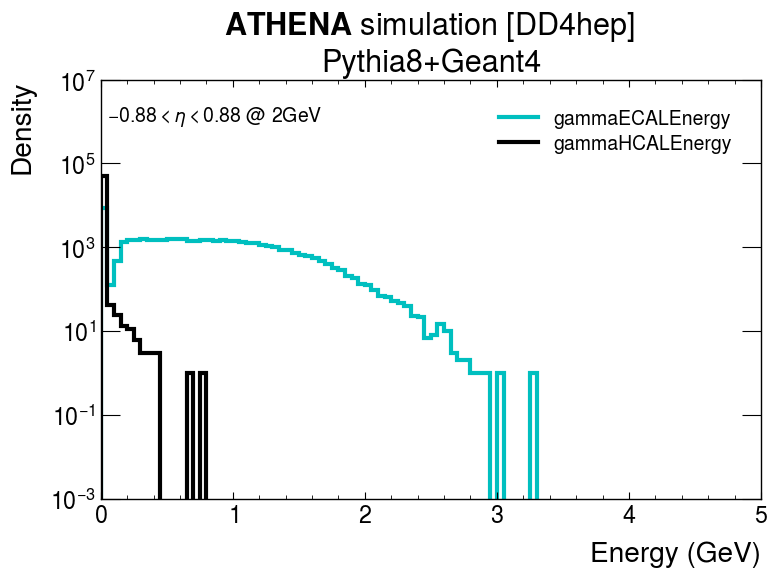

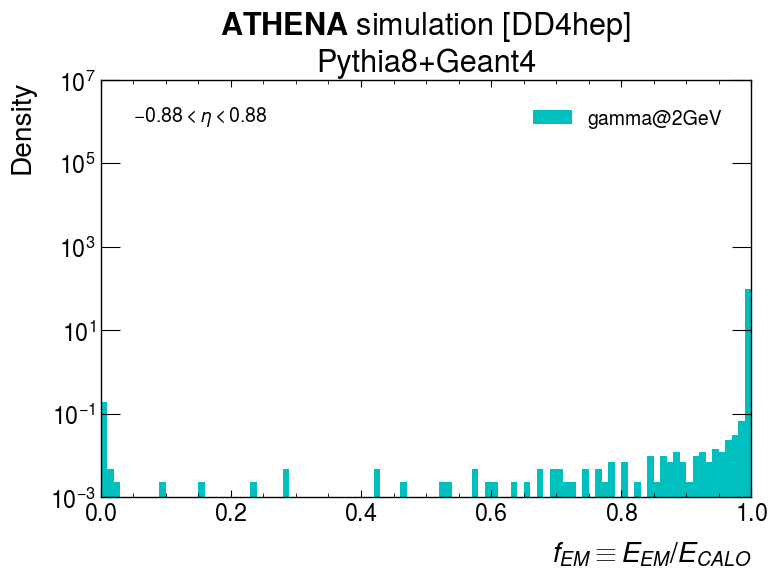

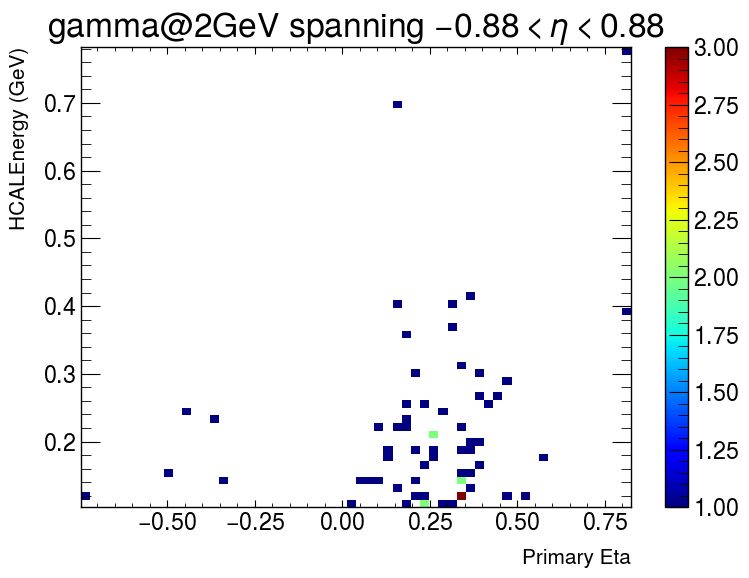

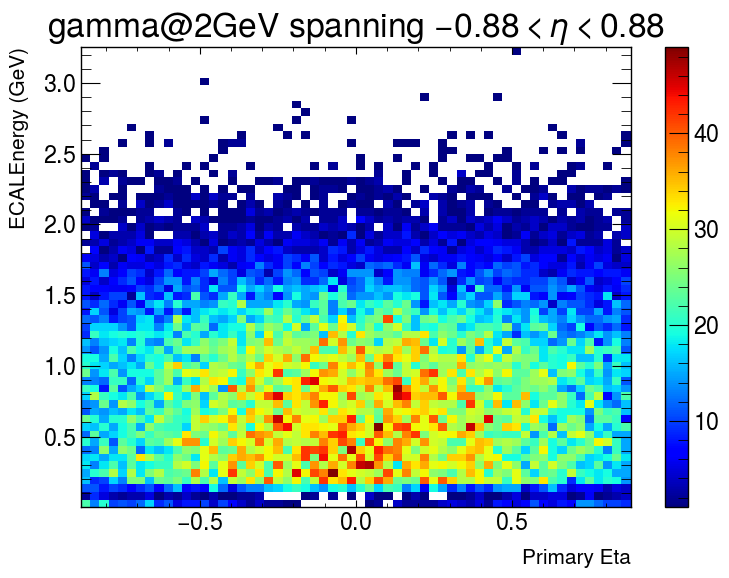

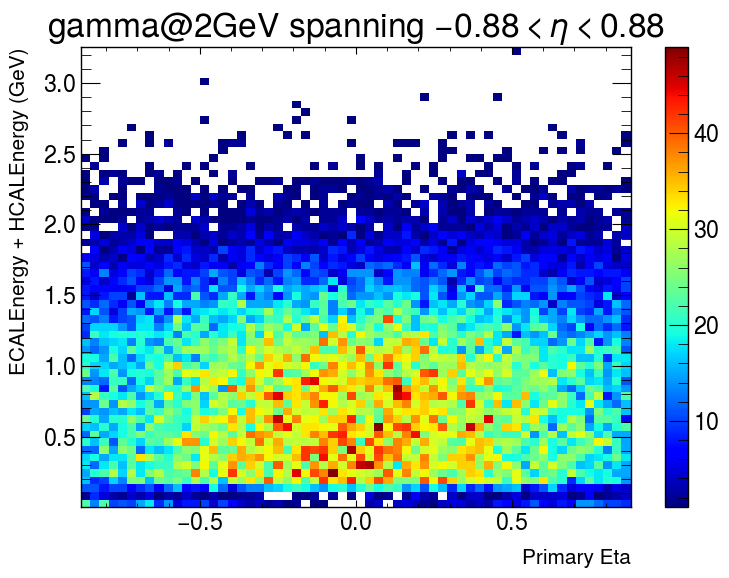

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/5GeV/45to135deg/gamma_5GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/gamma/5GeV/45to135deg/gamma_5GeV_45to135deg.0040.root
Creating histogram named gammaECALEnergyFraction ... 
Creating histogram named gammaECALEnergy ... 
Creating histogram named gammaHCALEnergy ... 


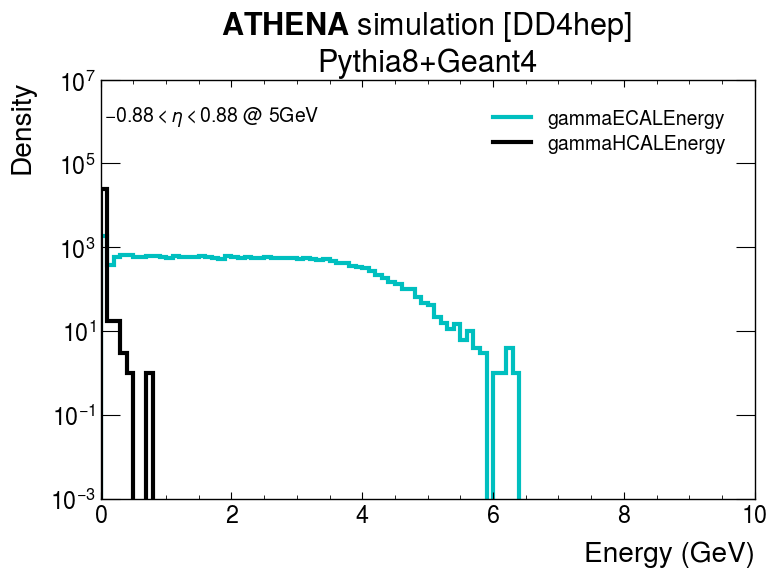

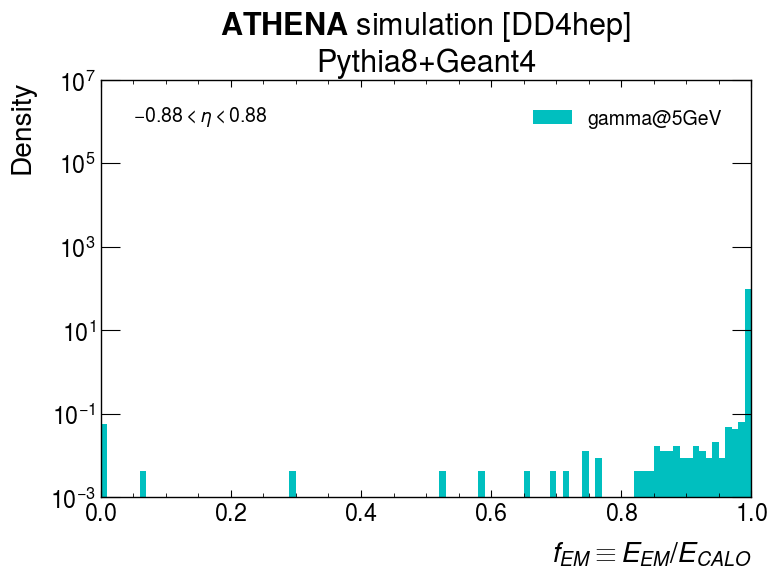

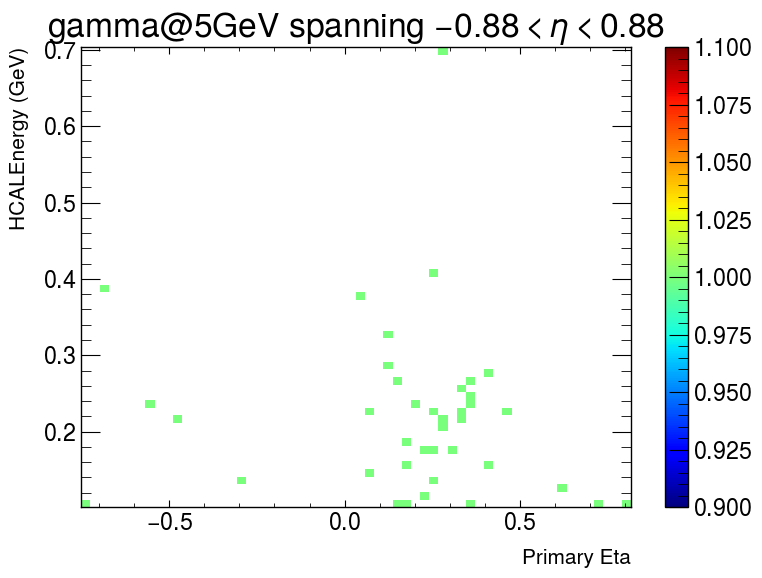

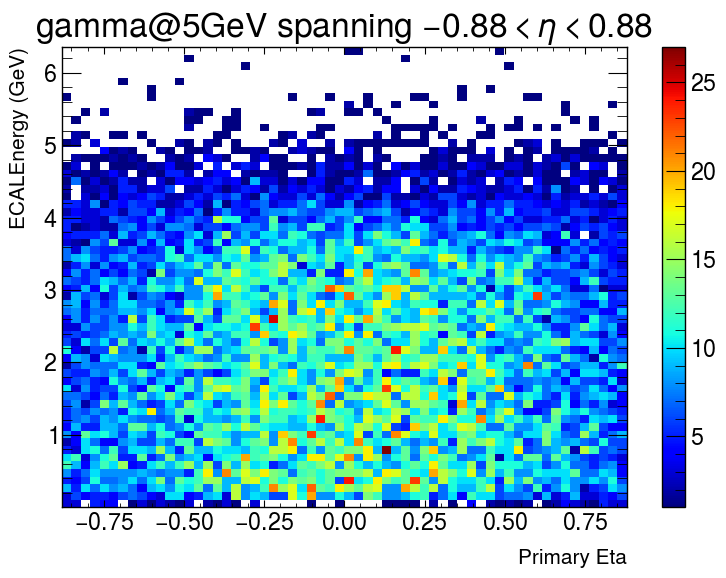

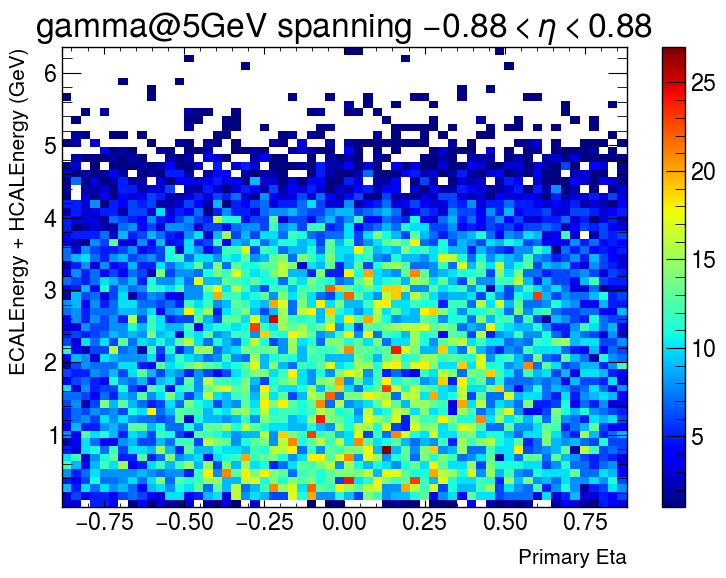

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/10GeV/45to135deg/gamma_10GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/gamma/10GeV/45to135deg/gamma_10GeV_45to135deg.0040.root
Creating histogram named gammaECALEnergyFraction ... 
Creating histogram named gammaECALEnergy ... 
Creating histogram named gammaHCALEnergy ... 


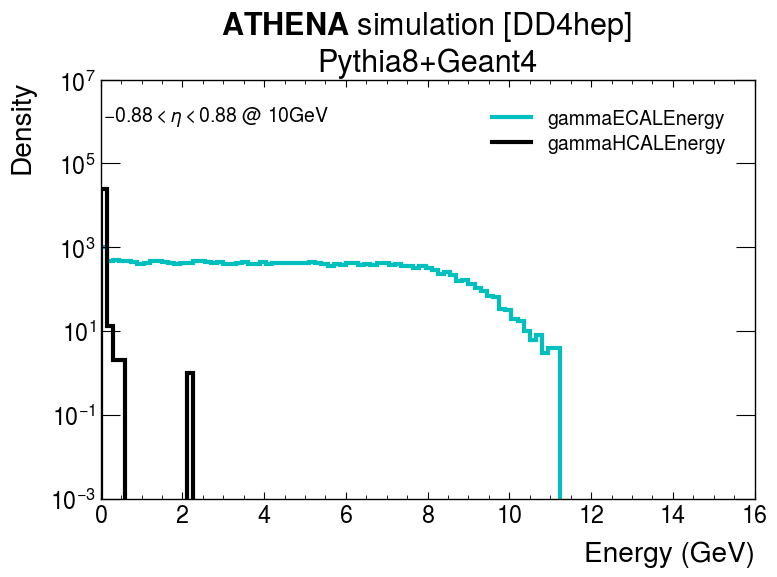

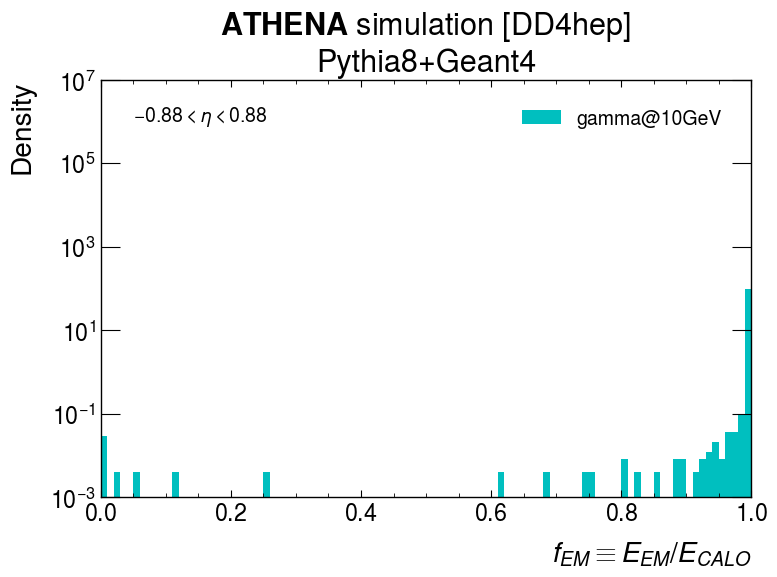

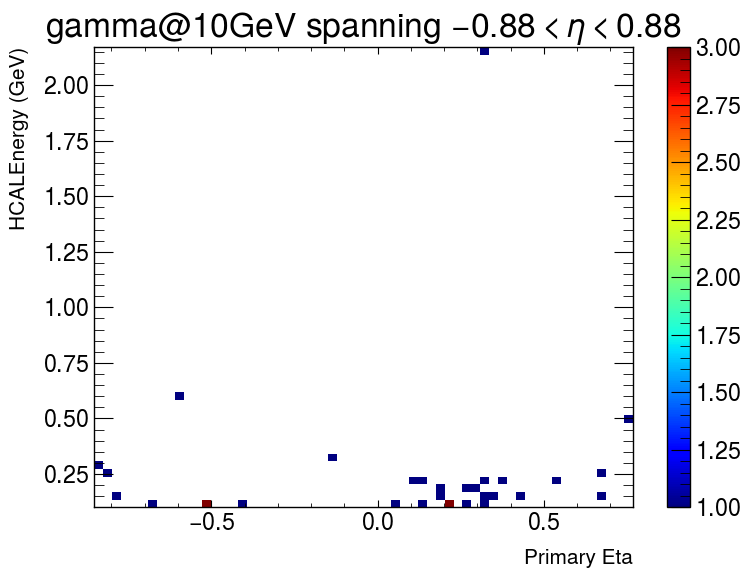

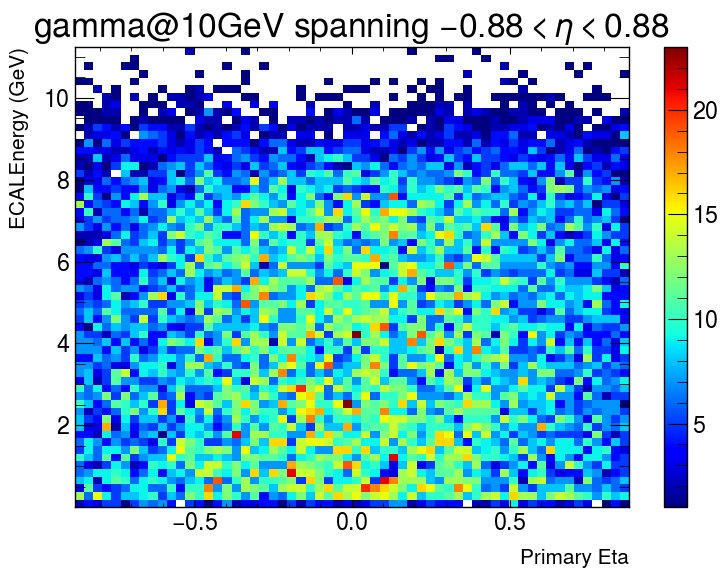

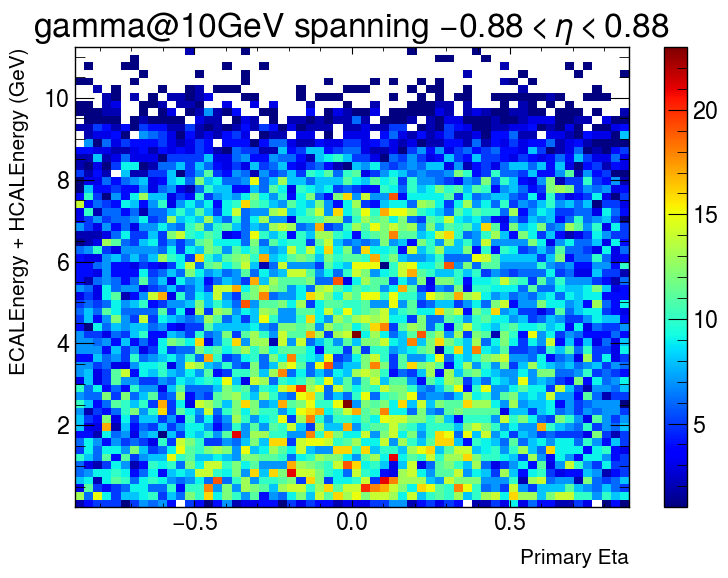

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/gamma/20GeV/45to135deg/gamma_20GeV_45to135deg.0100.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/gamma/20GeV/45to135deg/gamma_20GeV_45to135deg.0100.root
Creating histogram named gammaECALEnergyFraction ... 
Creating histogram named gammaECALEnergy ... 
Creating histogram named gammaHCALEnergy ... 


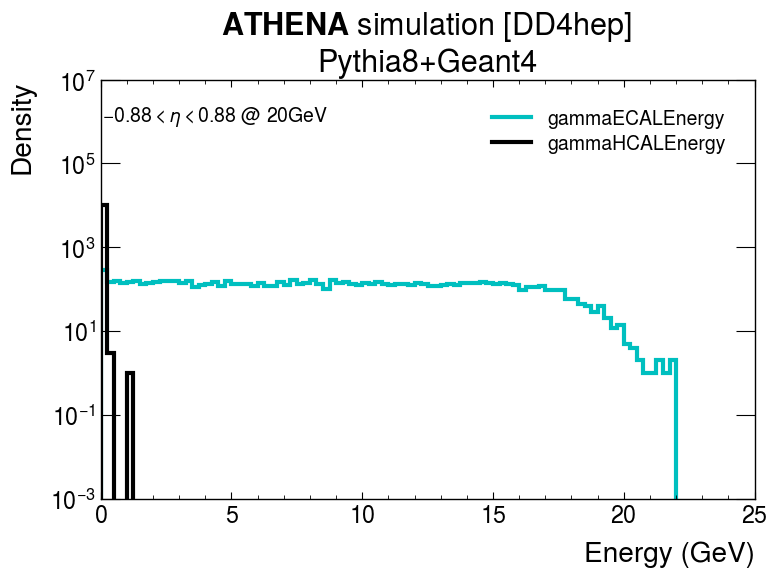

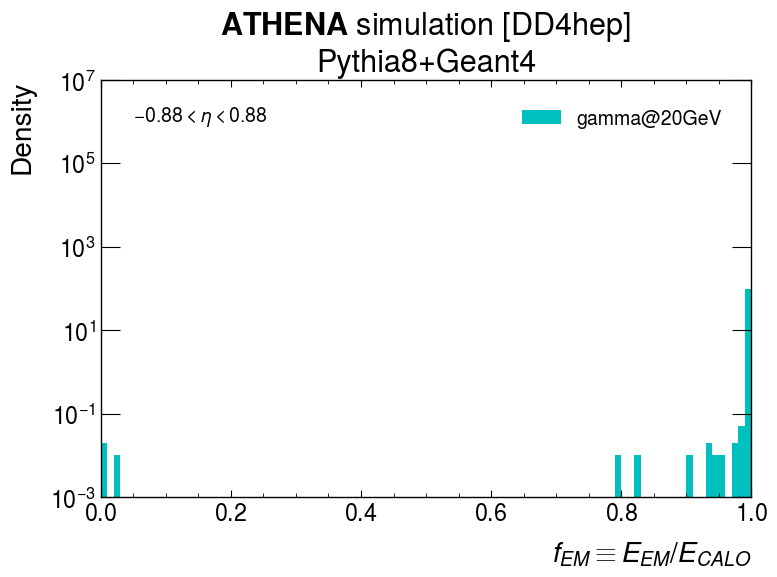

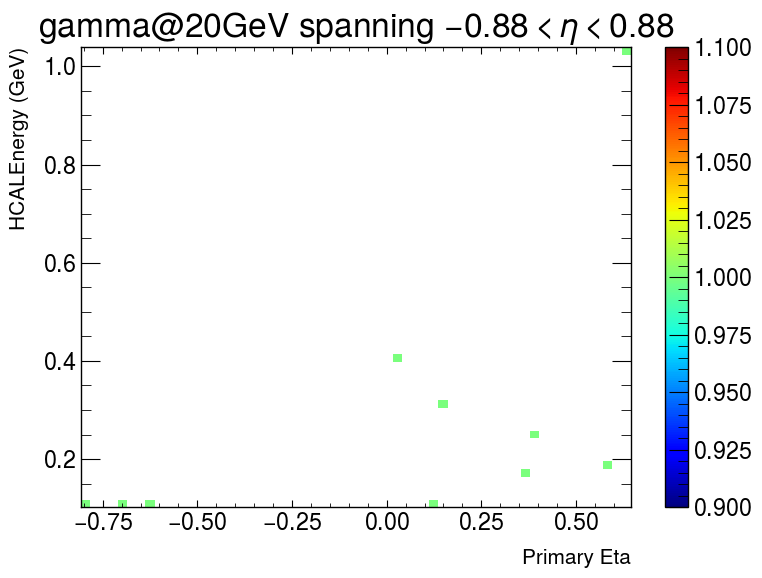

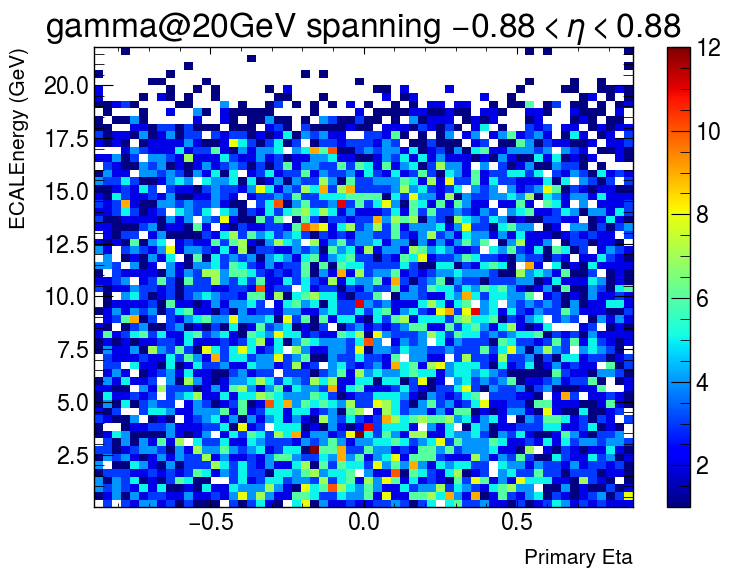

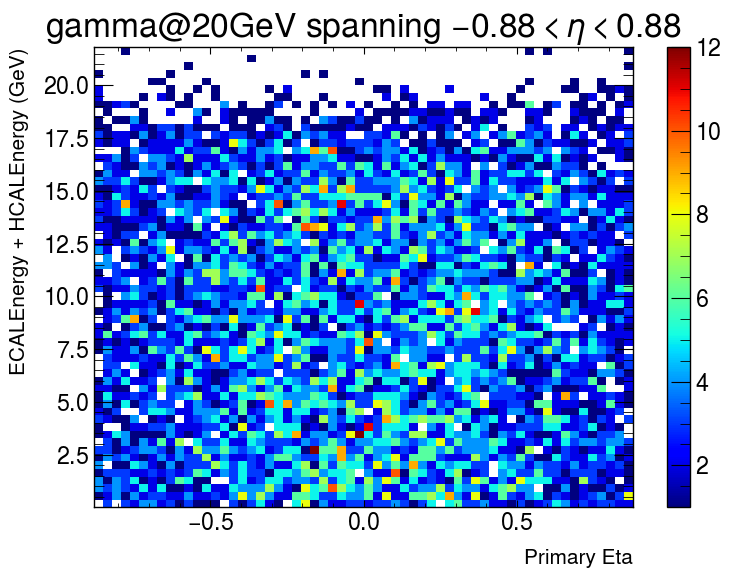

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/1GeV/3to50deg/kaon0L_1GeV_3to50deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/1GeV/3to50deg/kaon0L_1GeV_3to50deg.0010.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


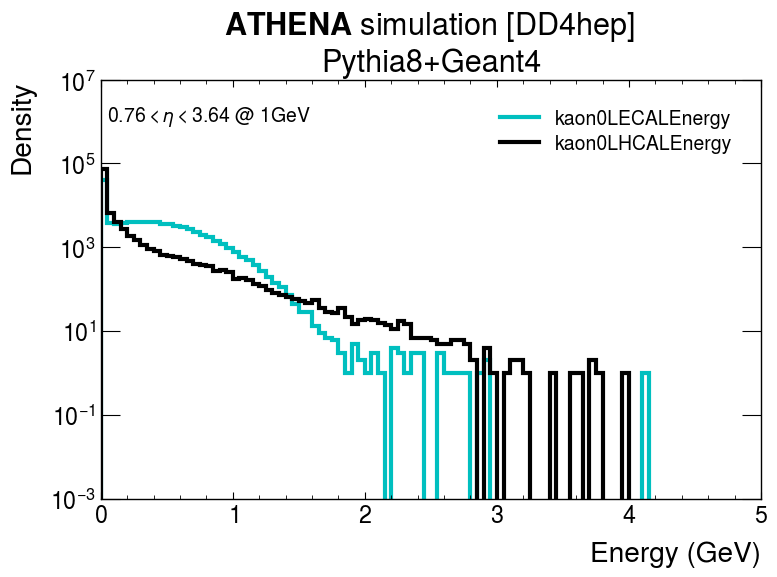

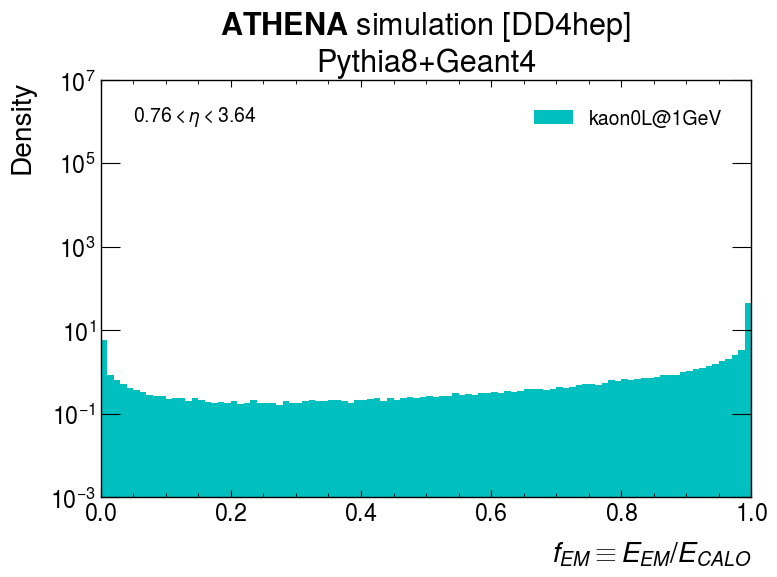

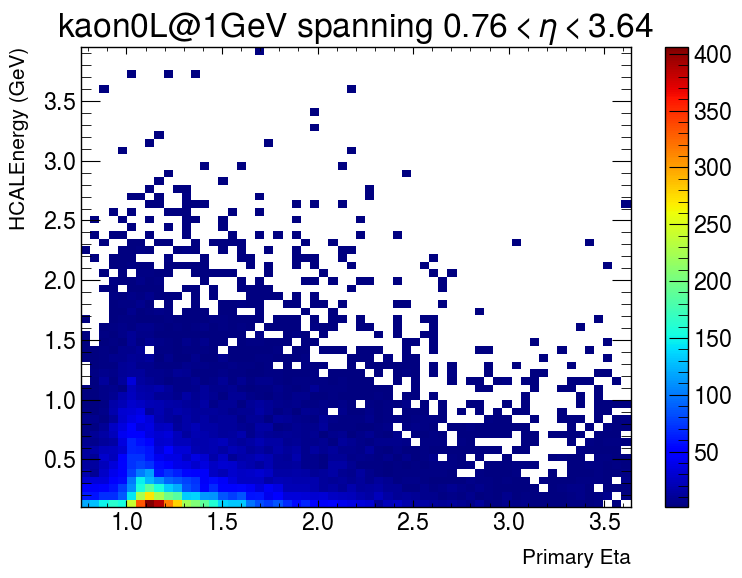

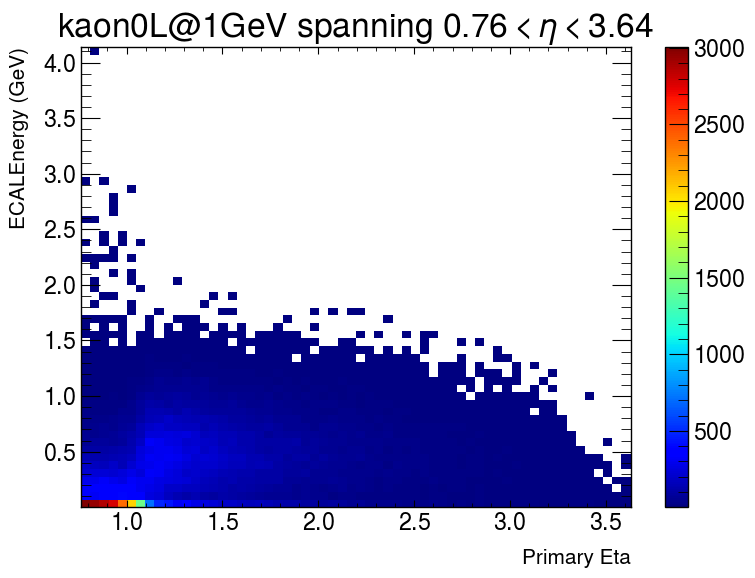

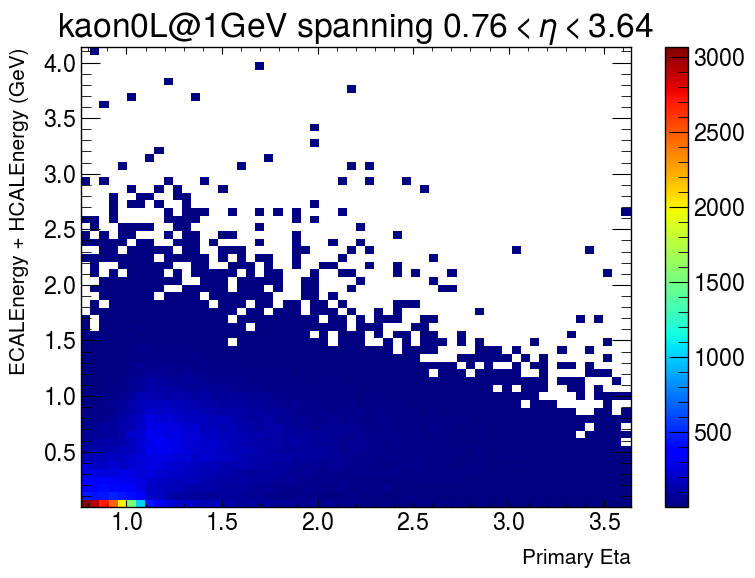

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/1GeV/45to135deg/kaon0L_1GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/1GeV/45to135deg/kaon0L_1GeV_45to135deg.0010.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


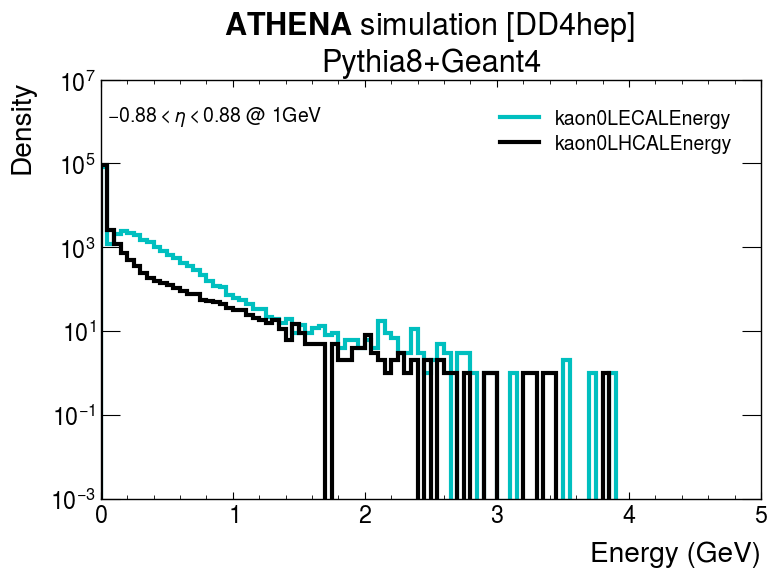

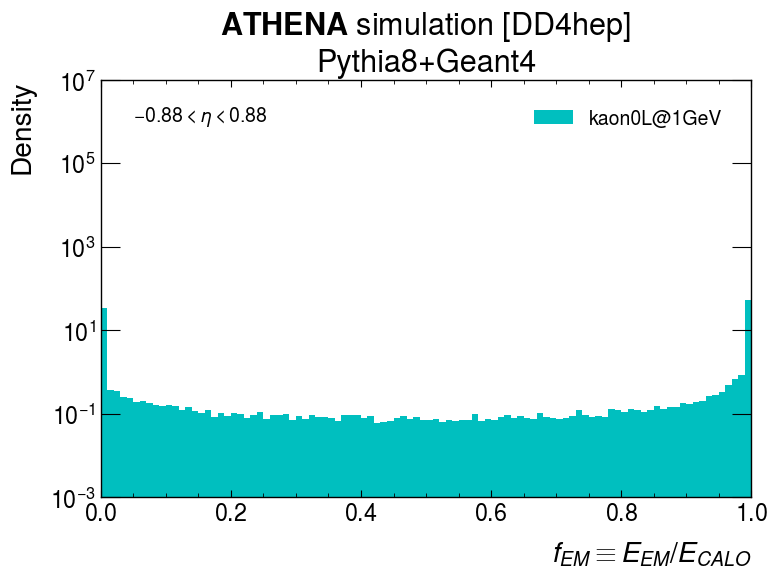

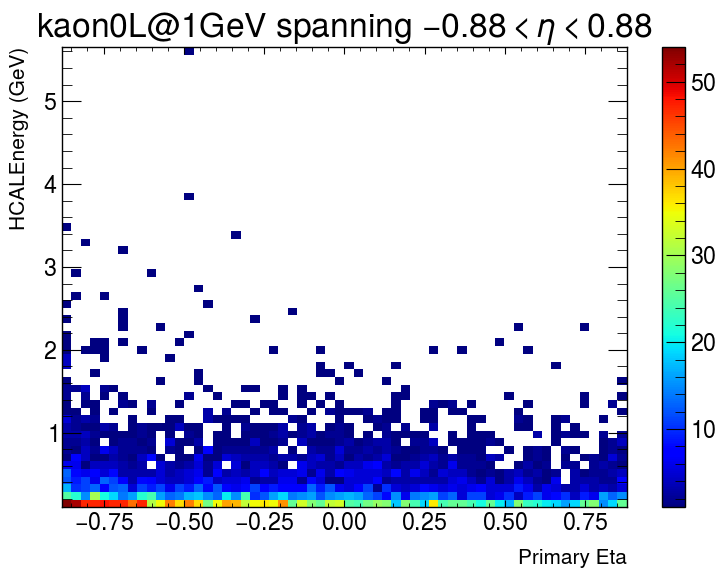

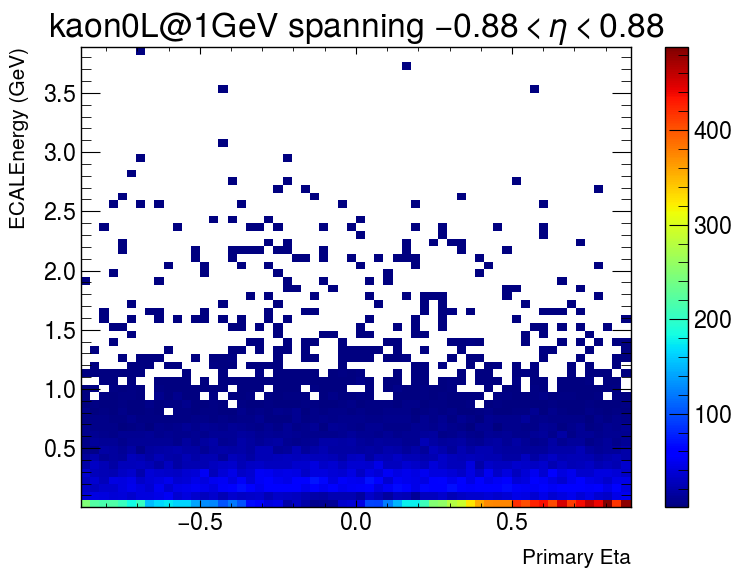

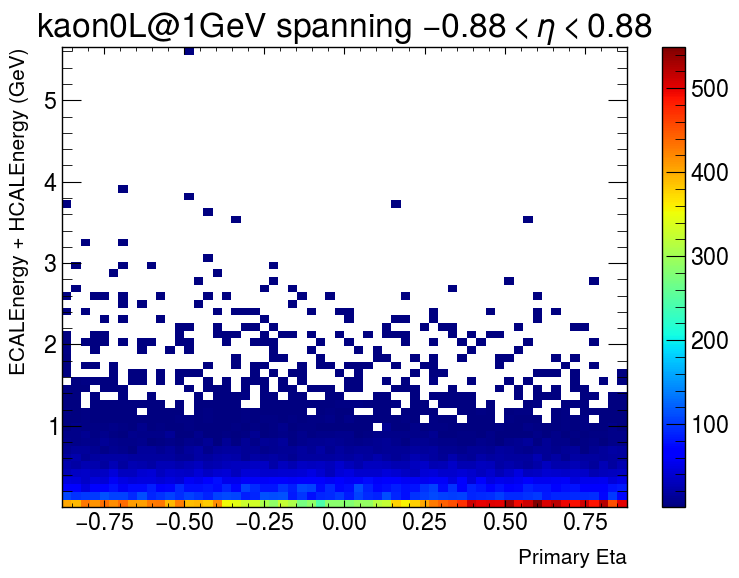

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/2GeV/3to50deg/kaon0L_2GeV_3to50deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/2GeV/3to50deg/kaon0L_2GeV_3to50deg.0010.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


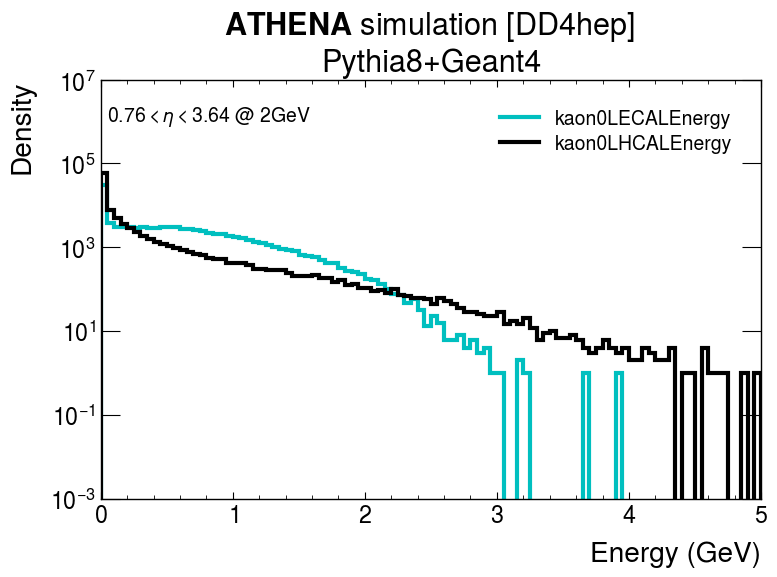

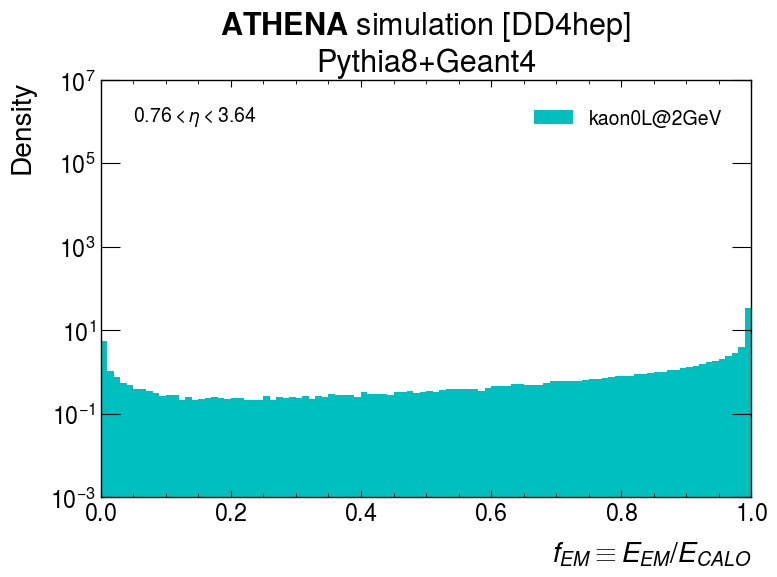

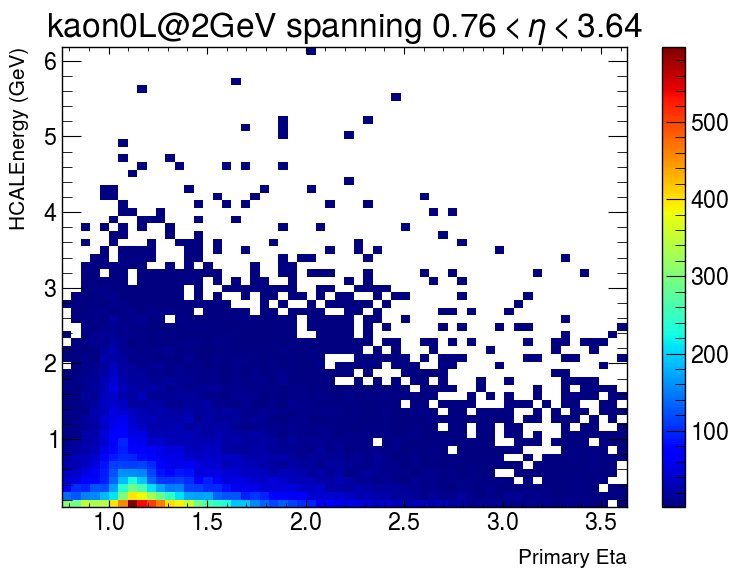

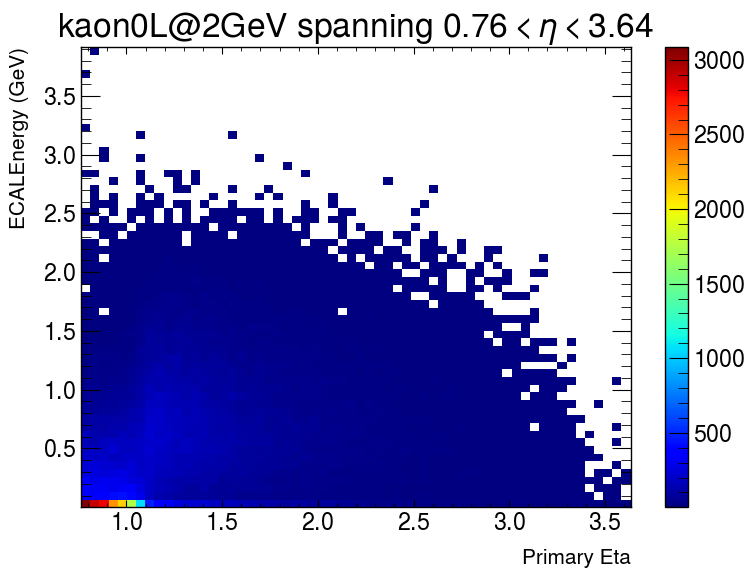

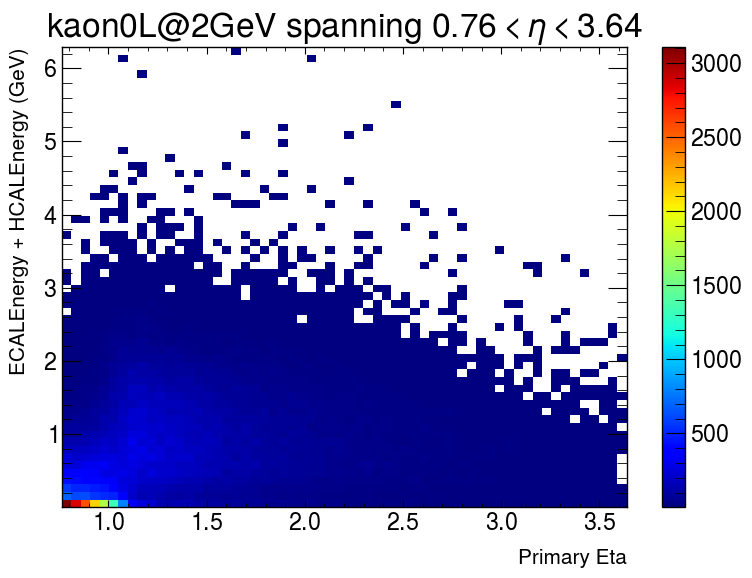

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/2GeV/45to135deg/kaon0L_2GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/2GeV/45to135deg/kaon0L_2GeV_45to135deg.0010.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


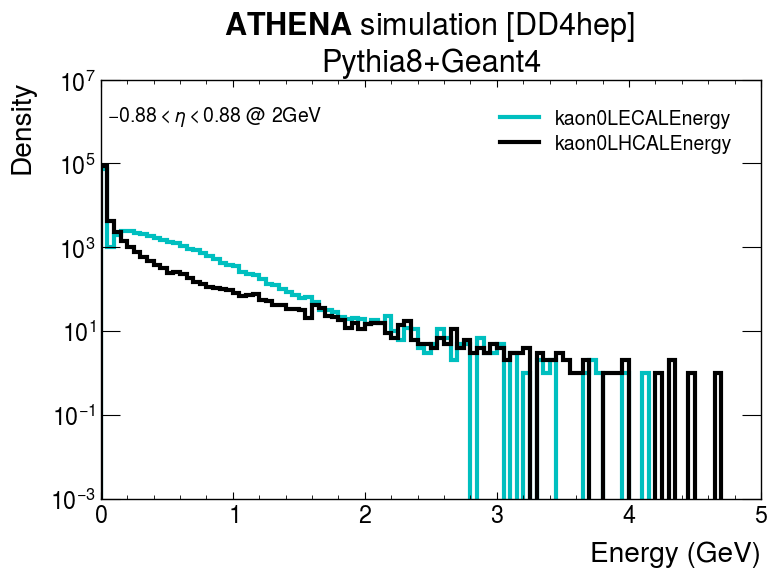

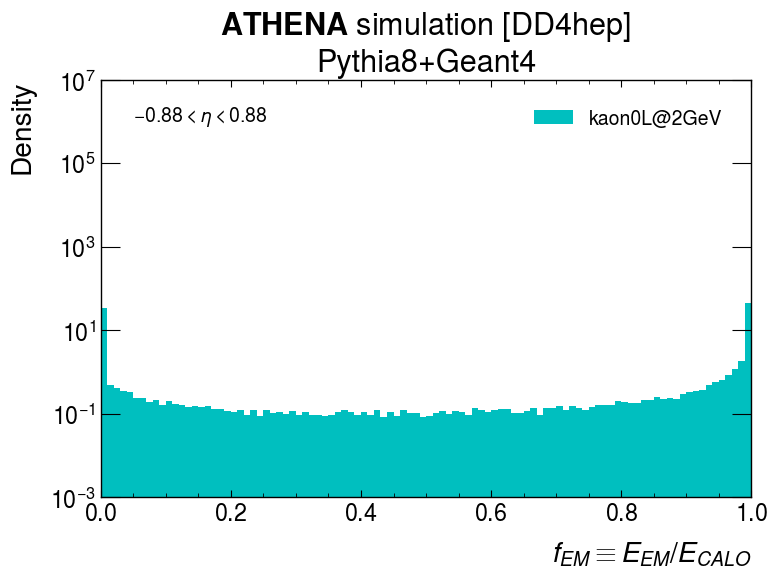

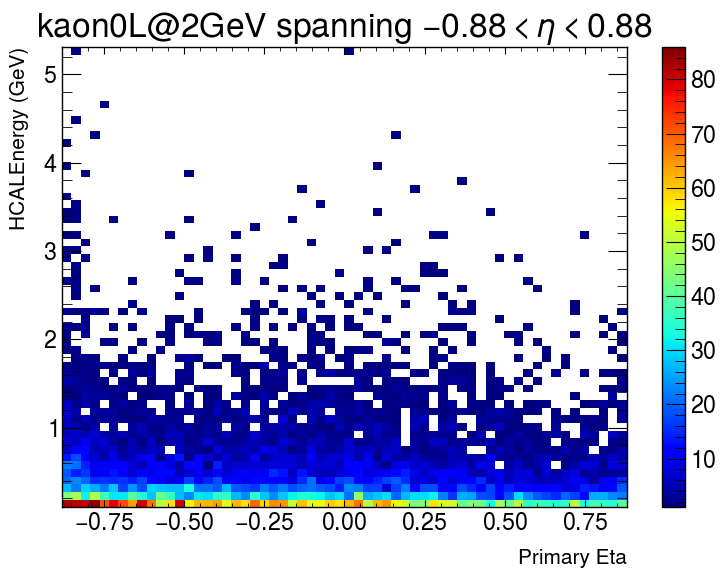

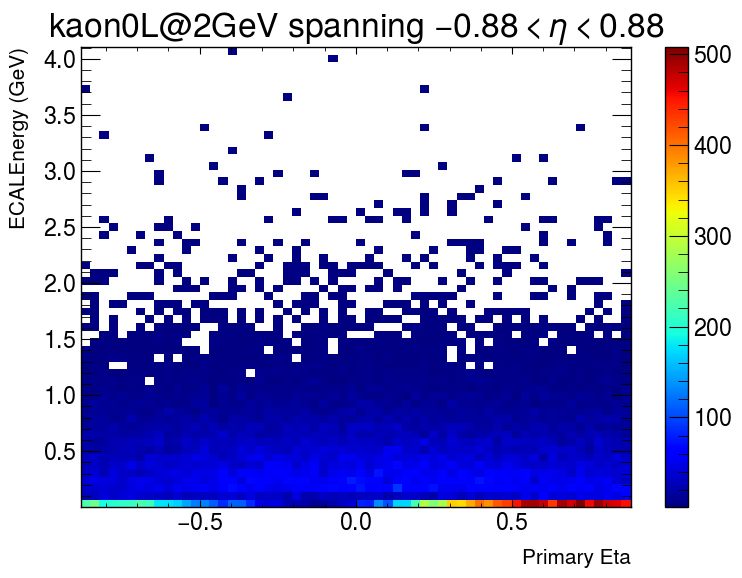

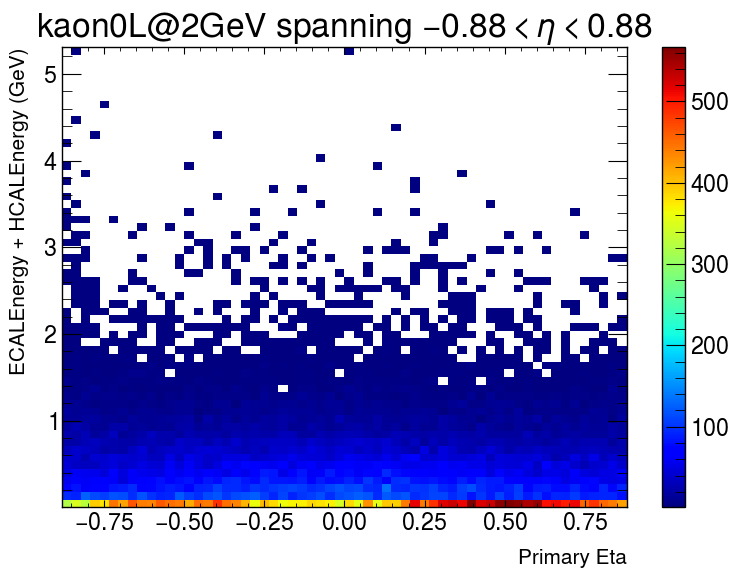

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/5GeV/3to50deg/kaon0L_5GeV_3to50deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/5GeV/3to50deg/kaon0L_5GeV_3to50deg.0020.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


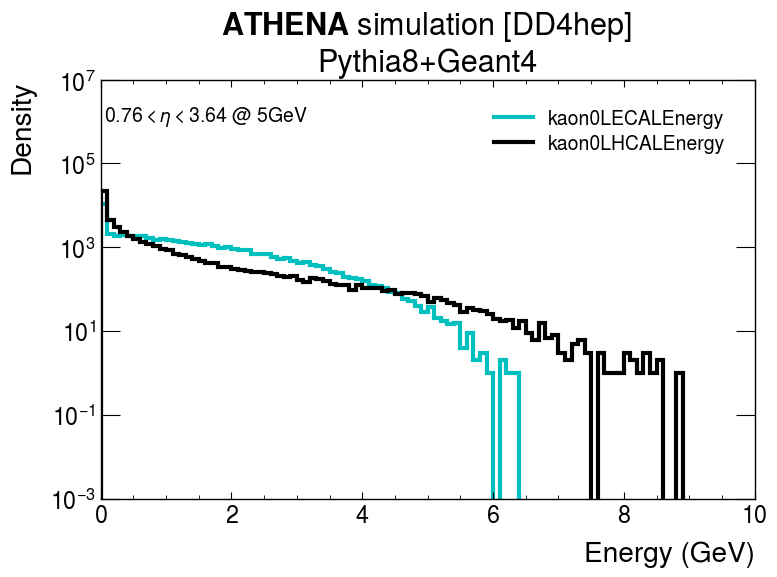

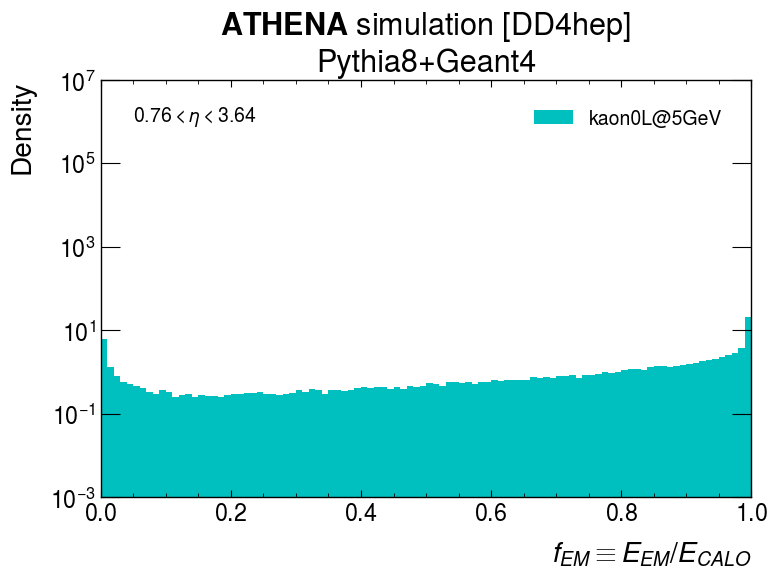

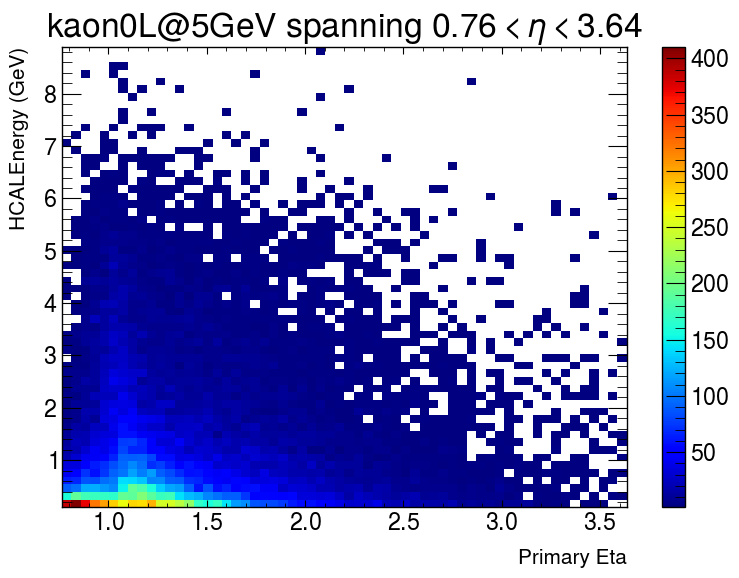

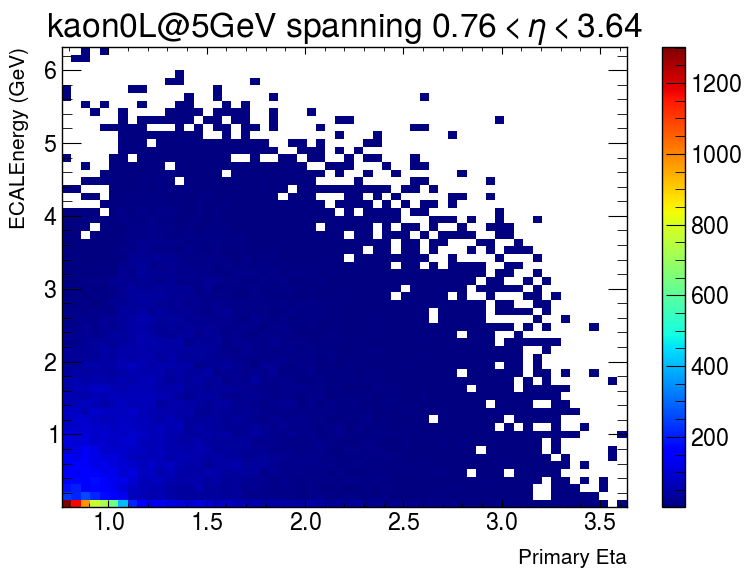

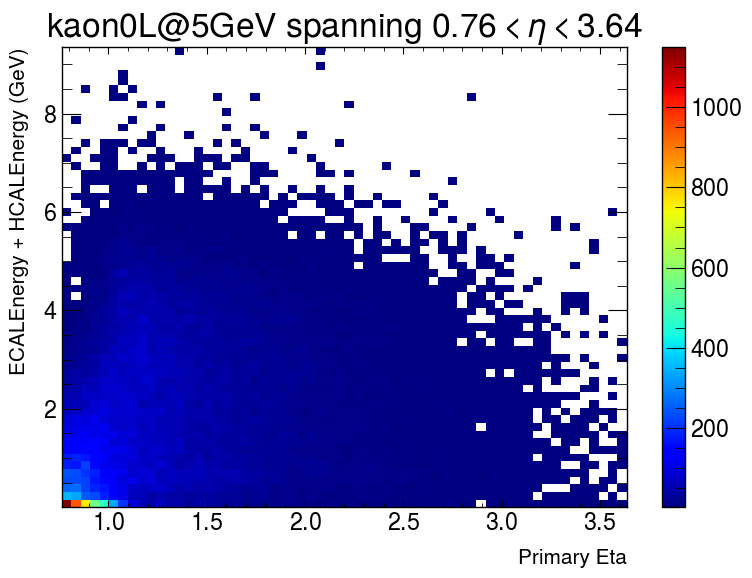

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/5GeV/45to135deg/kaon0L_5GeV_45to135deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/5GeV/45to135deg/kaon0L_5GeV_45to135deg.0020.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


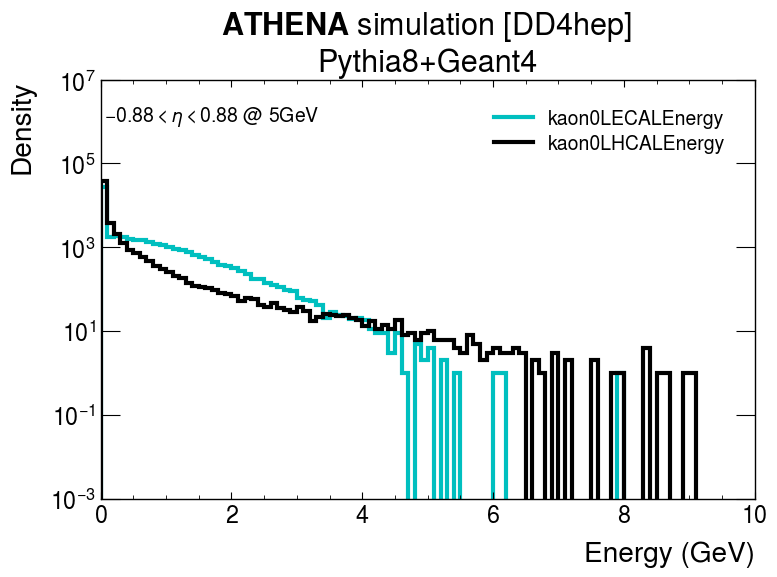

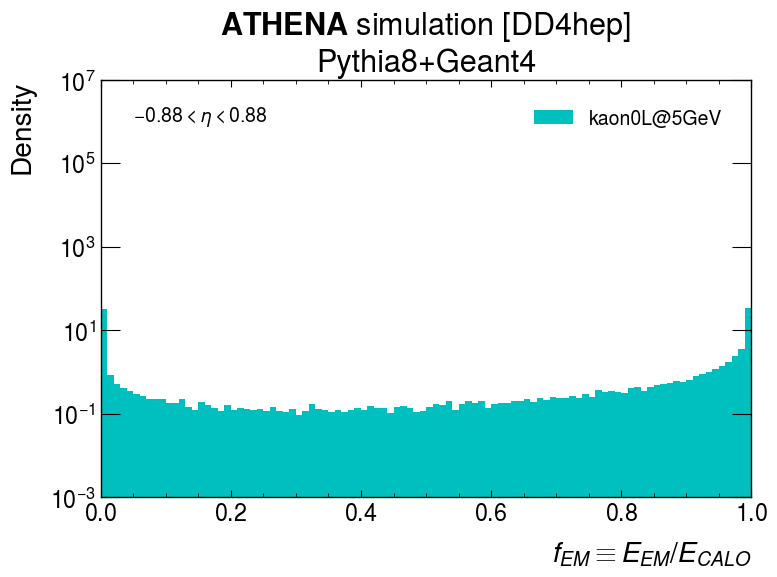

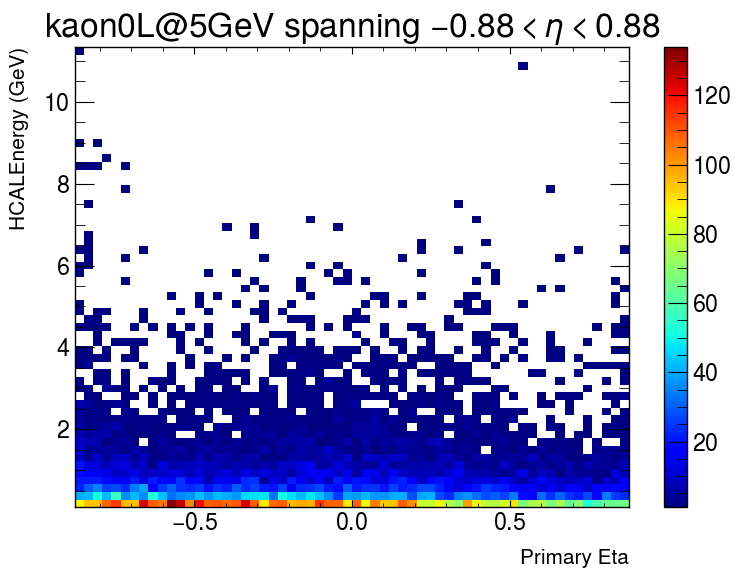

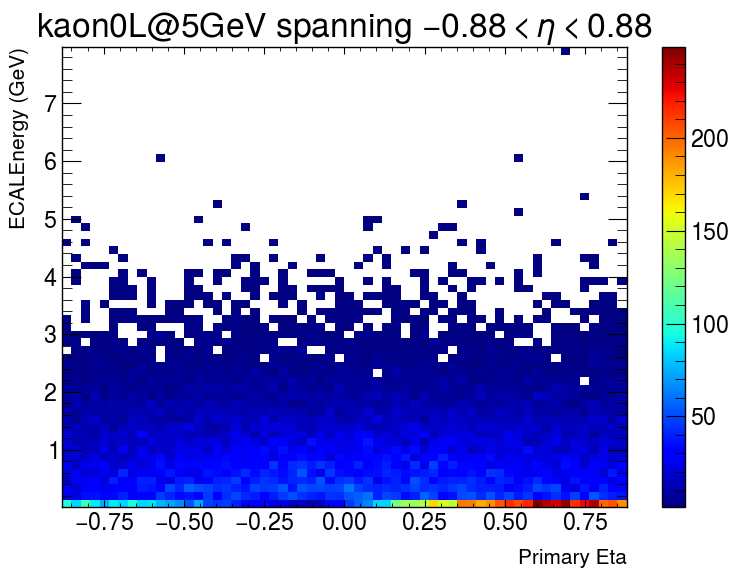

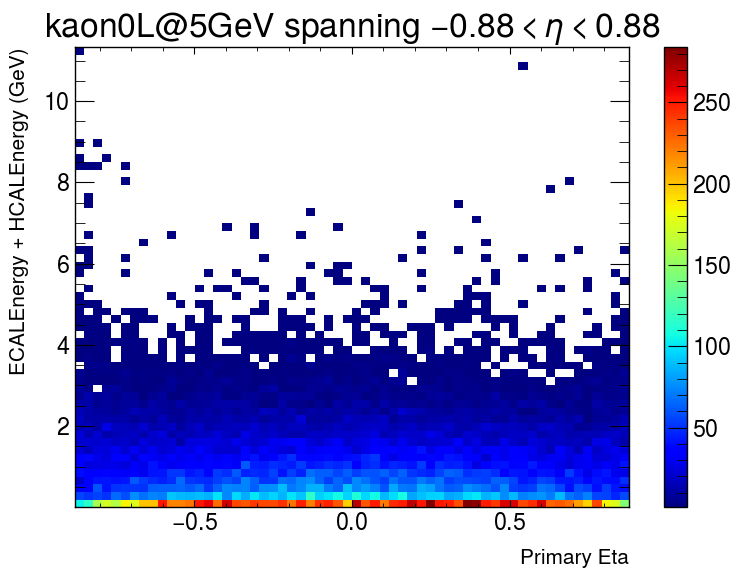

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/10GeV/3to50deg/kaon0L_10GeV_3to50deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/10GeV/3to50deg/kaon0L_10GeV_3to50deg.0040.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


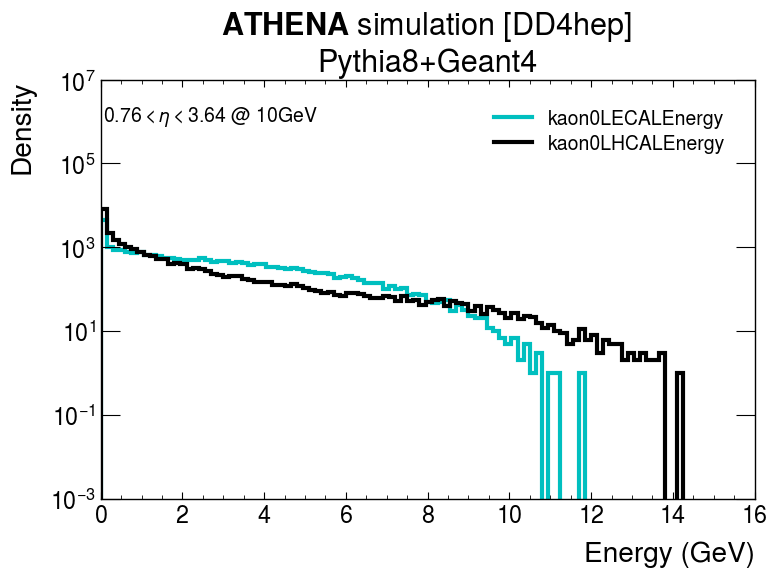

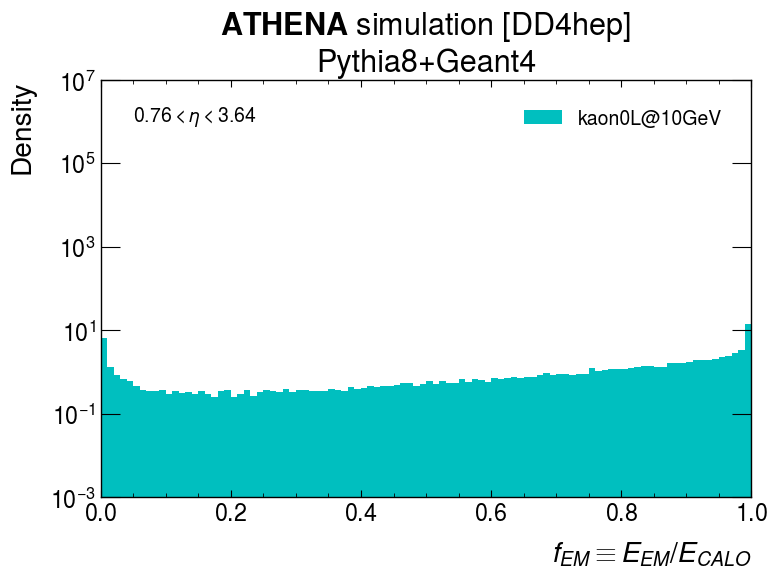

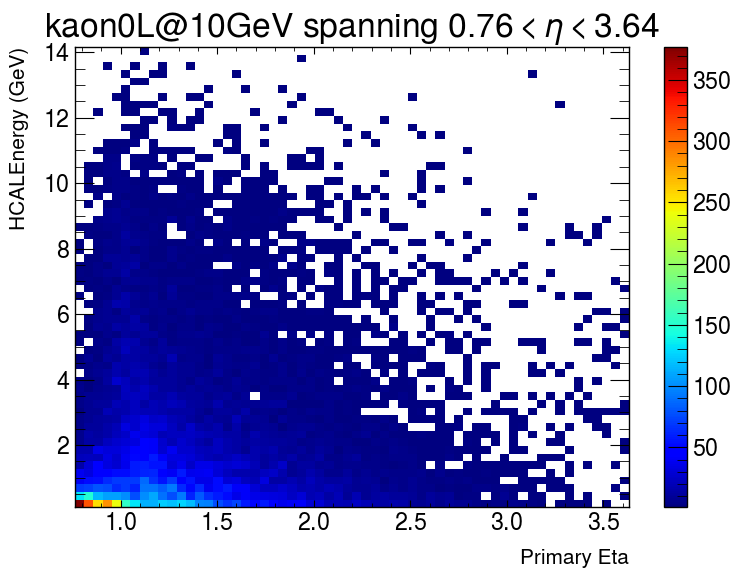

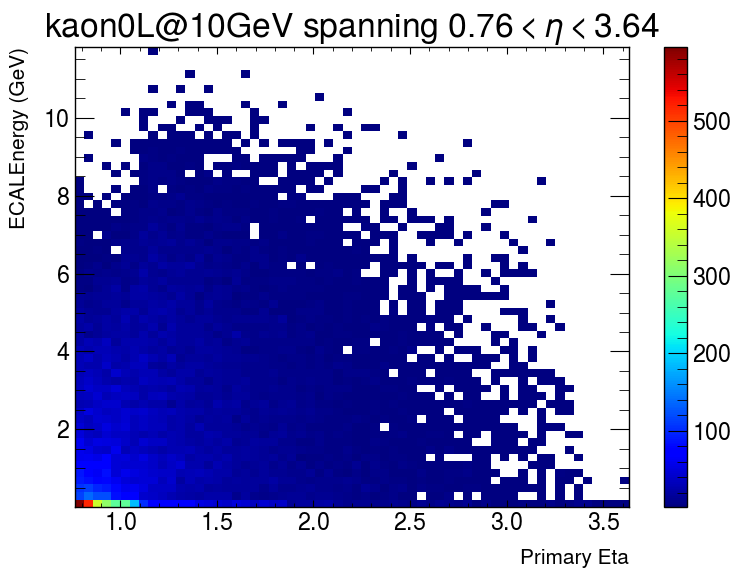

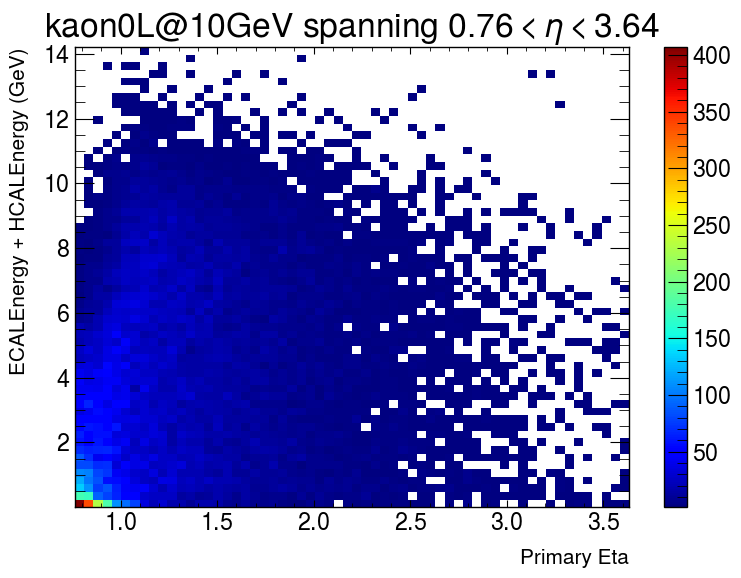

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/10GeV/45to135deg/kaon0L_10GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/10GeV/45to135deg/kaon0L_10GeV_45to135deg.0040.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


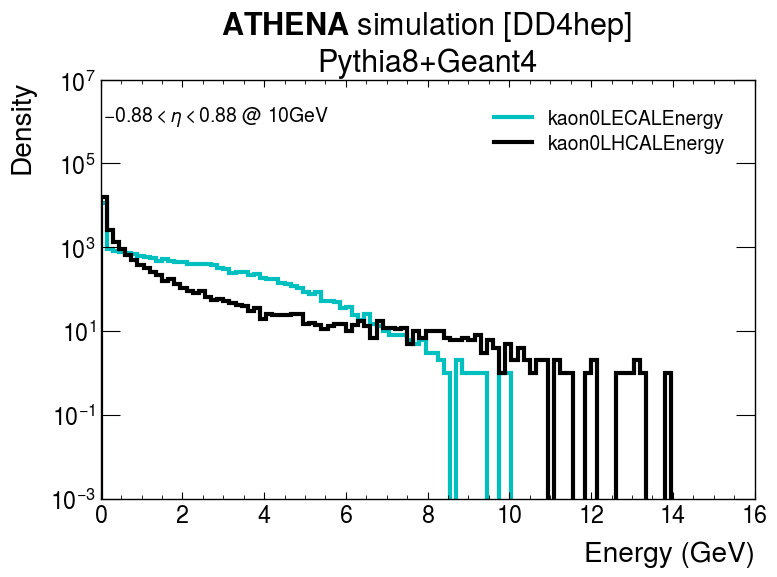

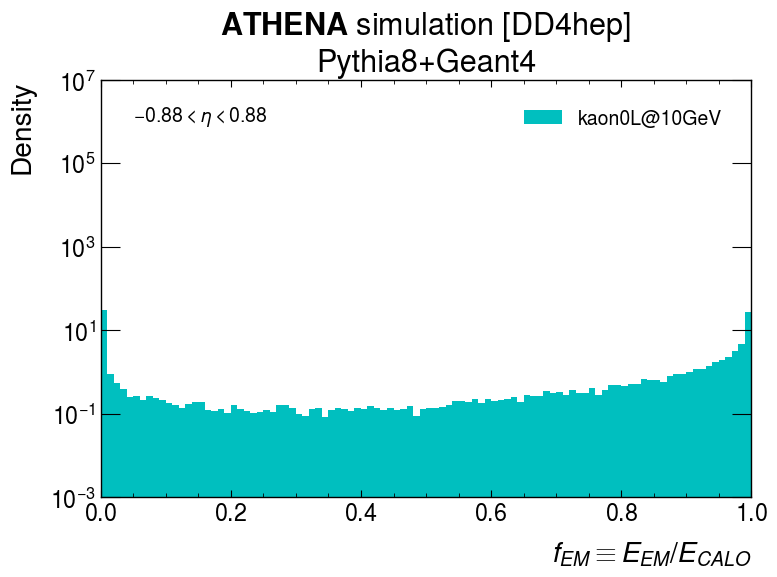

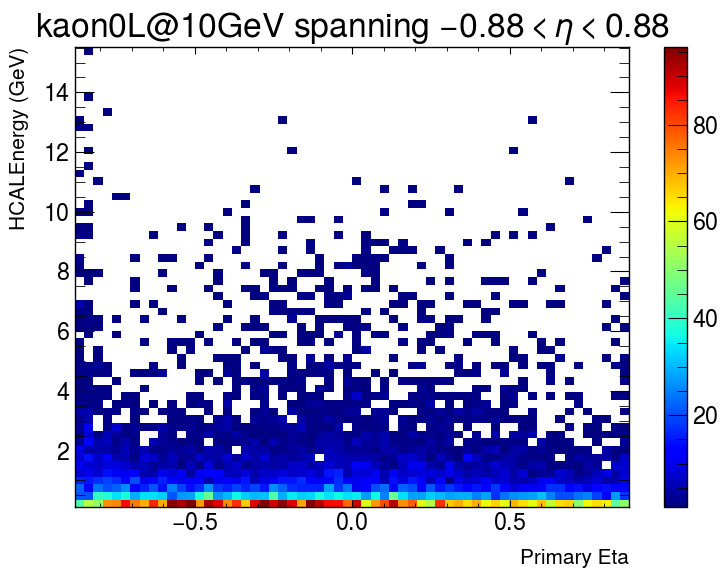

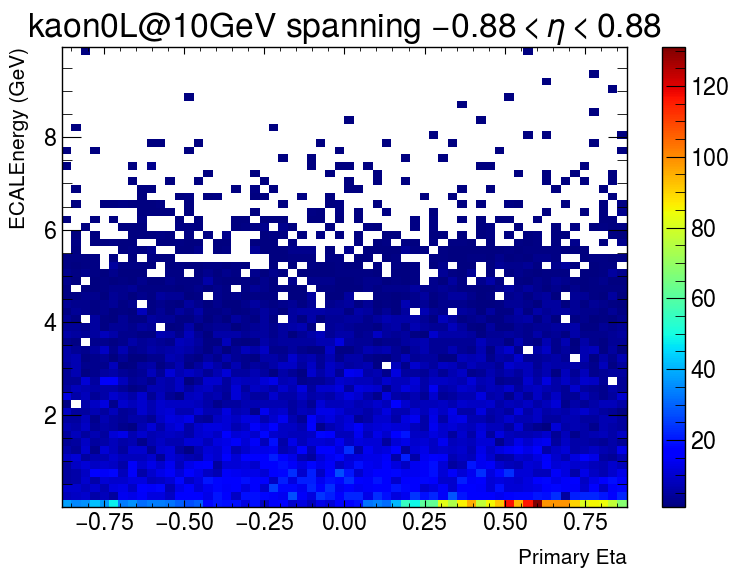

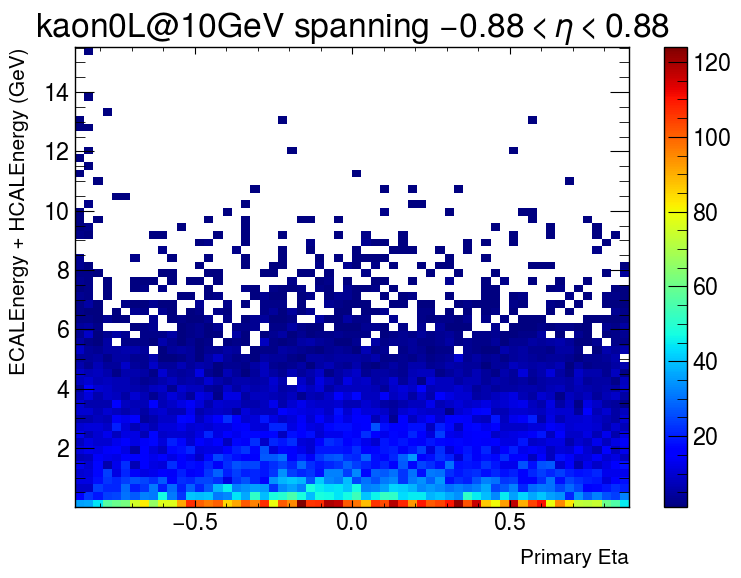

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/20GeV/3to50deg/kaon0L_20GeV_3to50deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/20GeV/3to50deg/kaon0L_20GeV_3to50deg.0040.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


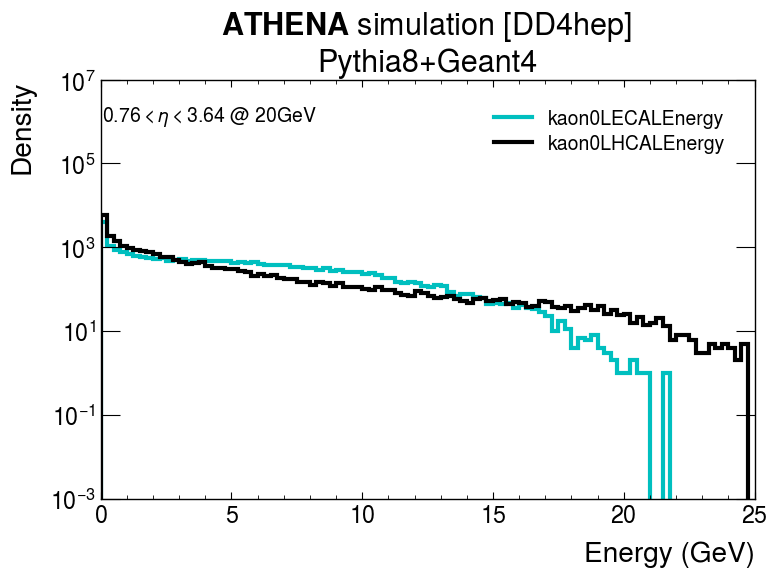

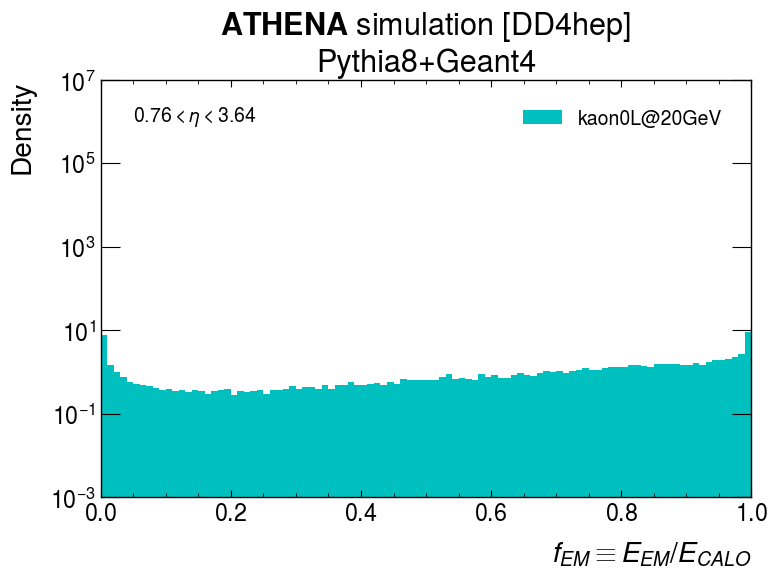

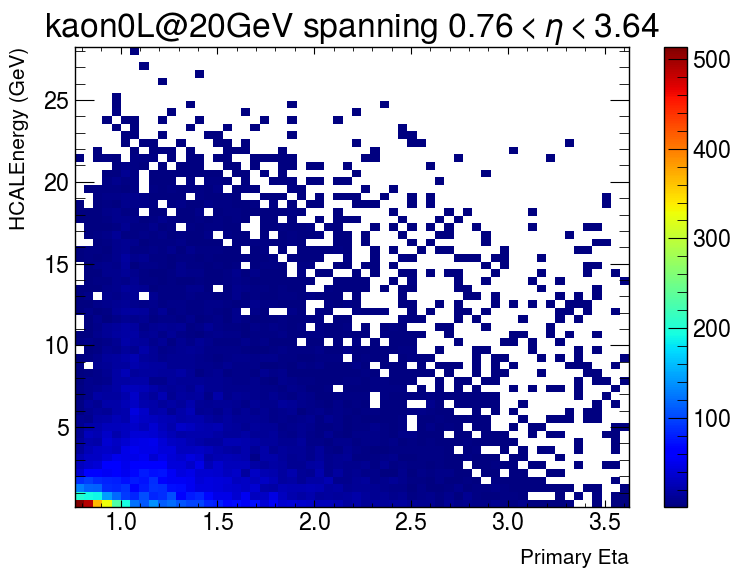

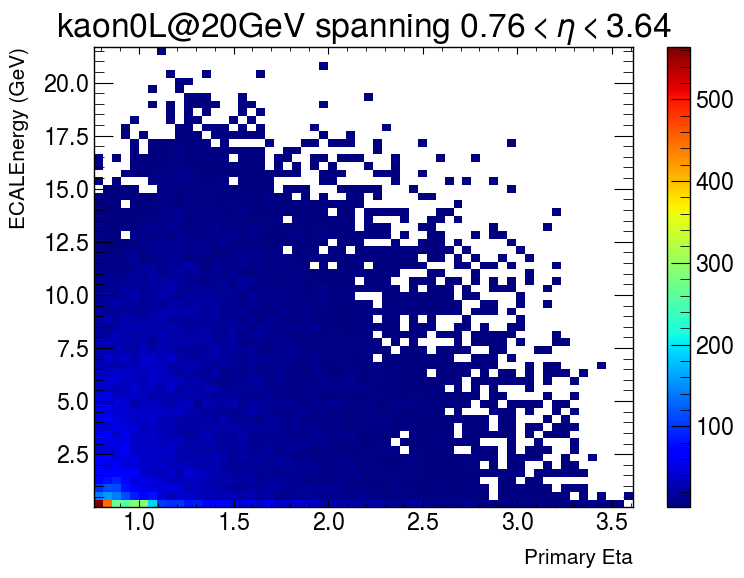

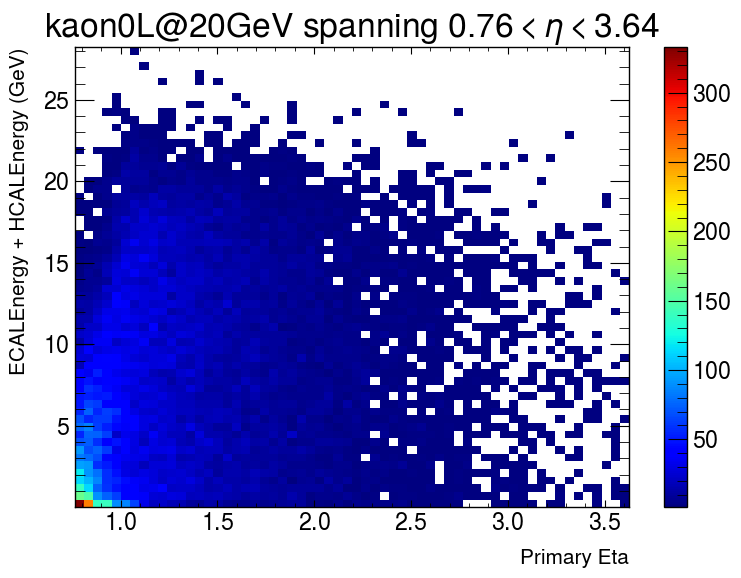

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/kaon0L/20GeV/45to135deg/kaon0L_20GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/kaon0L/20GeV/45to135deg/kaon0L_20GeV_45to135deg.0040.root
Creating histogram named kaon0LECALEnergyFraction ... 
Creating histogram named kaon0LECALEnergy ... 
Creating histogram named kaon0LHCALEnergy ... 


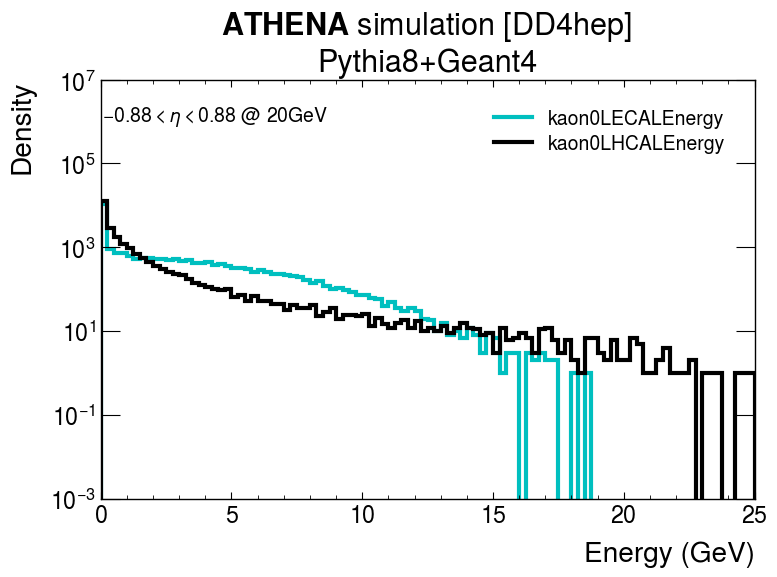

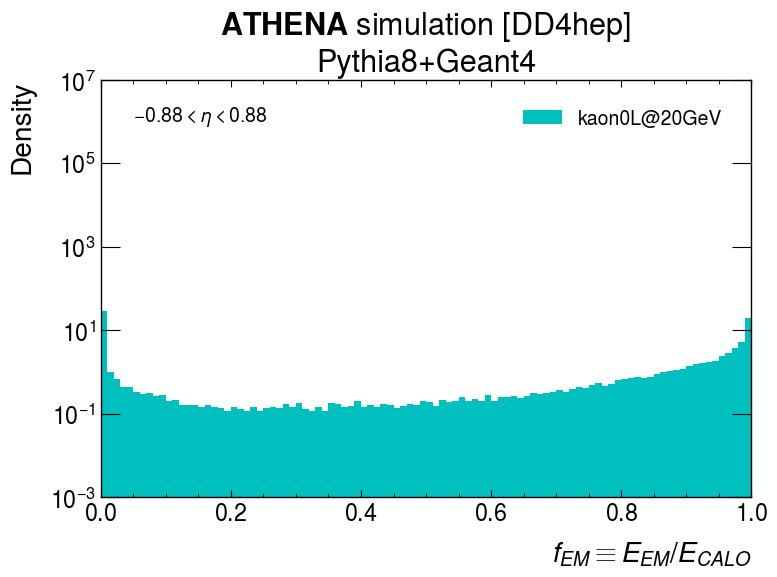

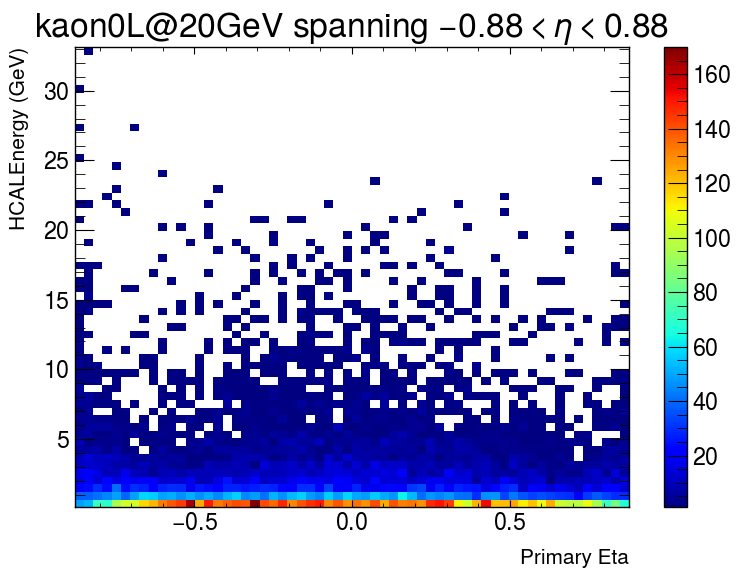

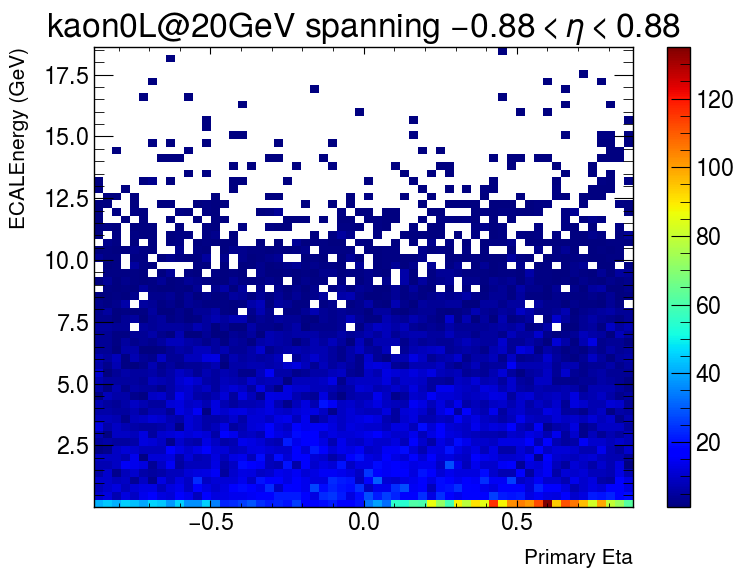

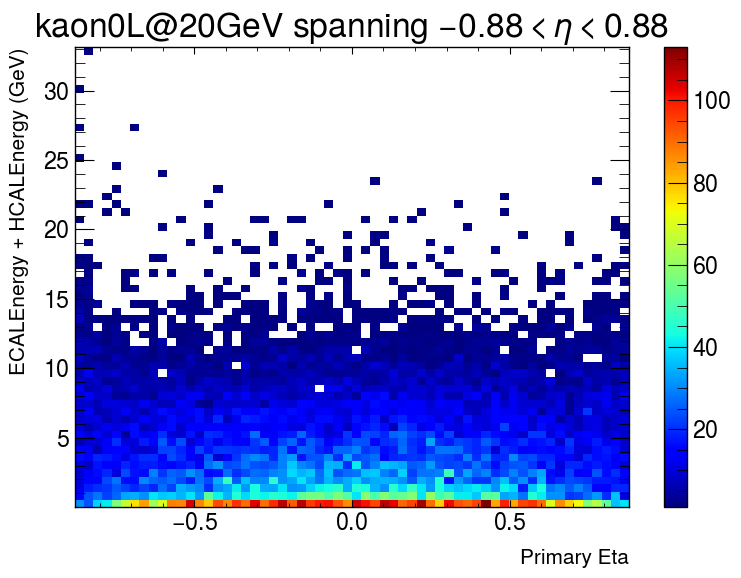

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/1GeV/45to135deg/neutron_1GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/neutron/1GeV/45to135deg/neutron_1GeV_45to135deg.0010.root
Creating histogram named neutronECALEnergyFraction ... 
Creating histogram named neutronECALEnergy ... 
Creating histogram named neutronHCALEnergy ... 


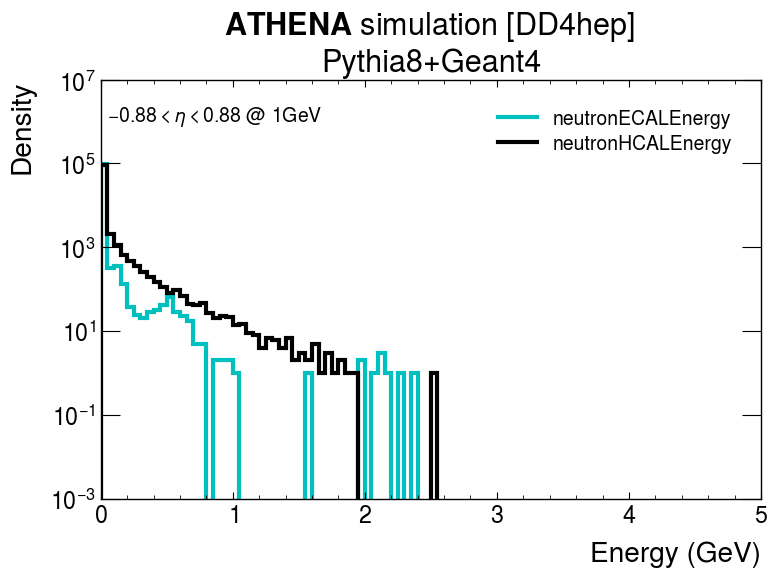

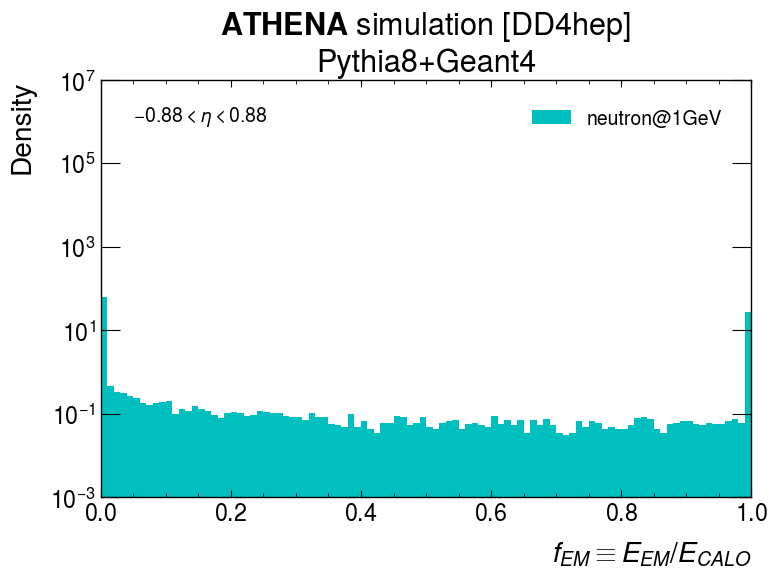

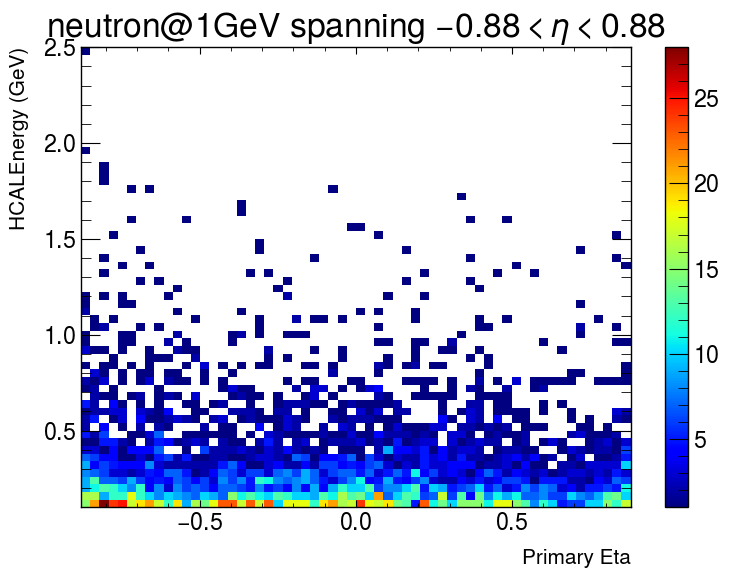

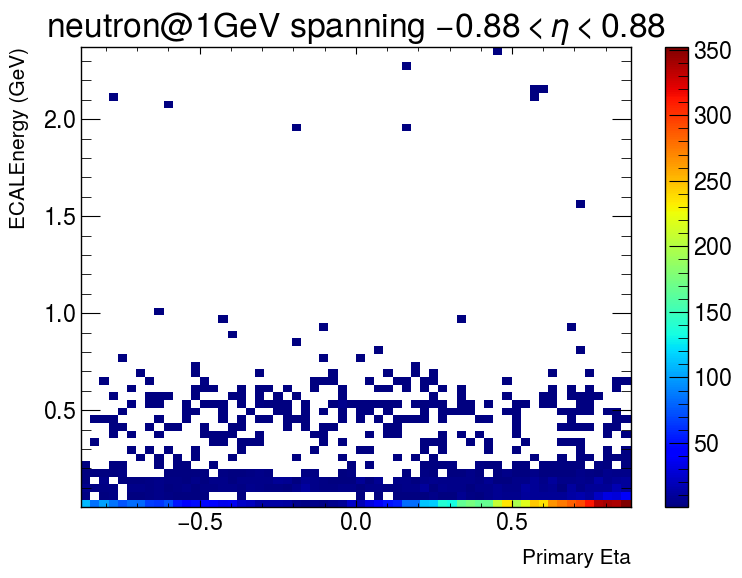

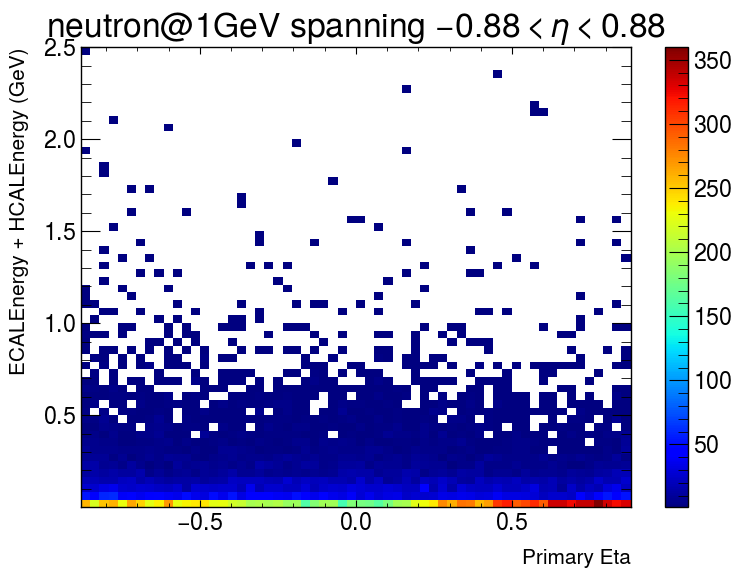

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/2GeV/45to135deg/neutron_2GeV_45to135deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/neutron/2GeV/45to135deg/neutron_2GeV_45to135deg.0020.root
Creating histogram named neutronECALEnergyFraction ... 
Creating histogram named neutronECALEnergy ... 
Creating histogram named neutronHCALEnergy ... 


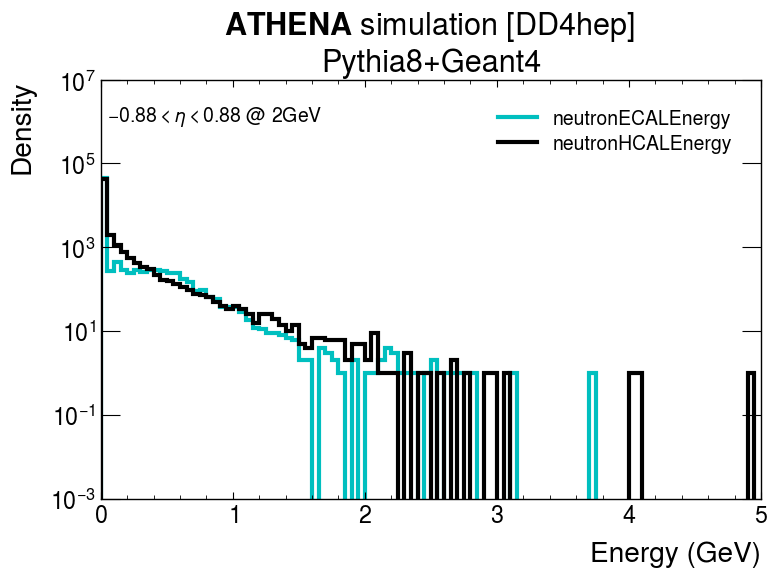

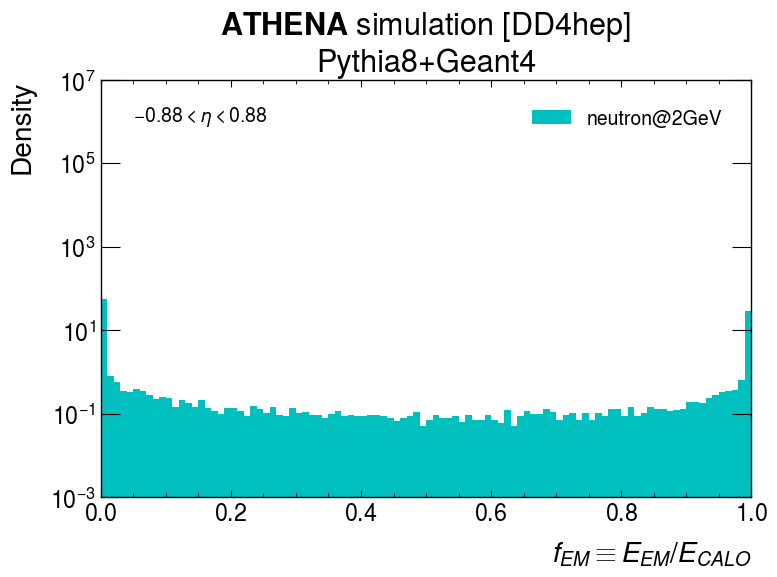

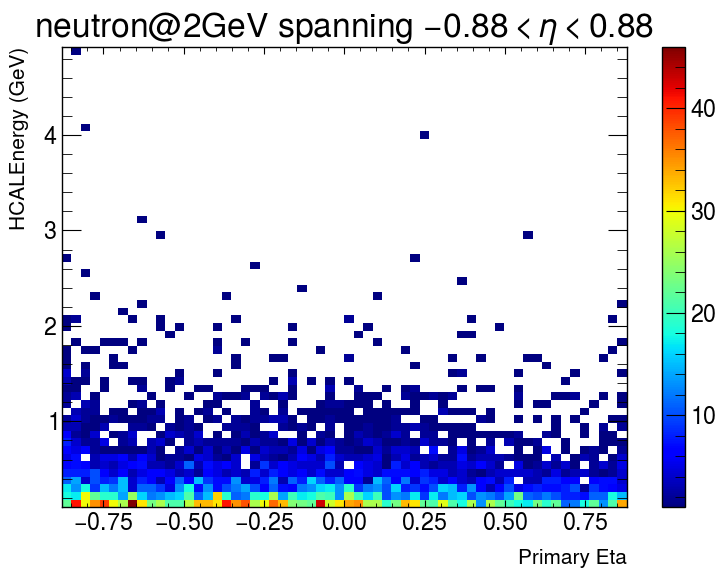

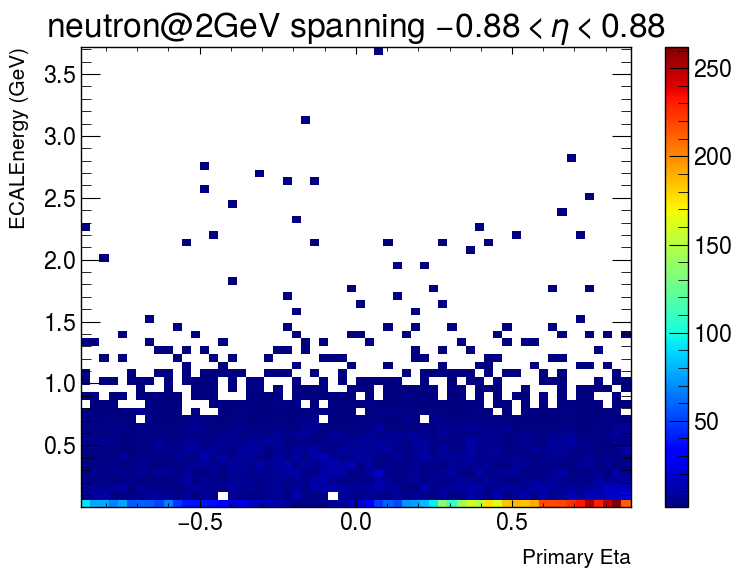

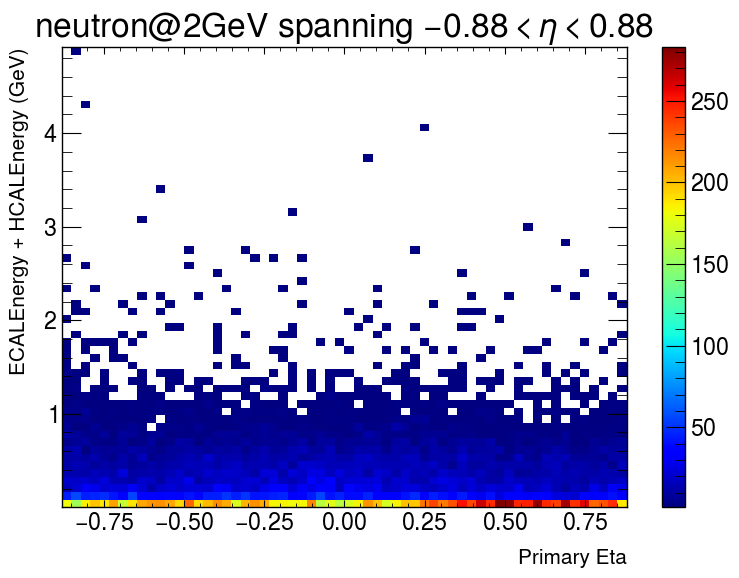

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/5GeV/45to135deg/neutron_5GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/neutron/5GeV/45to135deg/neutron_5GeV_45to135deg.0040.root
Creating histogram named neutronECALEnergyFraction ... 
Creating histogram named neutronECALEnergy ... 
Creating histogram named neutronHCALEnergy ... 


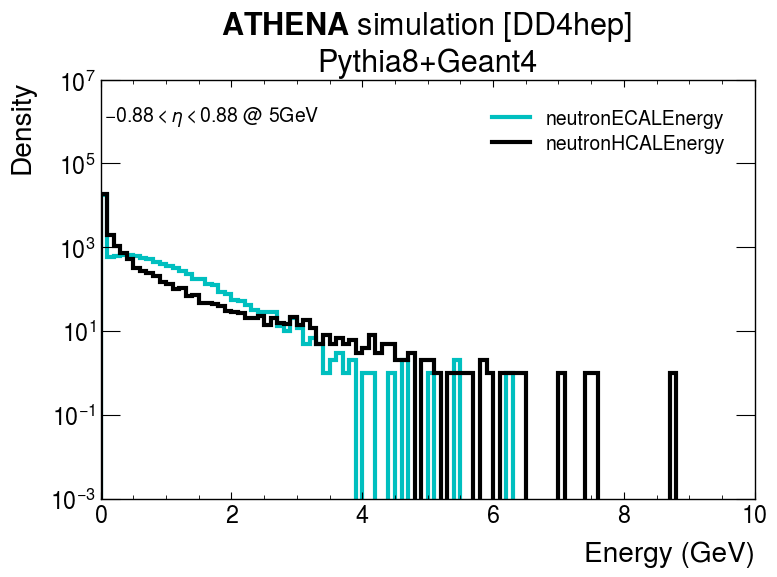

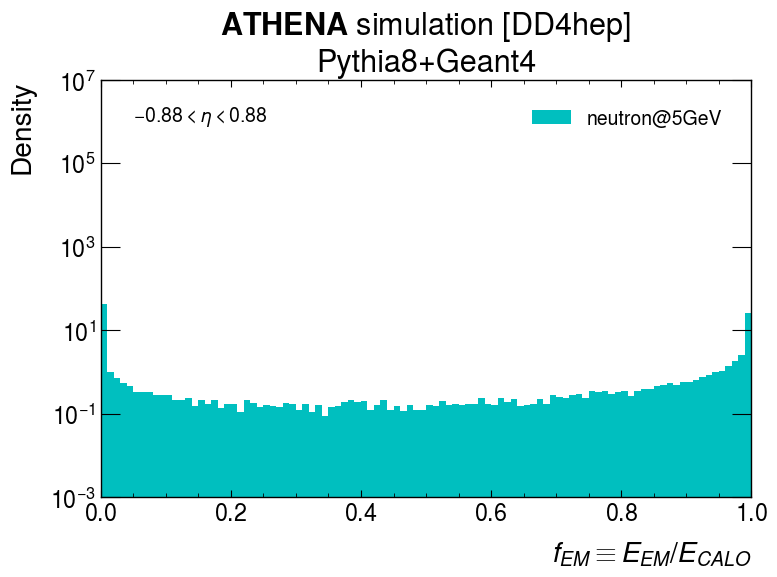

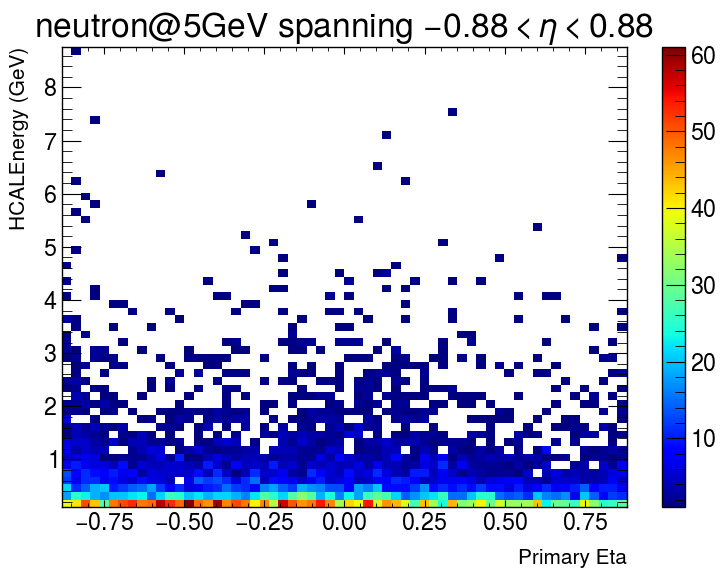

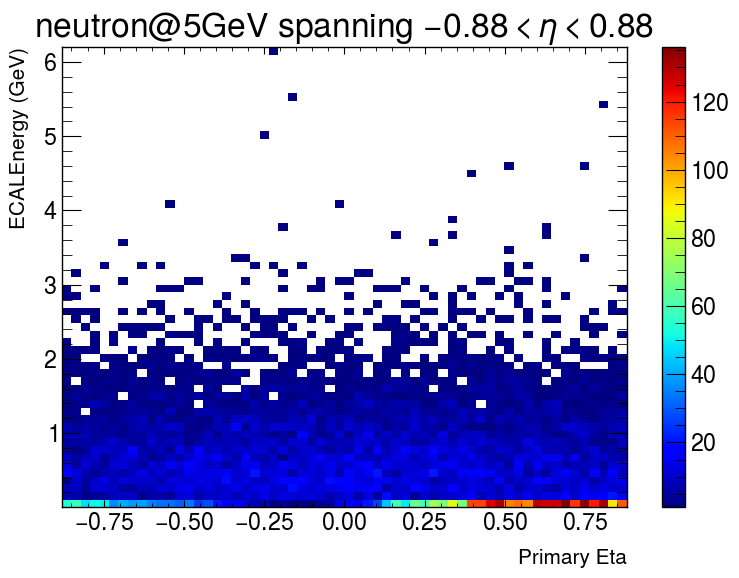

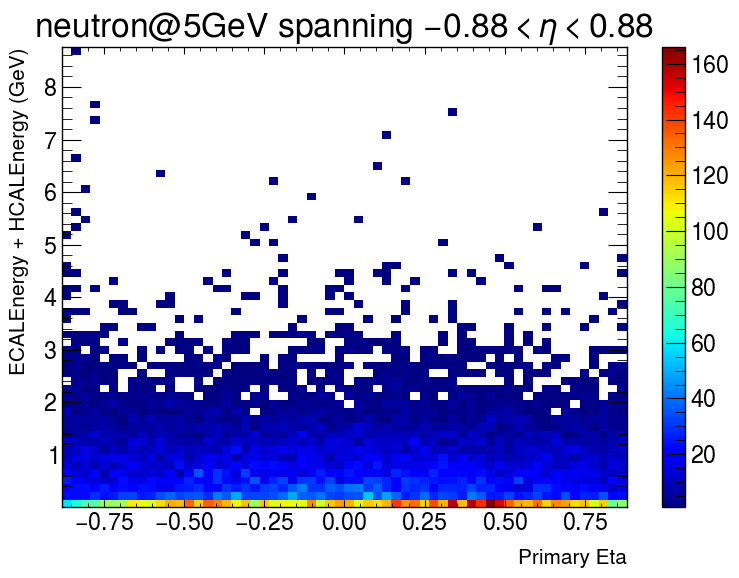

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/10GeV/45to135deg/neutron_10GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/neutron/10GeV/45to135deg/neutron_10GeV_45to135deg.0040.root
Creating histogram named neutronECALEnergyFraction ... 
Creating histogram named neutronECALEnergy ... 
Creating histogram named neutronHCALEnergy ... 


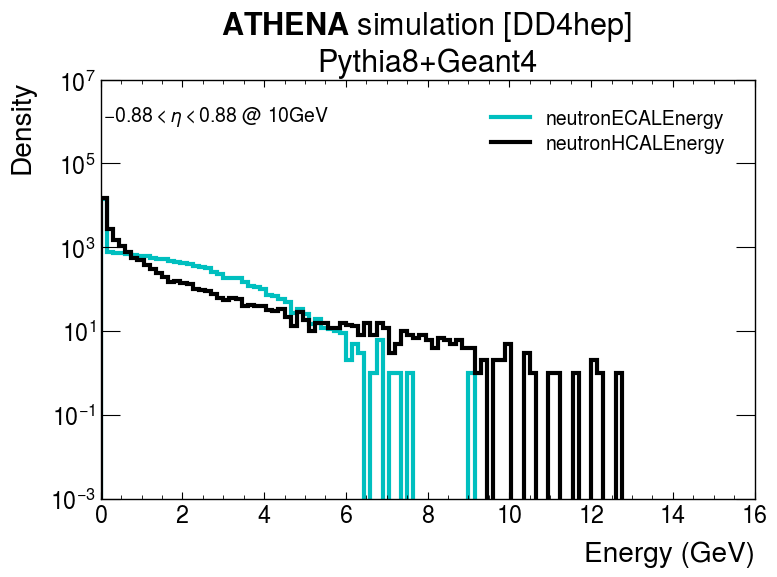

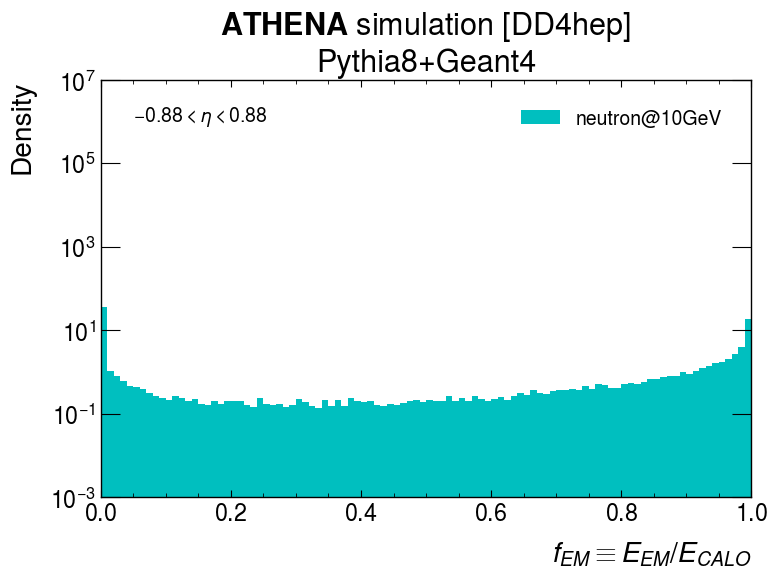

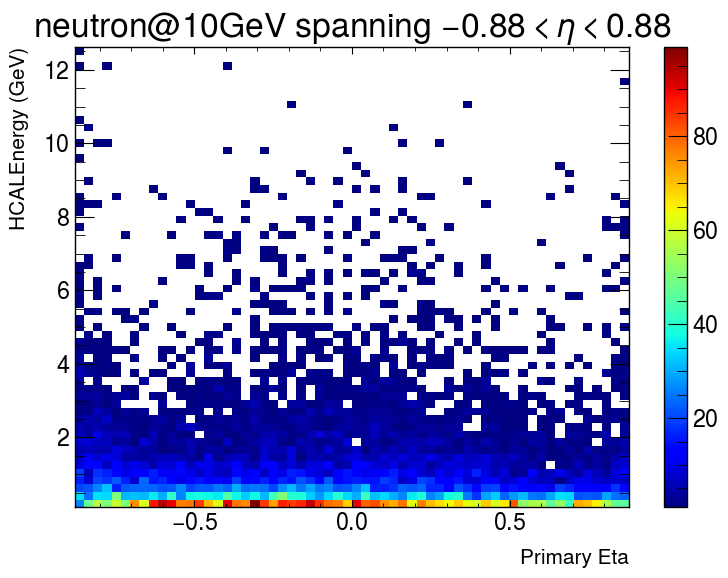

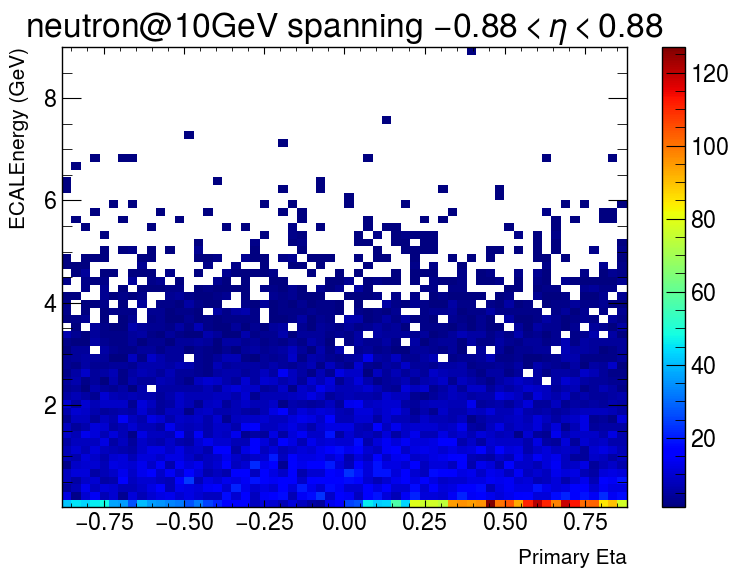

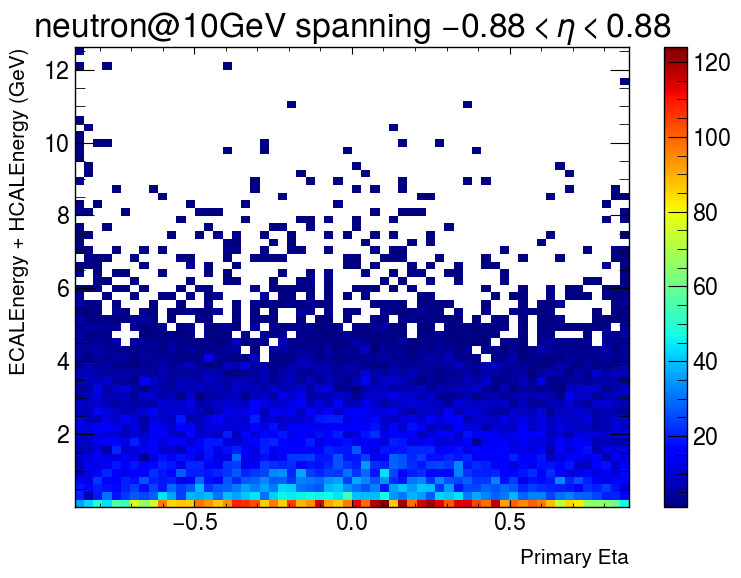

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/neutron/20GeV/45to135deg/neutron_20GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/neutron/20GeV/45to135deg/neutron_20GeV_45to135deg.0040.root
Creating histogram named neutronECALEnergyFraction ... 
Creating histogram named neutronECALEnergy ... 
Creating histogram named neutronHCALEnergy ... 


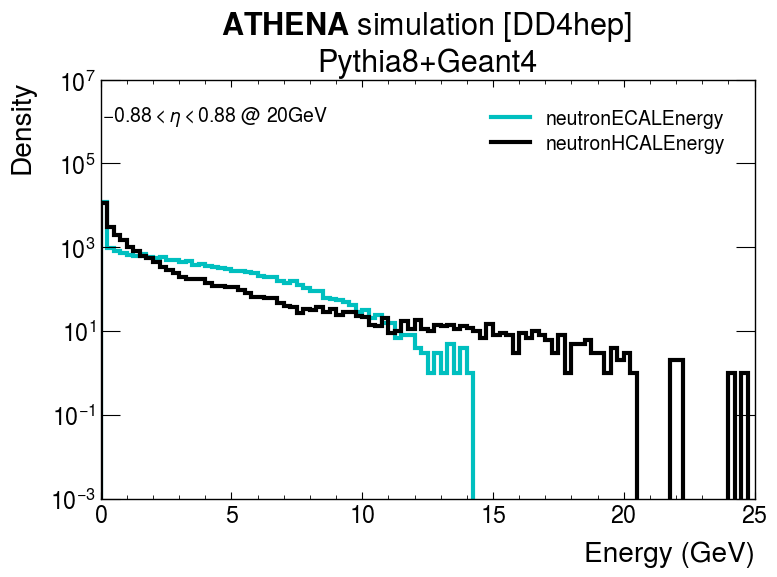

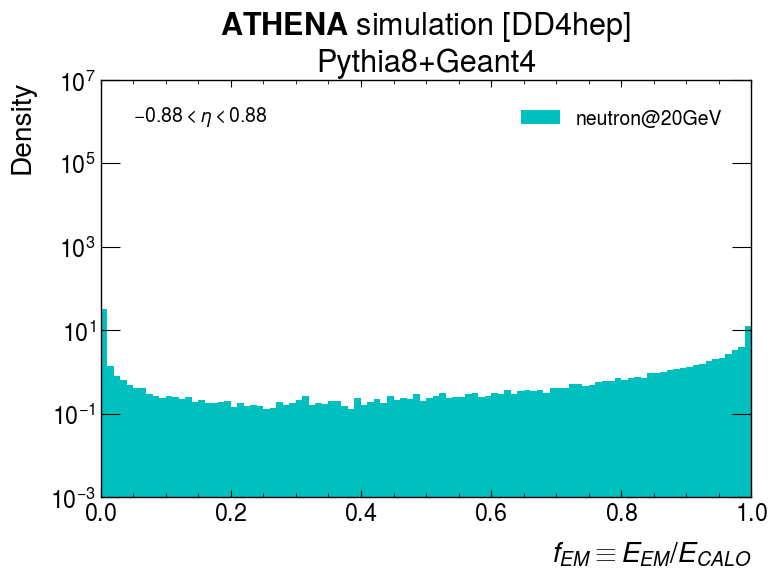

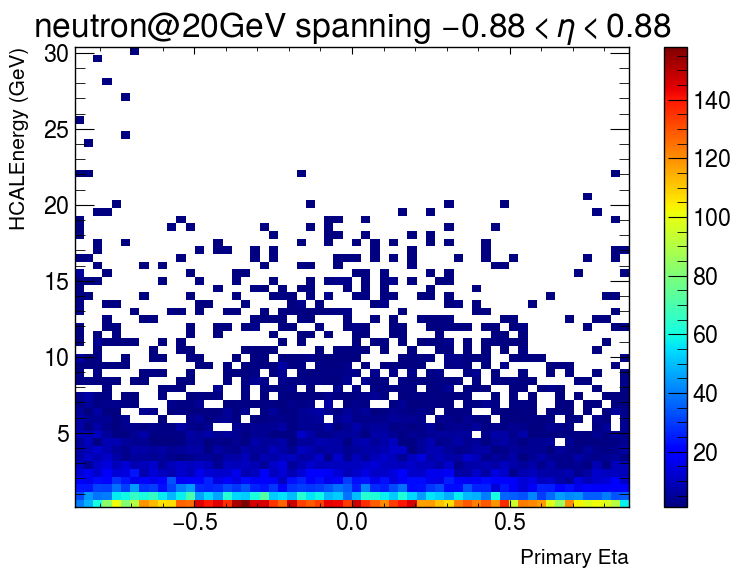

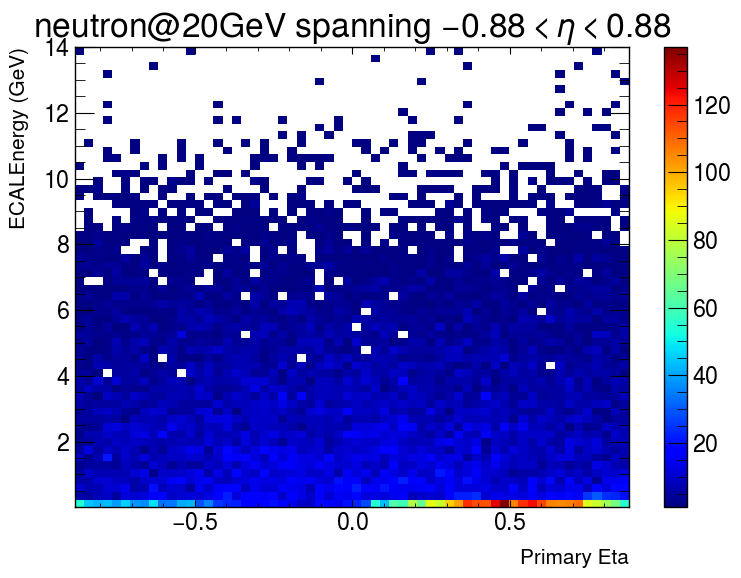

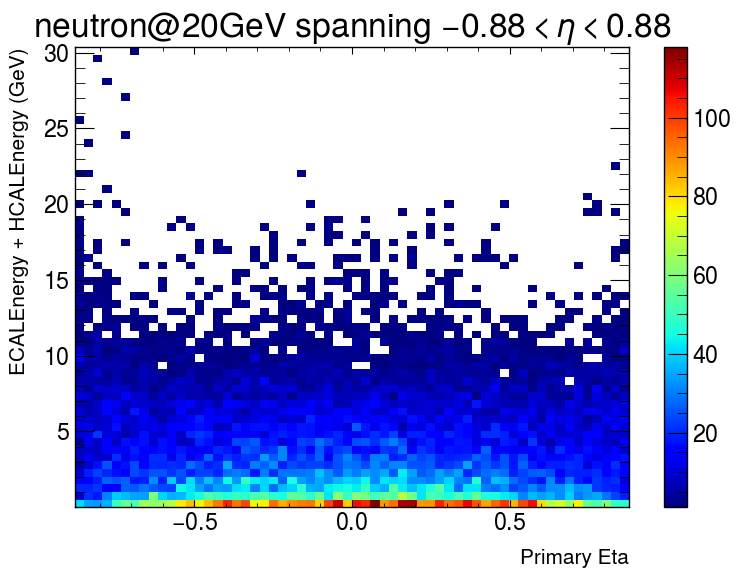

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/1GeV/3to50deg/pi+_1GeV_3to50deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/1GeV/3to50deg/pi+_1GeV_3to50deg.0010.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


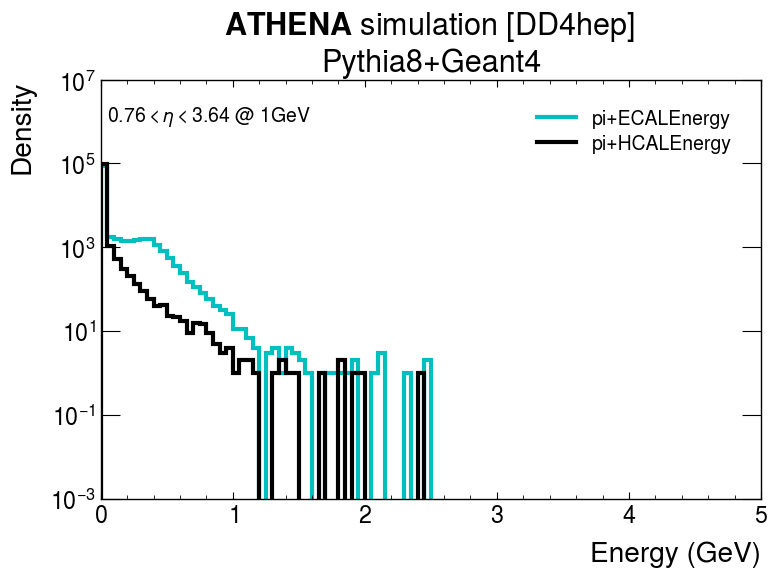

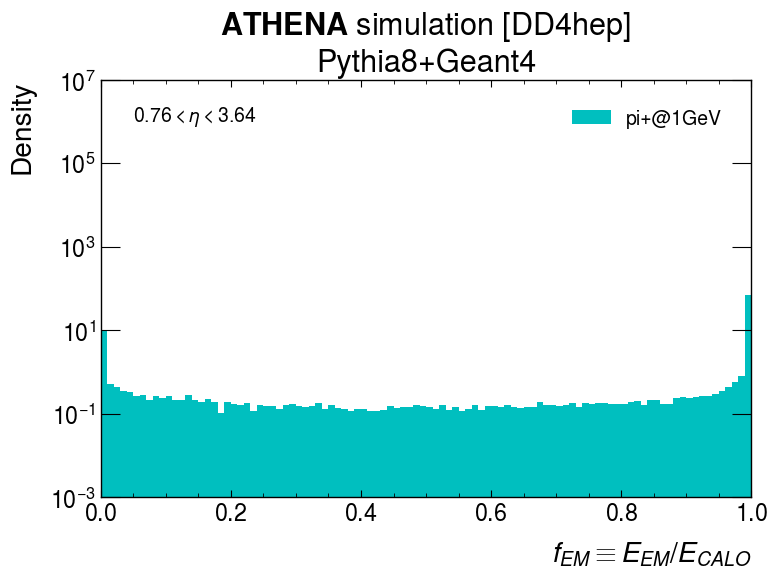

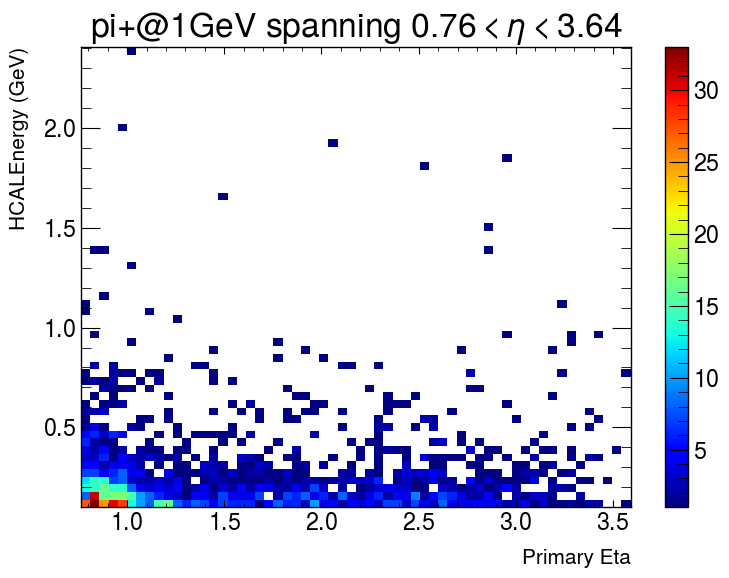

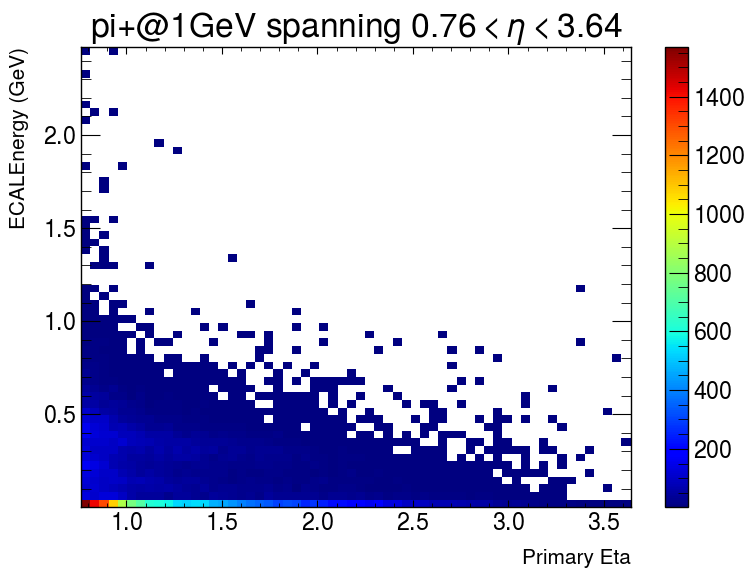

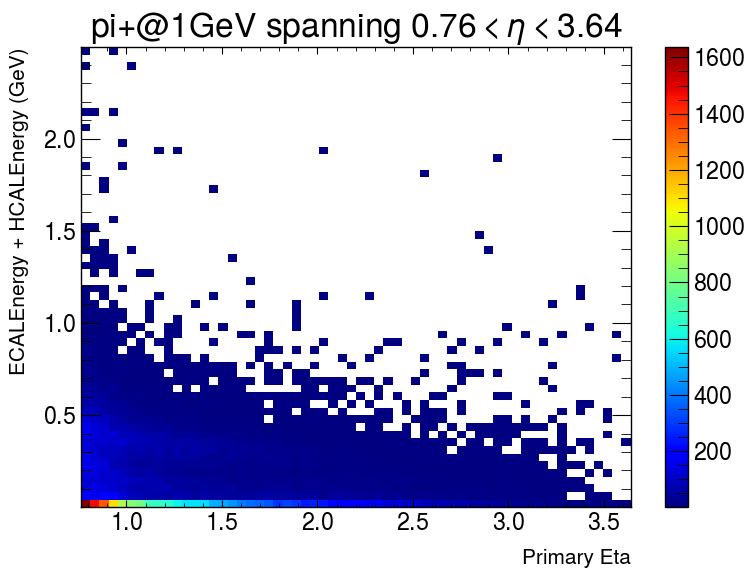

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/1GeV/45to135deg/pi+_1GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/1GeV/45to135deg/pi+_1GeV_45to135deg.0010.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


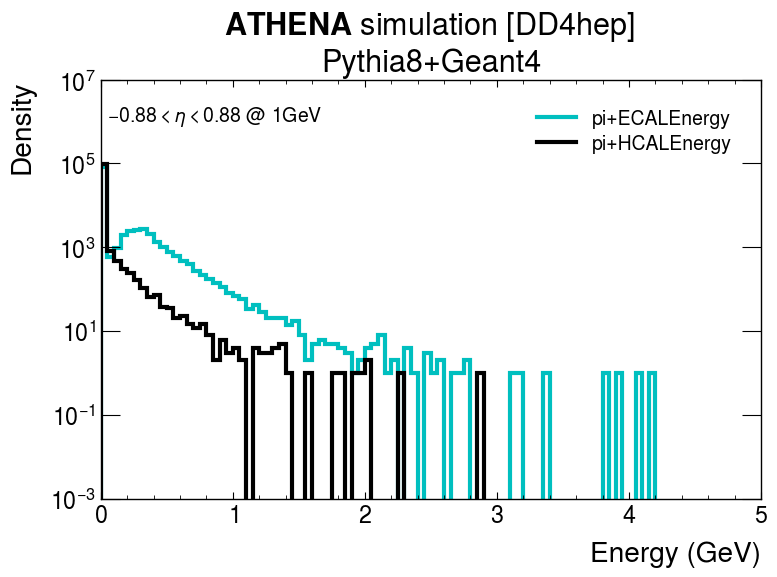

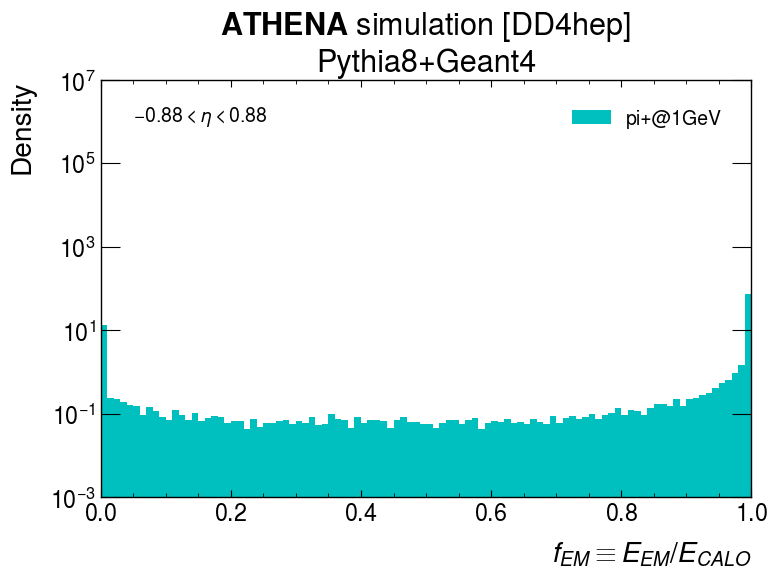

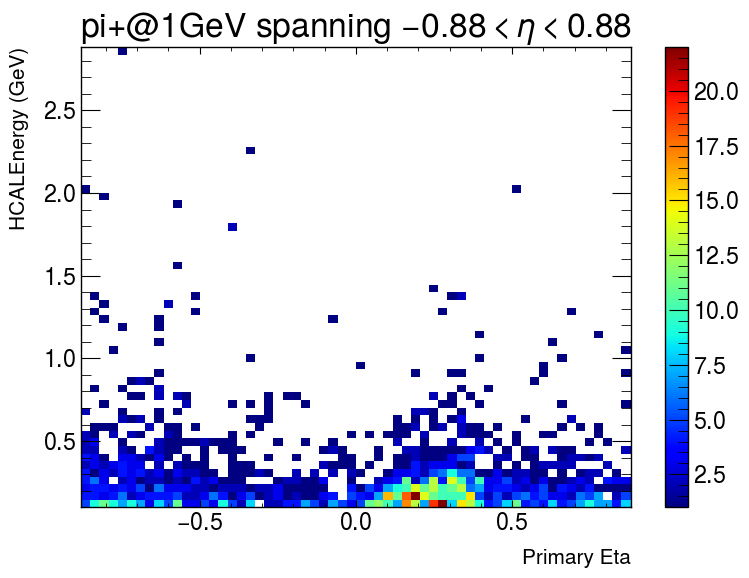

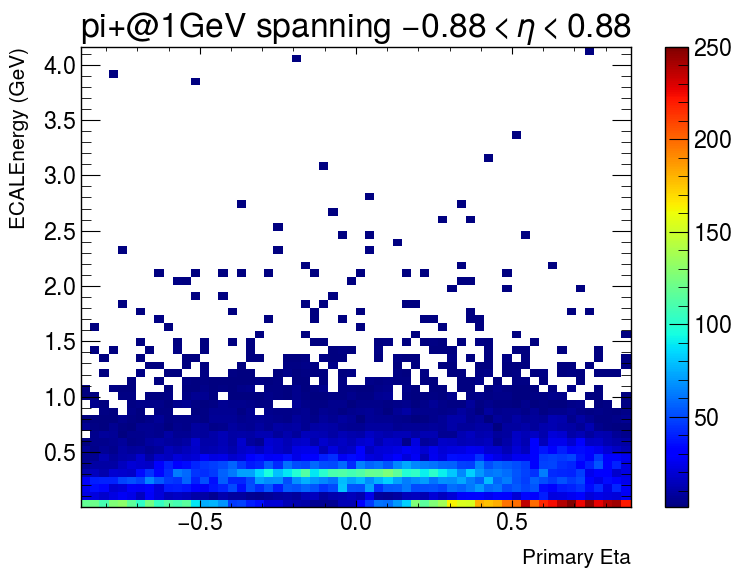

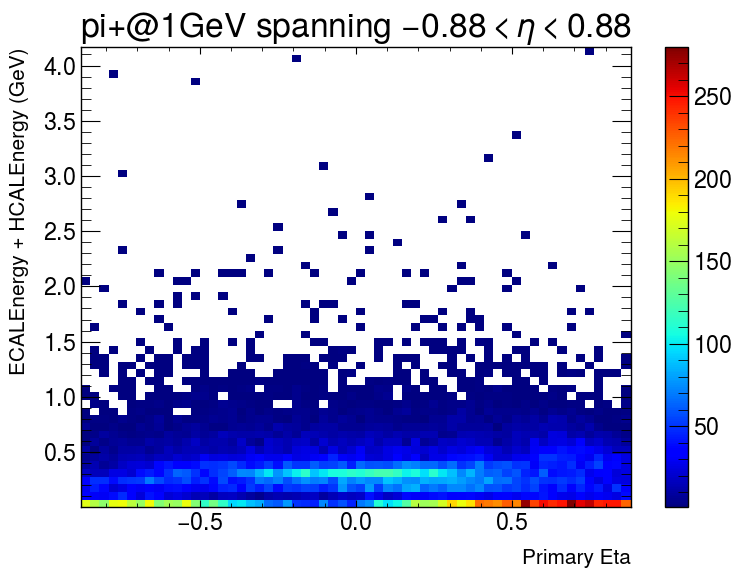

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/2GeV/3to50deg/pi+_2GeV_3to50deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/2GeV/3to50deg/pi+_2GeV_3to50deg.0010.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


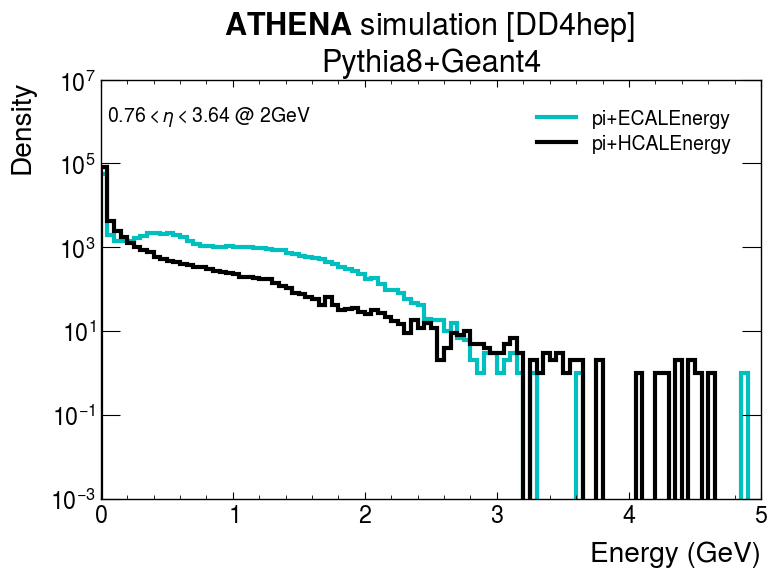

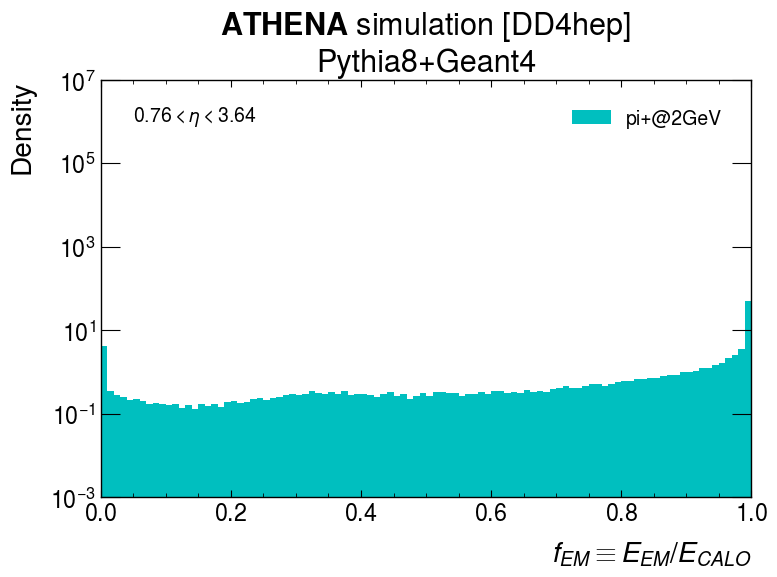

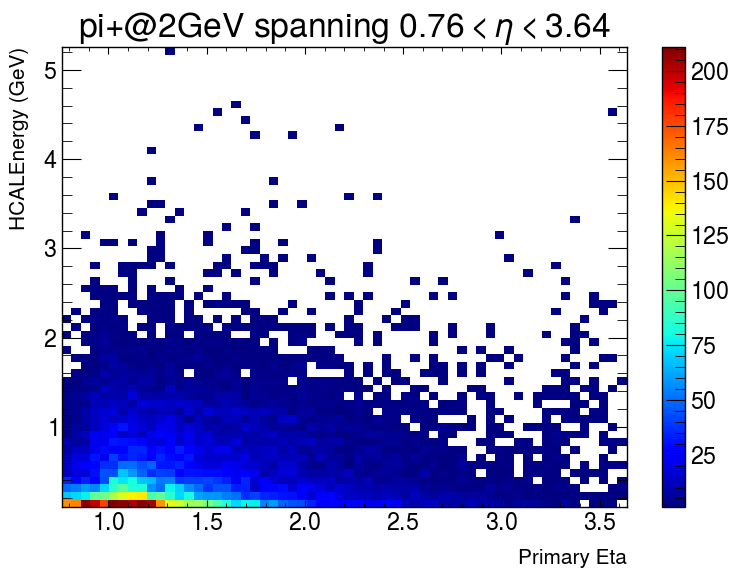

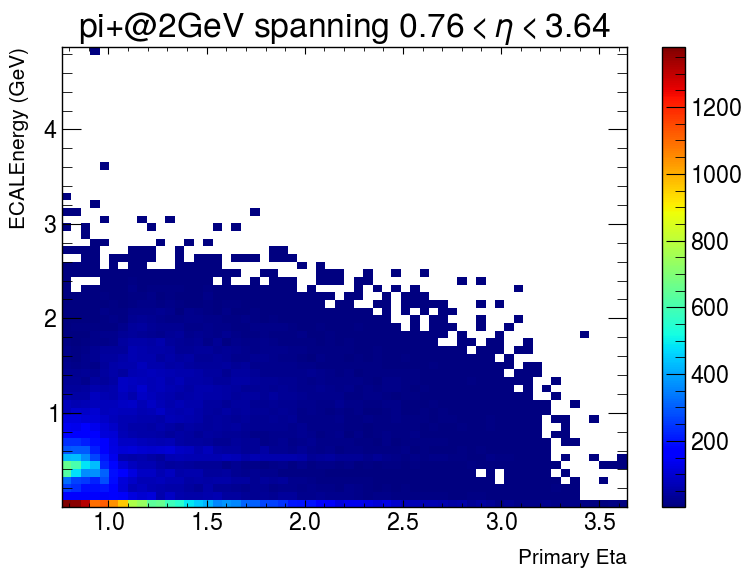

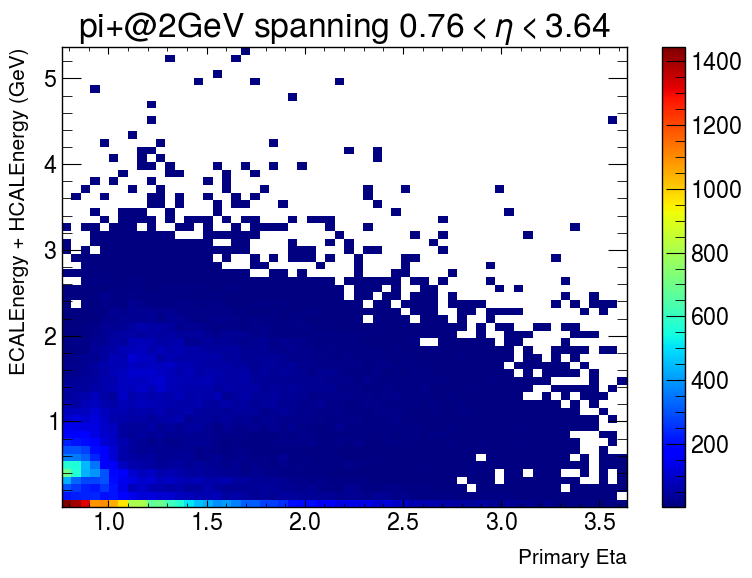

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/2GeV/45to135deg/pi+_2GeV_45to135deg.0010.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/2GeV/45to135deg/pi+_2GeV_45to135deg.0010.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


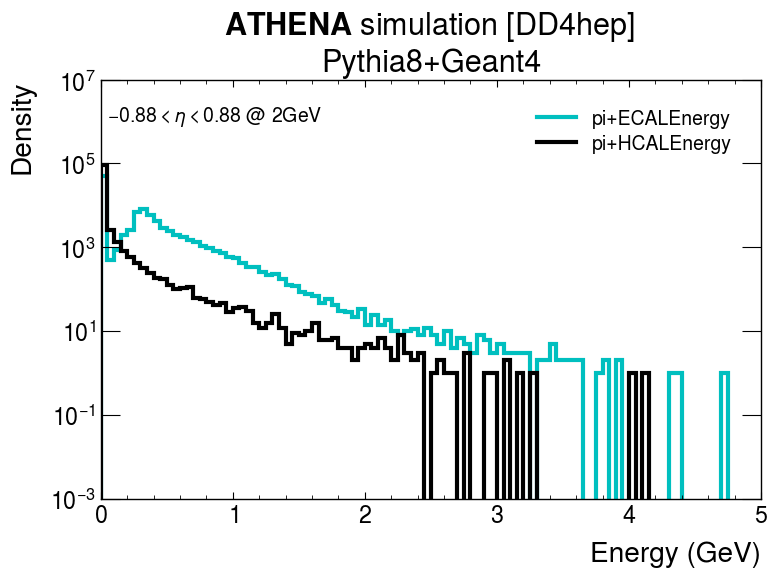

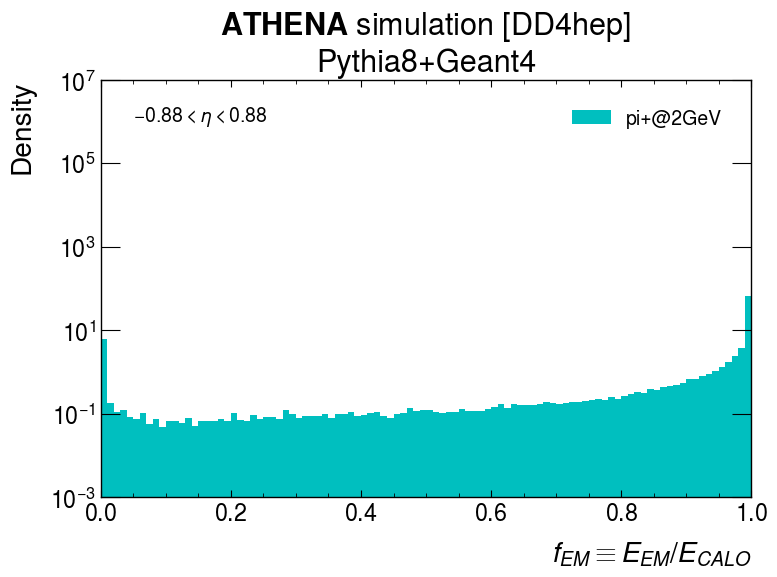

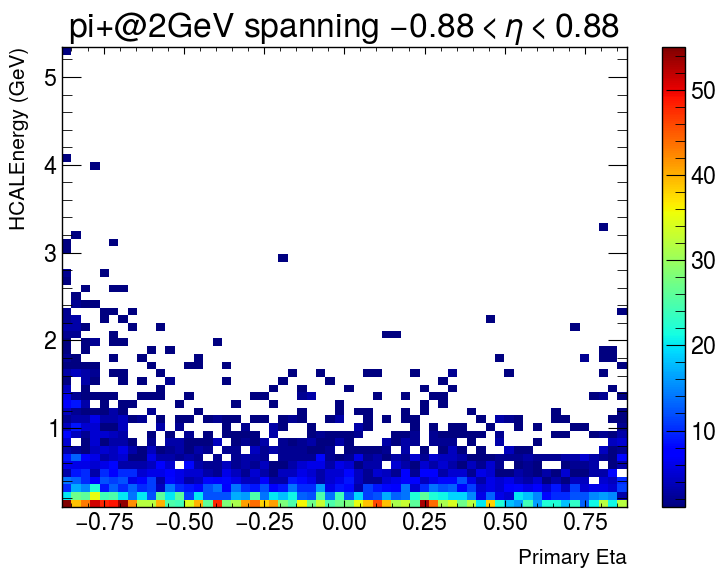

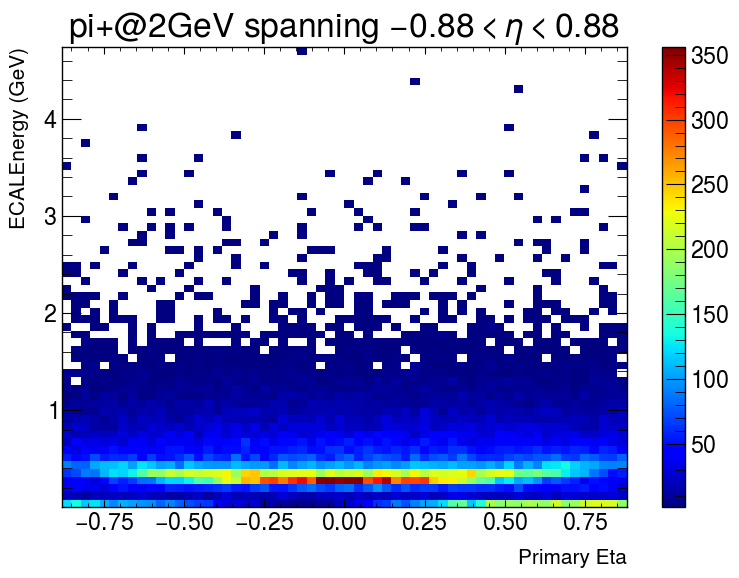

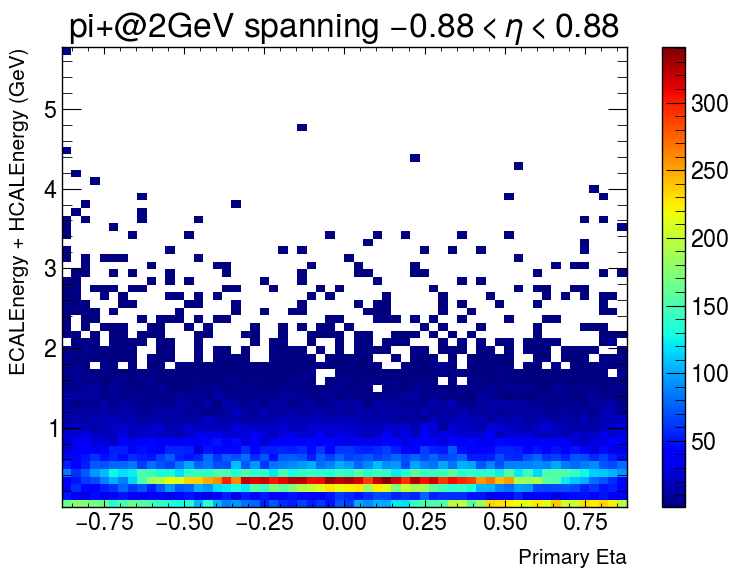

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/5GeV/3to50deg/pi+_5GeV_3to50deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/5GeV/3to50deg/pi+_5GeV_3to50deg.0020.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


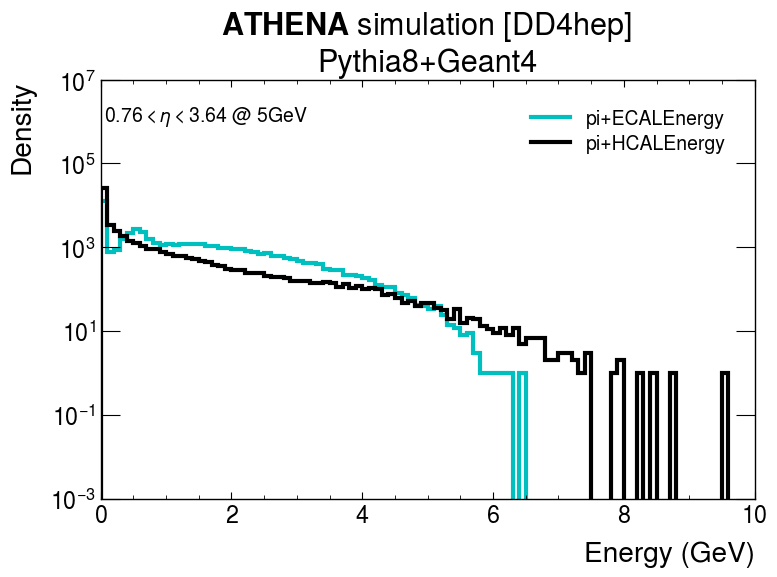

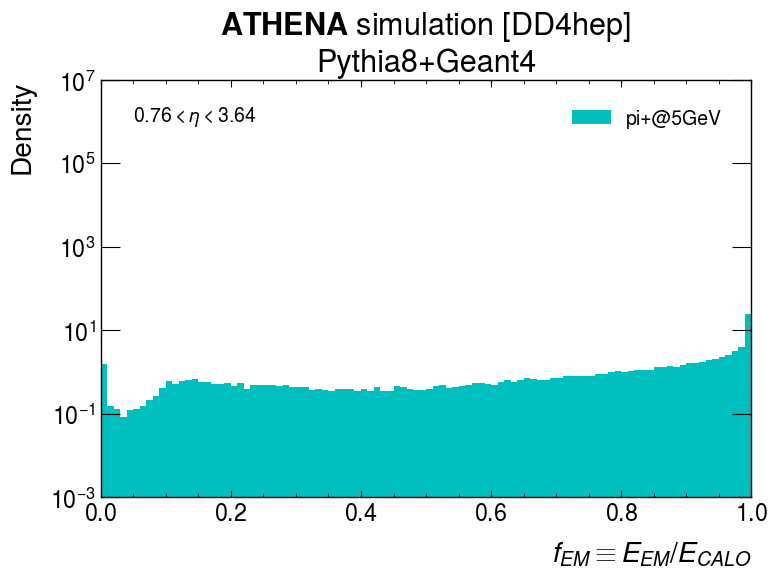

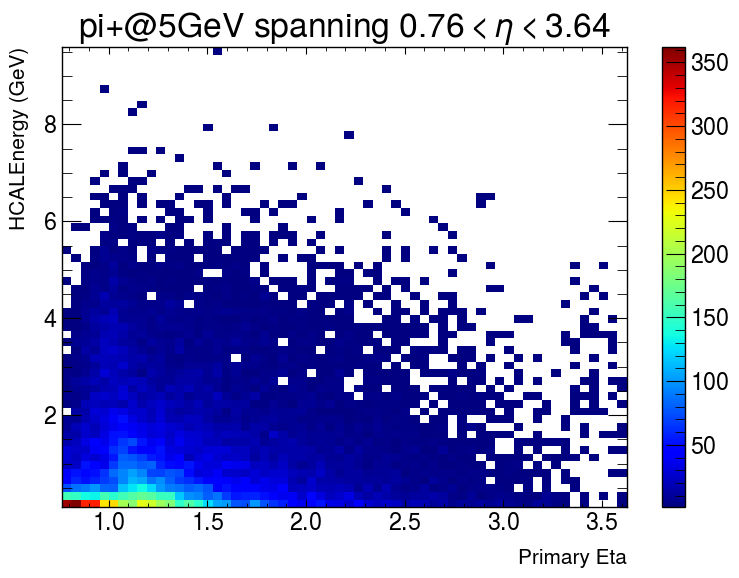

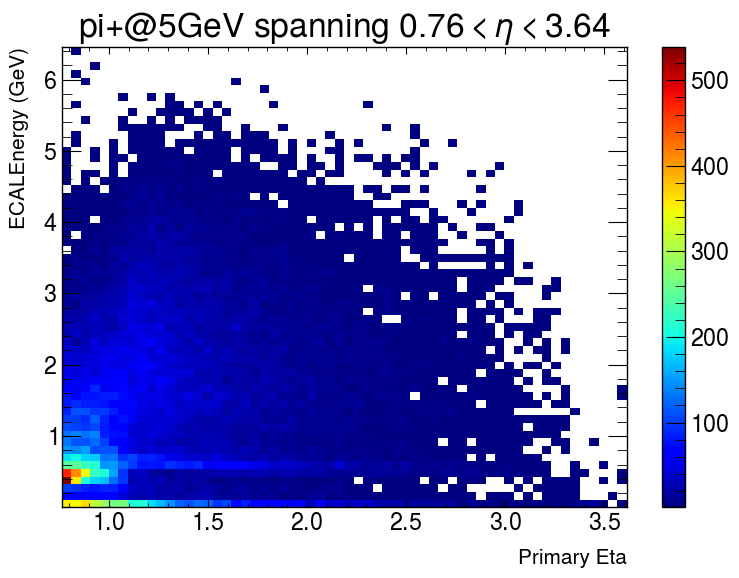

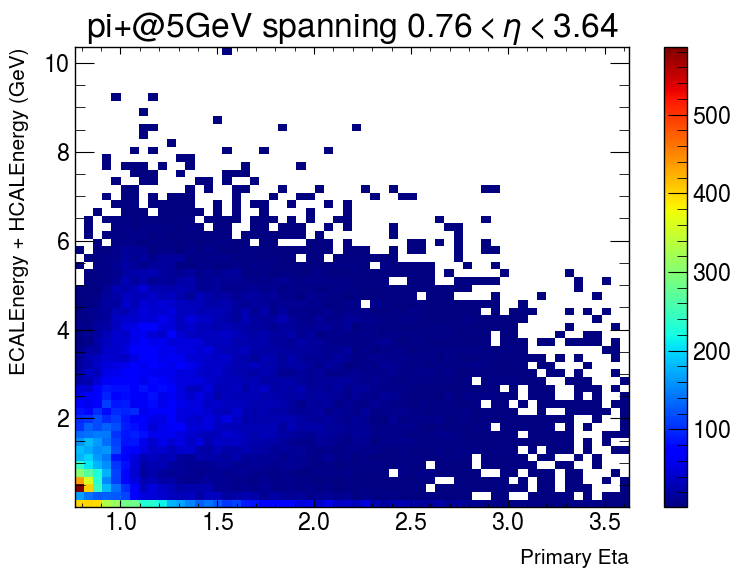

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/5GeV/45to135deg/pi+_5GeV_45to135deg.0020.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/5GeV/45to135deg/pi+_5GeV_45to135deg.0020.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


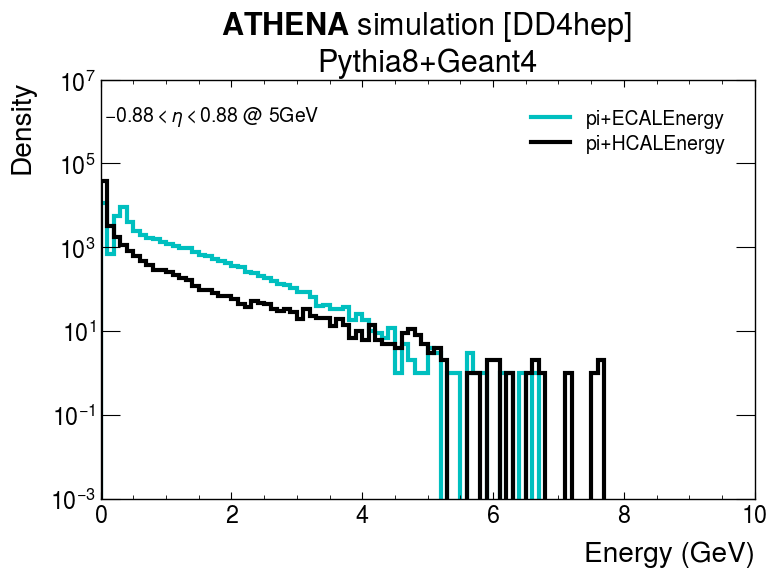

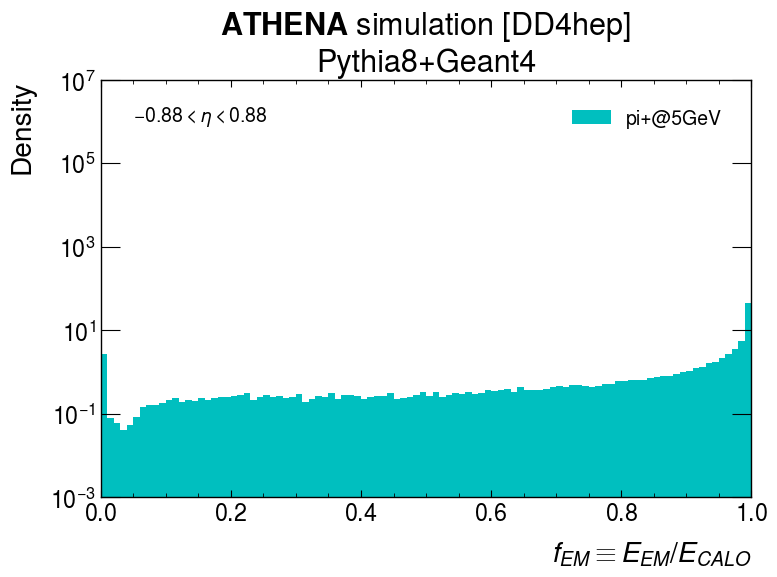

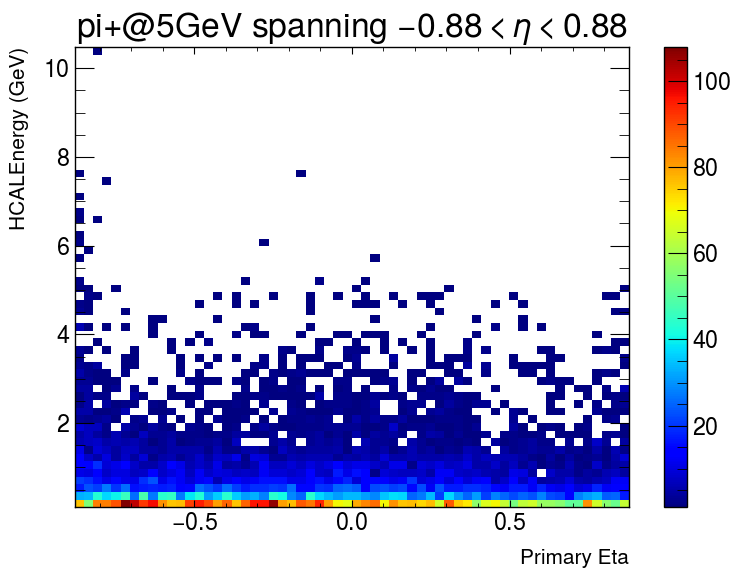

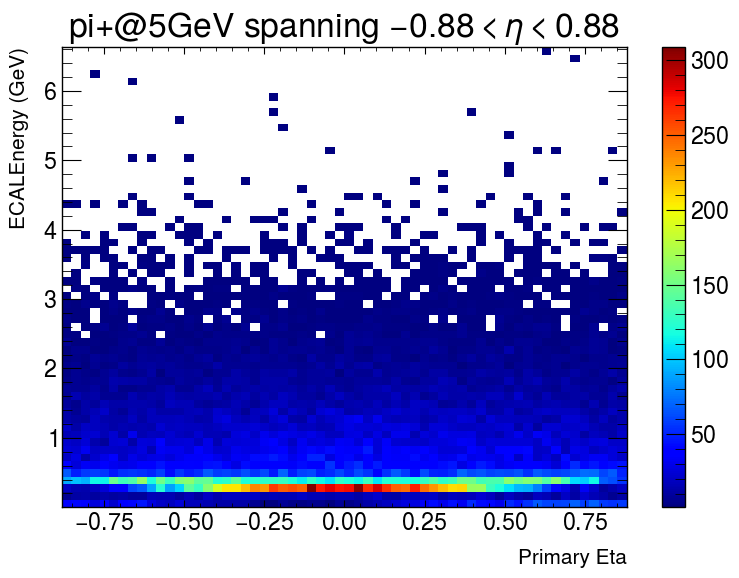

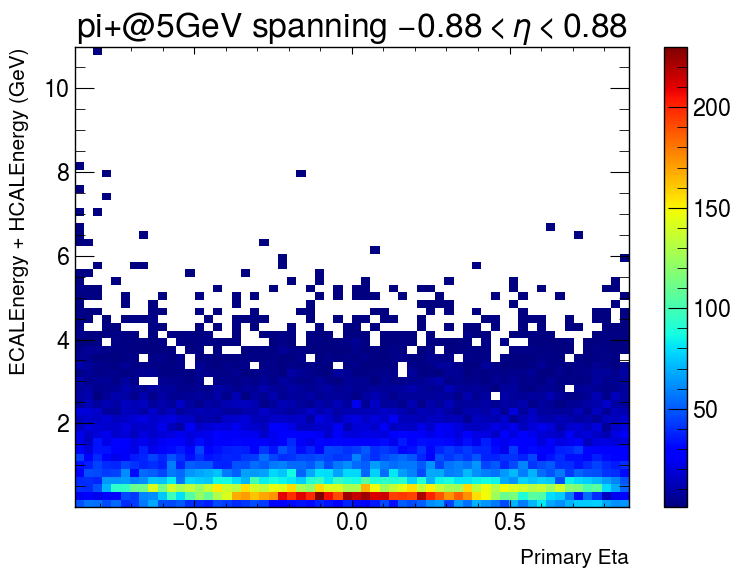

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/10GeV/3to50deg/pi+_10GeV_3to50deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/10GeV/3to50deg/pi+_10GeV_3to50deg.0040.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


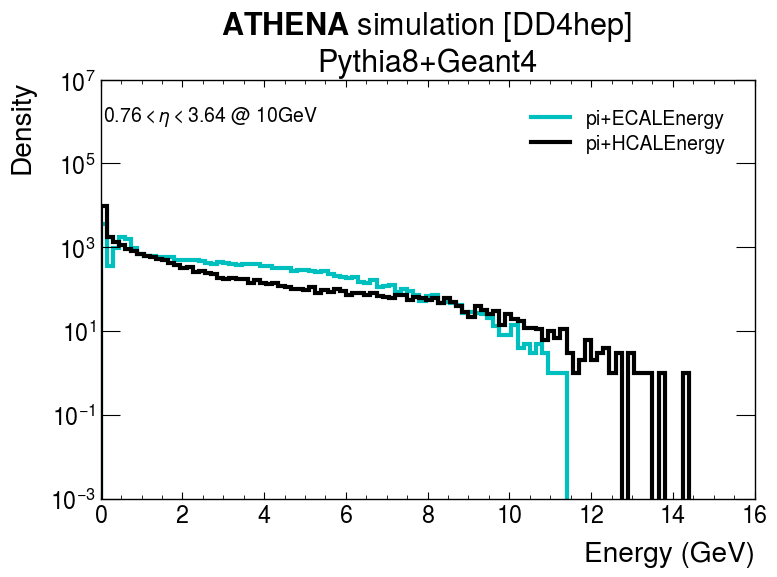

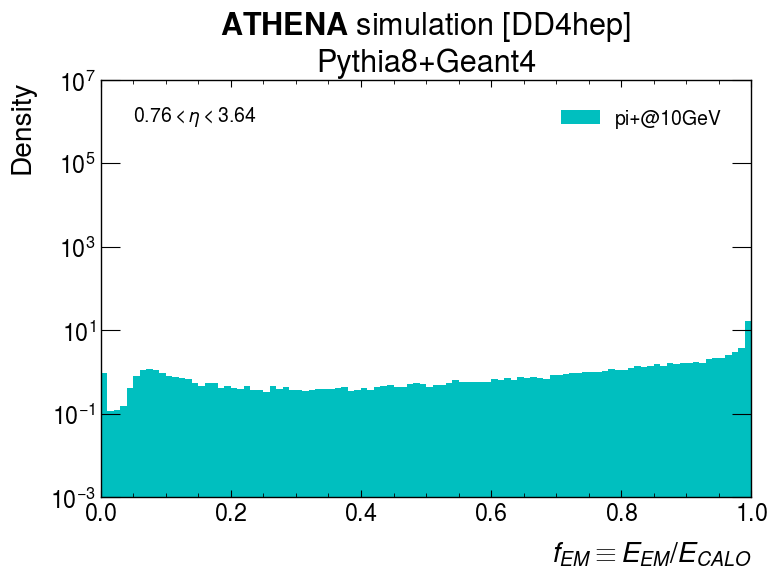

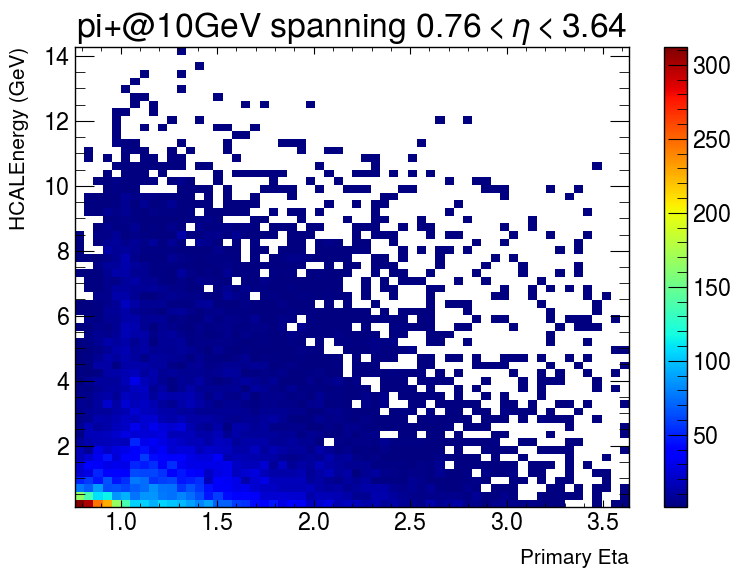

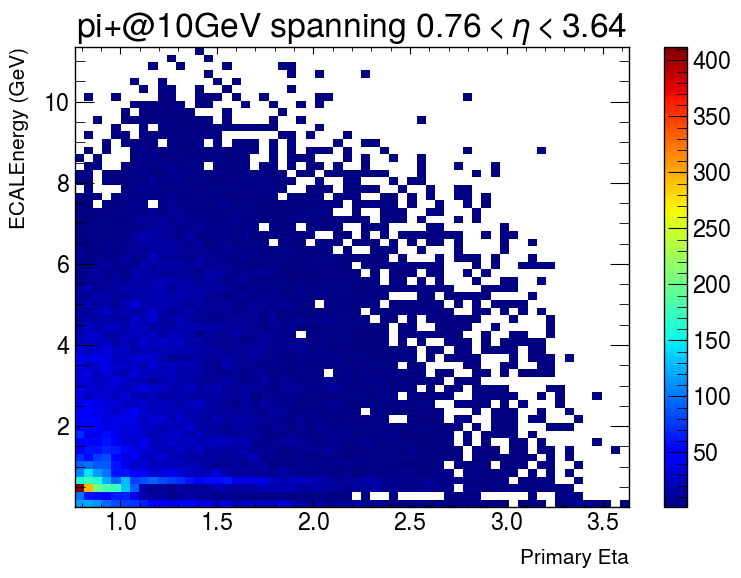

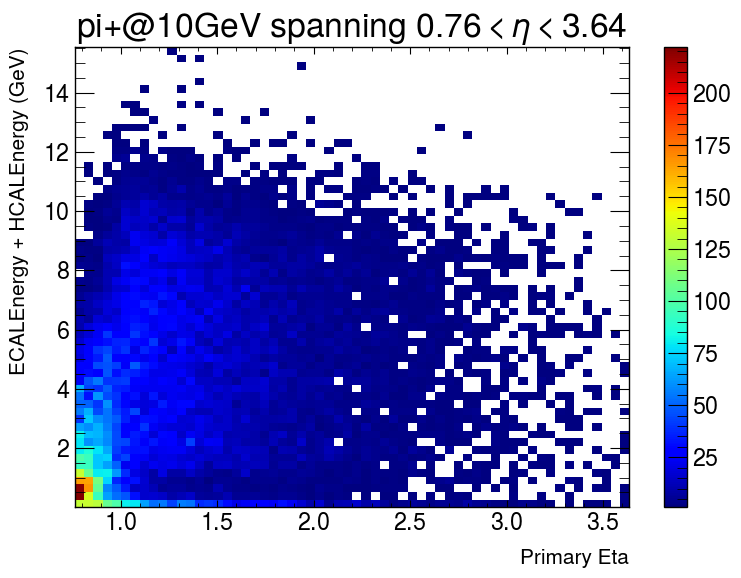

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/10GeV/45to135deg/pi+_10GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/10GeV/45to135deg/pi+_10GeV_45to135deg.0040.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


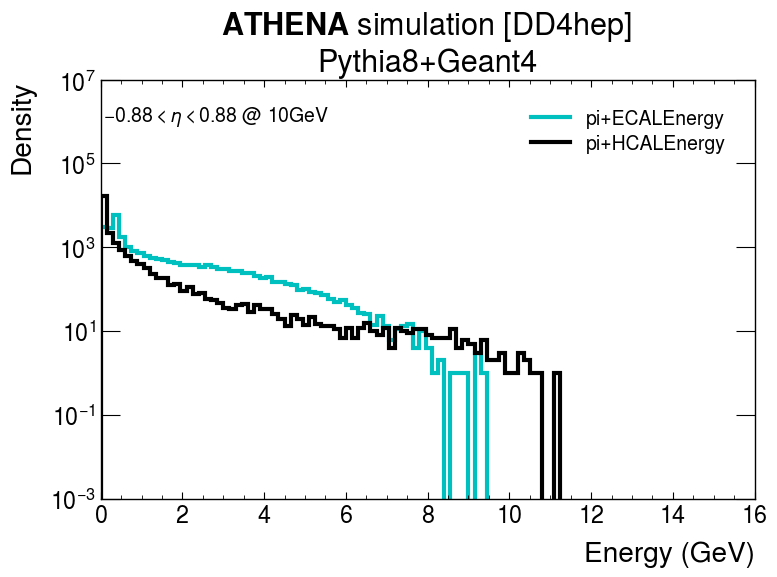

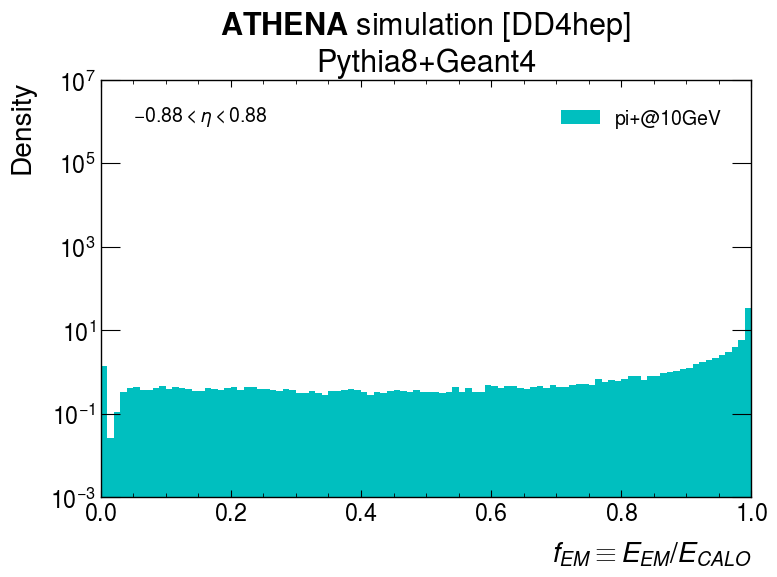

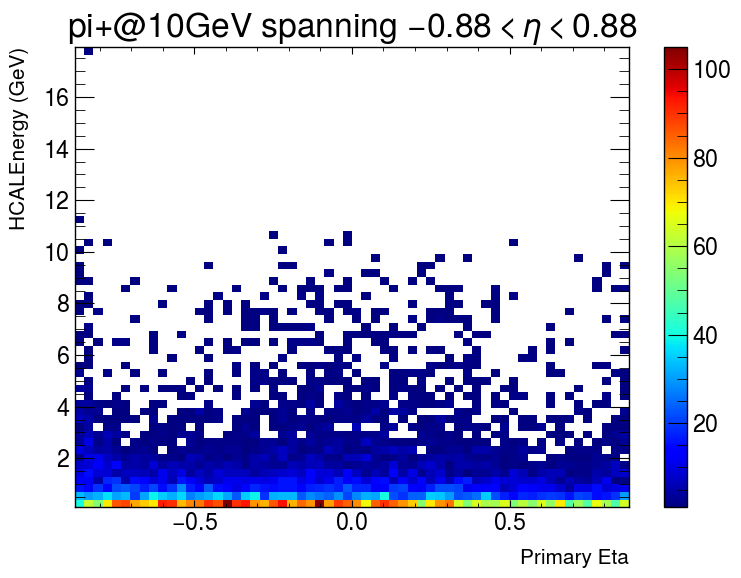

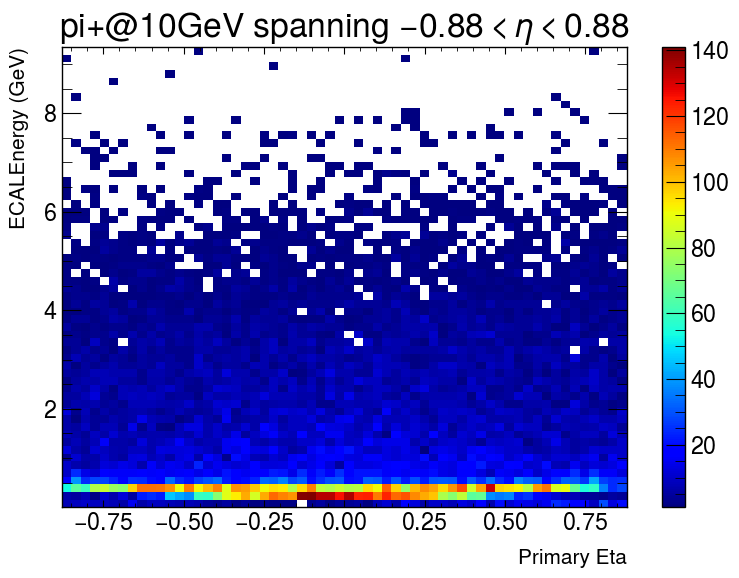

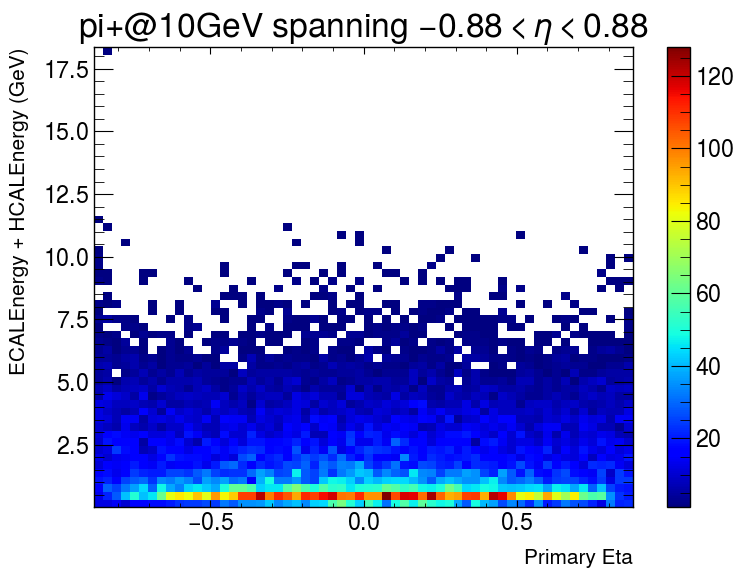

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/20GeV/3to50deg/pi+_20GeV_3to50deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/20GeV/3to50deg/pi+_20GeV_3to50deg.0040.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


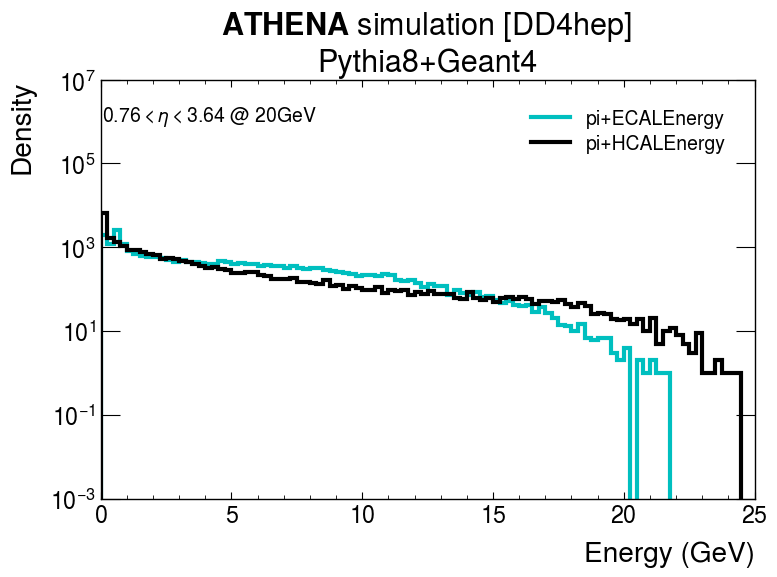

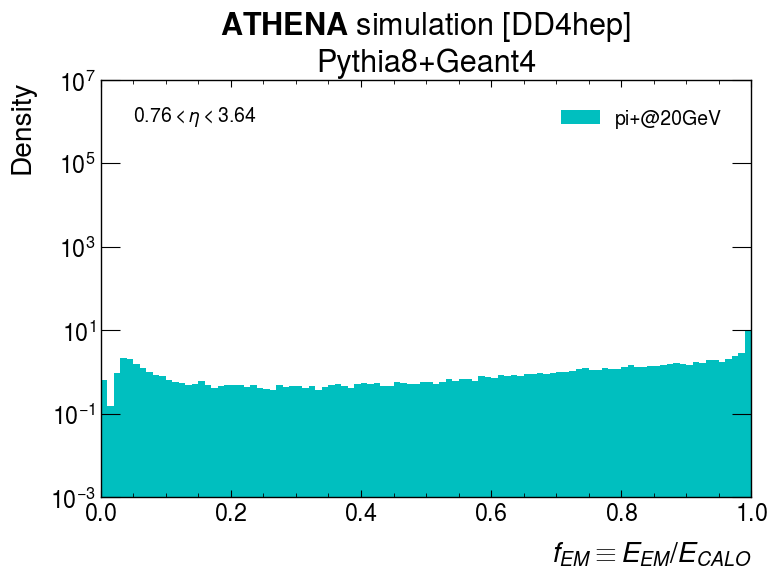

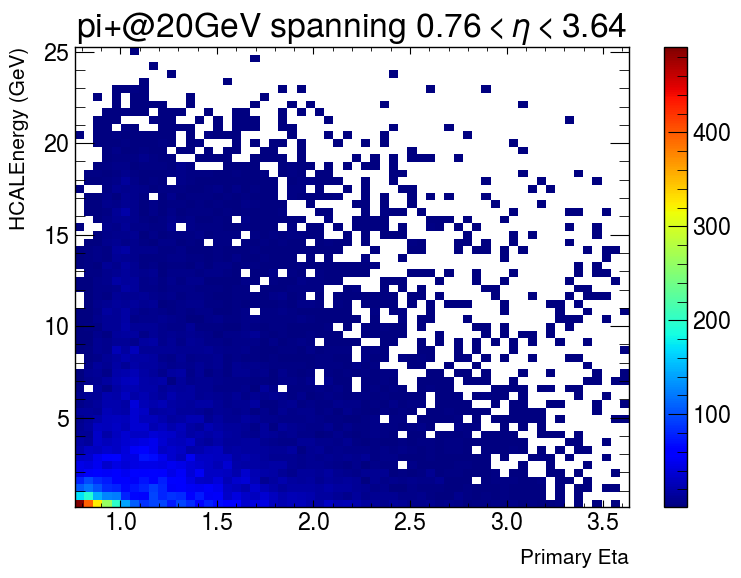

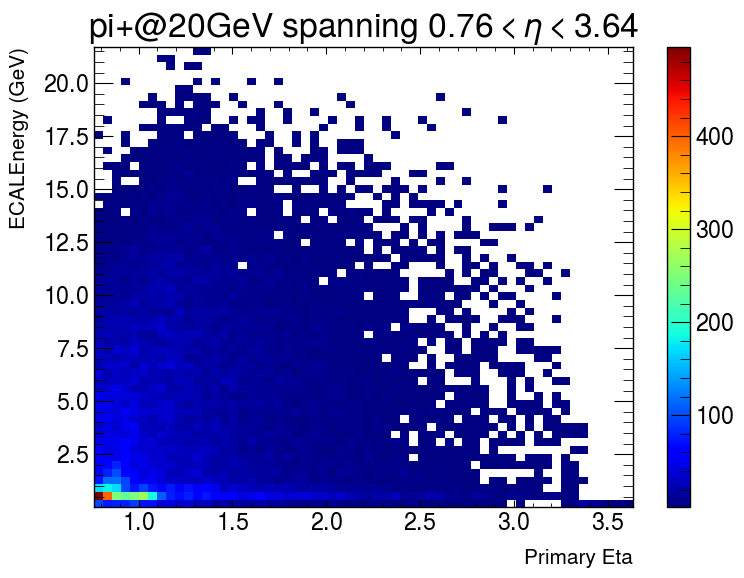

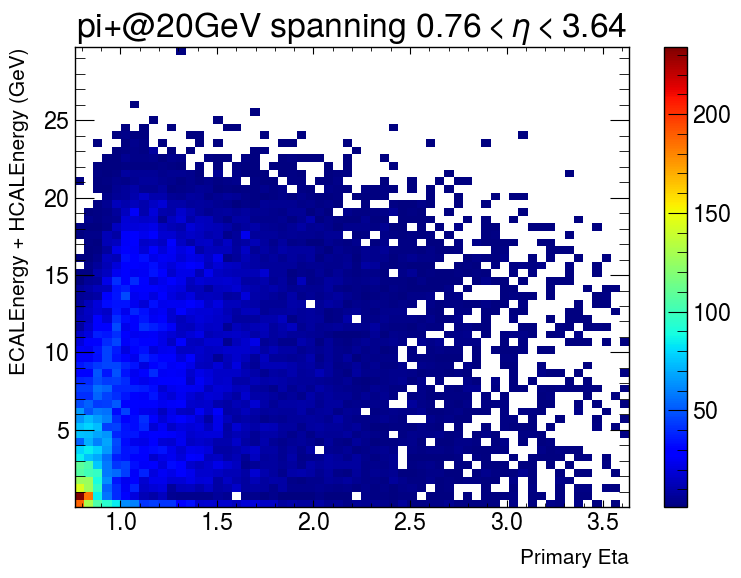

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/20GeV/45to135deg/pi+_20GeV_45to135deg.0040.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/20GeV/45to135deg/pi+_20GeV_45to135deg.0040.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


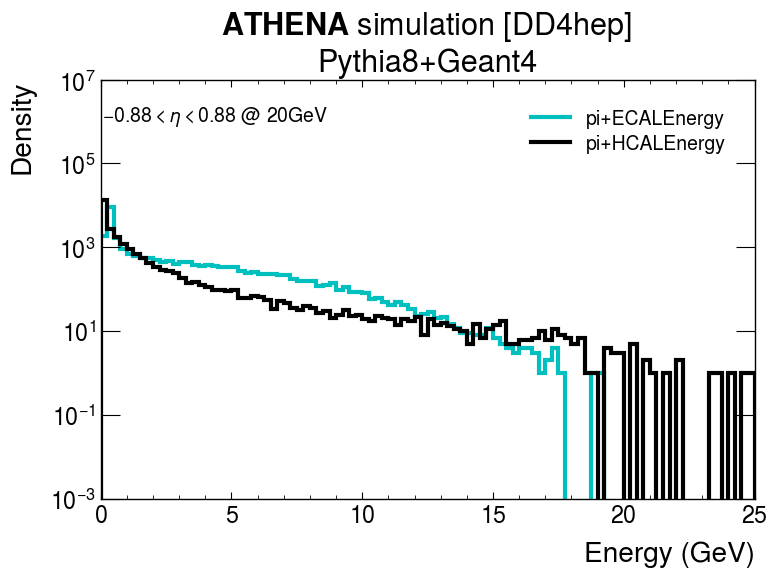

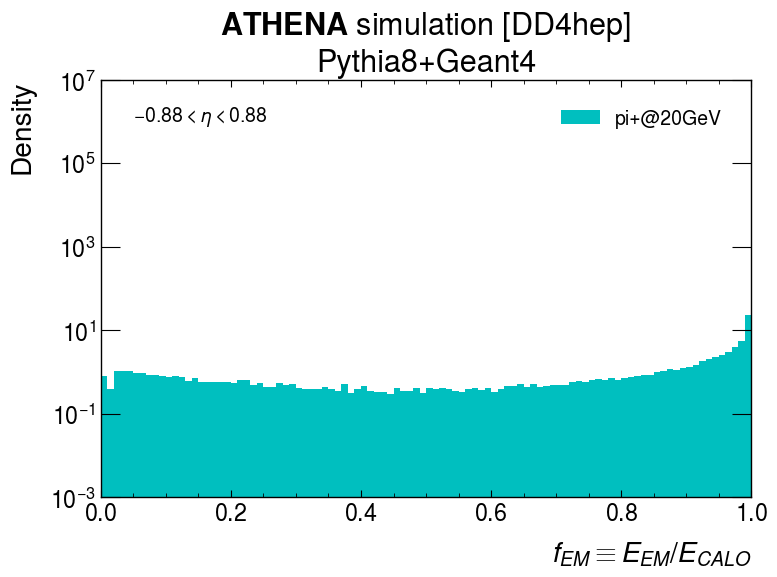

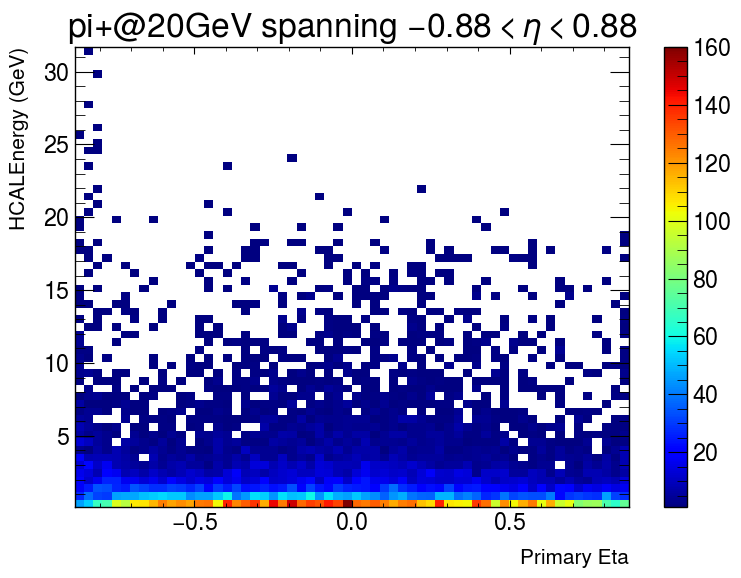

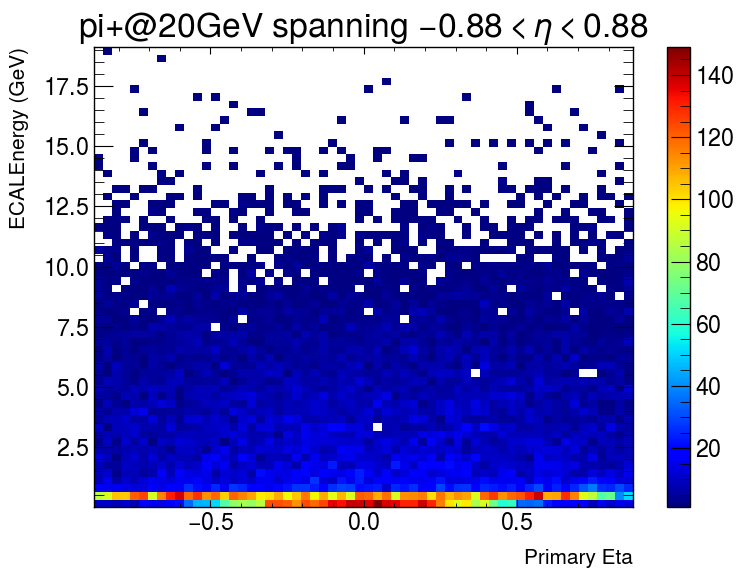

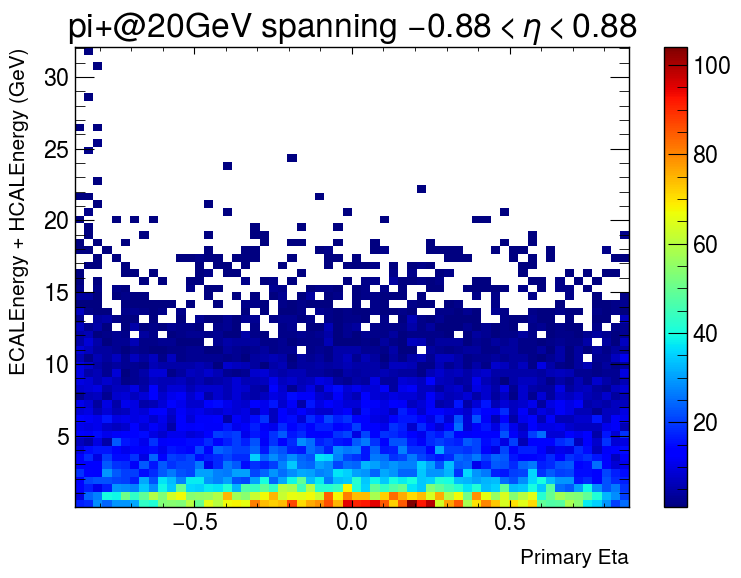

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/50GeV/3to50deg/pi+_50GeV_3to50deg.0100.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/50GeV/3to50deg/pi+_50GeV_3to50deg.0100.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


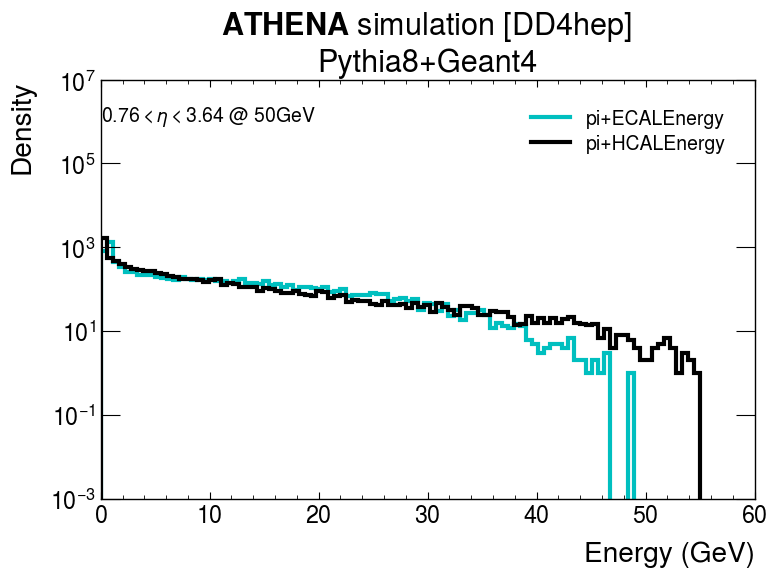

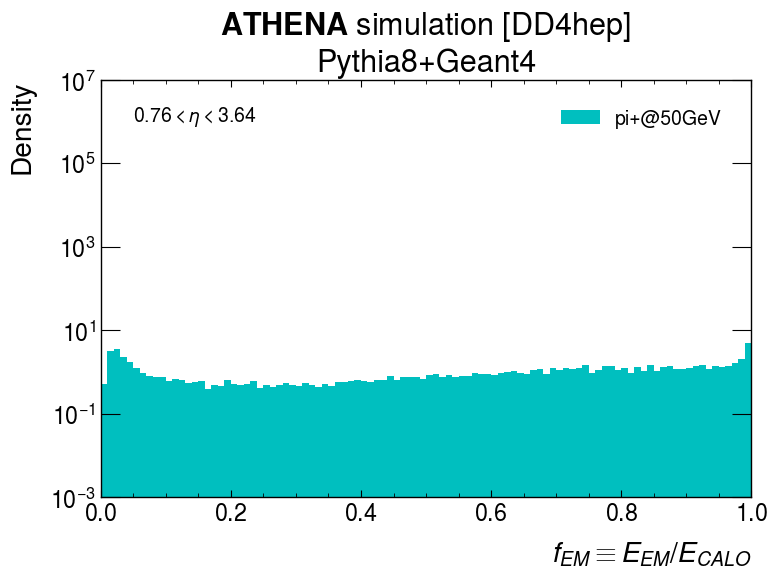

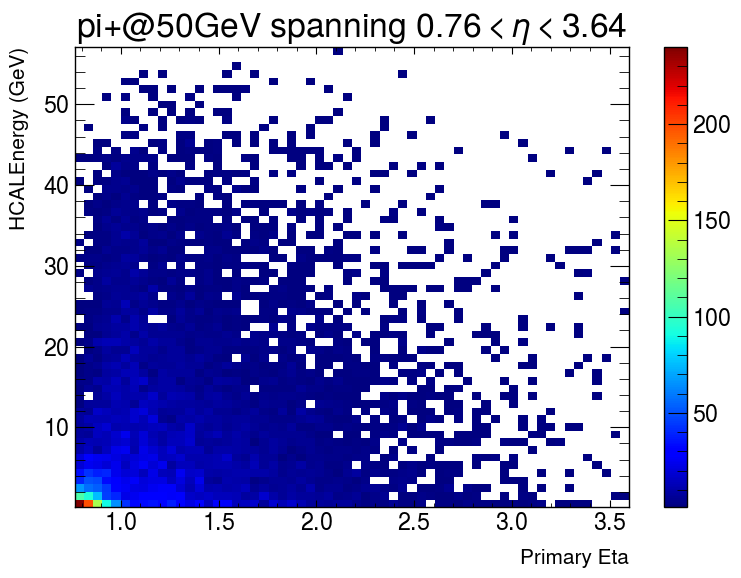

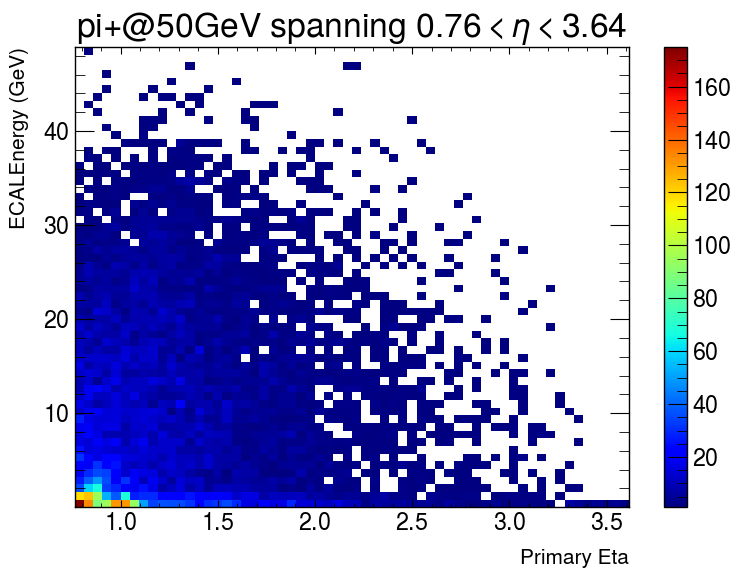

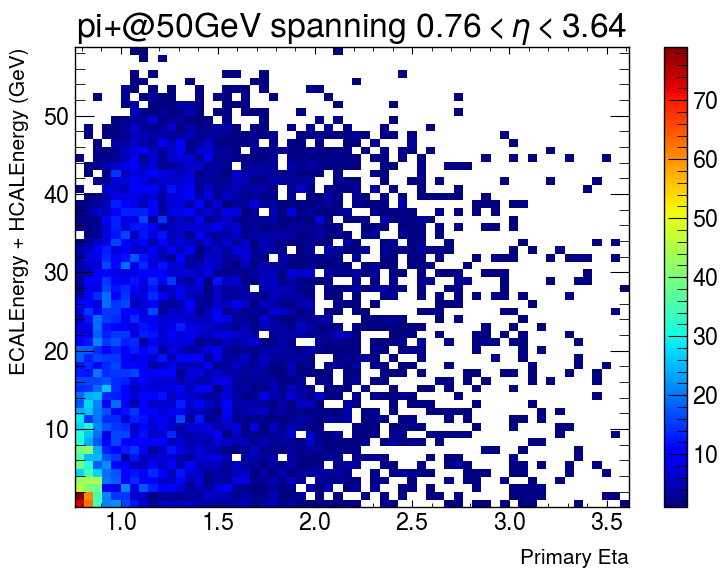

/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/reco/SINGLE/pi+/50GeV/45to135deg/pi+_50GeV_45to135deg.0100.root
/home/rdhill13/projects/rrg-wdconinc/wdconinc/EIC/campaigns/full/SINGLE/pi+/50GeV/45to135deg/pi+_50GeV_45to135deg.0100.root
Creating histogram named pi+ECALEnergyFraction ... 
Creating histogram named pi+ECALEnergy ... 
Creating histogram named pi+HCALEnergy ... 


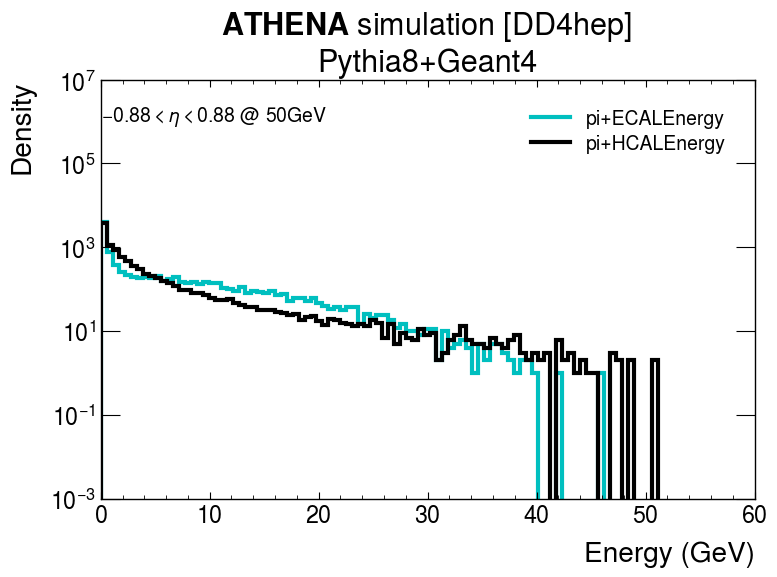

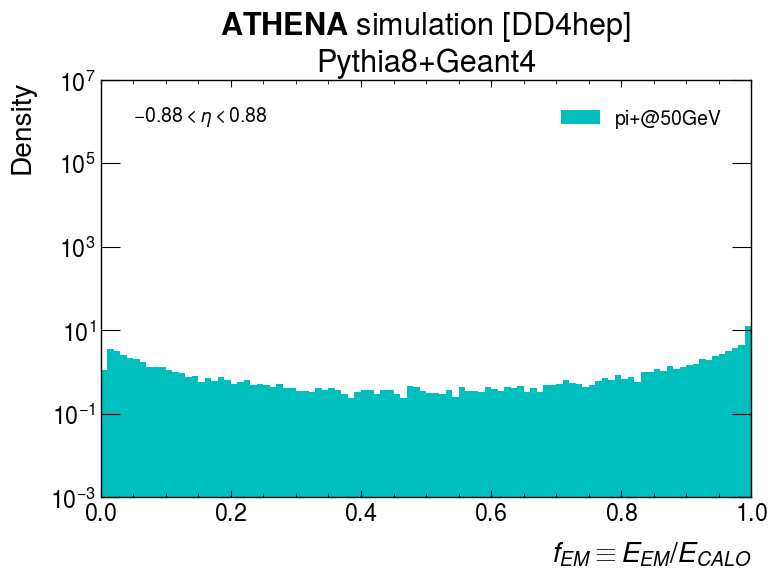

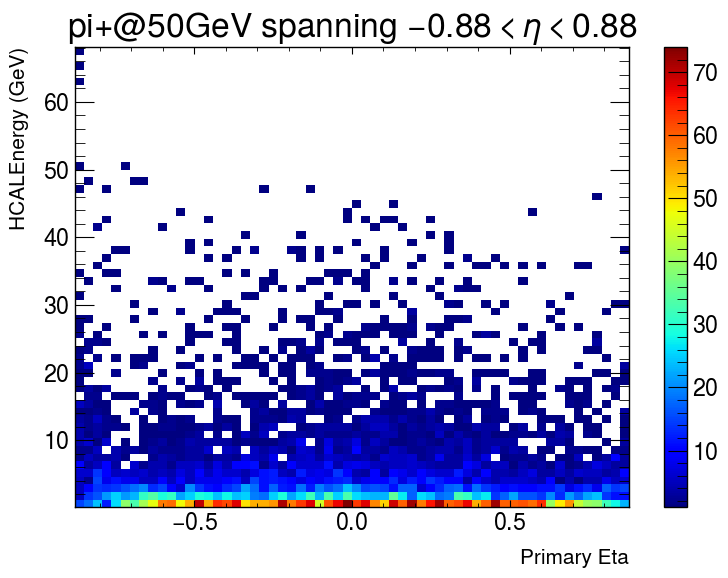

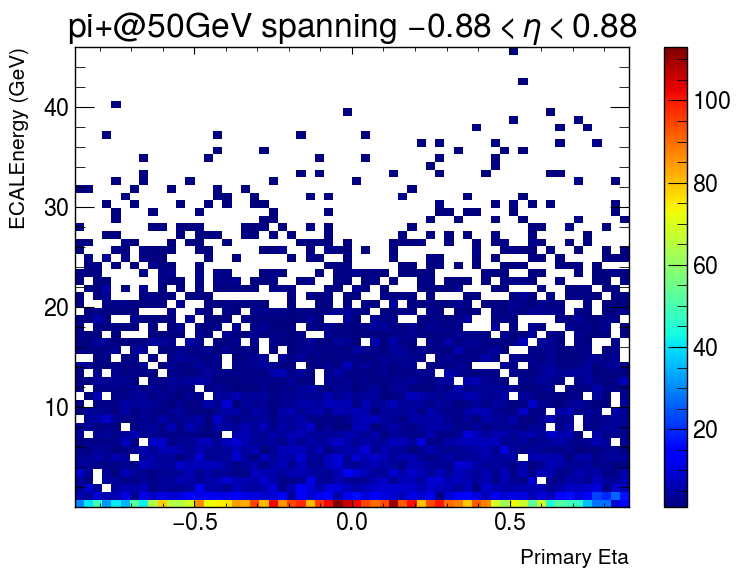

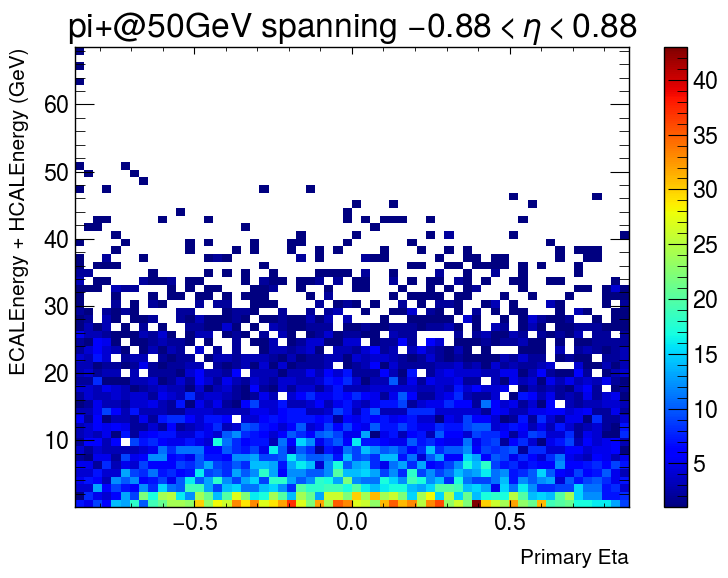

In [7]:
# Automate for every file. Depending on particle, the energy, and the eta range, plot the corresponding plots.

pp = PdfPages('ATHENA_FullSim_AllFigures.pdf')  # save all plots to one single pdf.

for j in range(len(recofiles)):
    for i in range(len(recofiles[j])):
        openreco = recofiles[j][i]
        print(openreco)
        recofile = uproot.open(openreco)
        recotree = recofile['events;1']
        #reco_hcal = recotree['HcalBarrelClusters']
        #reco_ecal = recotree['EcalBarrelClusters']
        
        openfull = fullfiles[j][i]
        print(openfull)
        fullfile = uproot.open(openfull)
        fulltree = fullfile['events']
        mcp = fulltree['mcparticles']

        particle_df = truth_df(recotree, mcp)
        eng = energies[j][i]
        rng = ranges[j][i]
        
        if "45to135" in openfull:
            eta_range = [-0.88, 0.88]
            if "e-" in openfull:
                particle_data, pp = process(particle_df, "e-", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            elif "gamma" in openfull:
                particle_data, pp = process(particle_df, "gamma", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            elif "kaon0L" in openfull:
                particle_data, pp = process(particle_df, "kaon0L", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            elif "neutron" in openfull:
                particle_data, pp = process(particle_df, "neutron", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            elif "pi+" in openfull:
                particle_data, pp = process(particle_df, "pi+", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            
        elif "130to177deg" in openfull:
            eta_range = [-3.64, -0.76]
            particle_data, pp = process(particle_df, "e-", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            
        elif "3to50" in openfull:
            eta_range = [0.76, 3.64]
            if "pi+" in openfull:
                particle_data, pp = process(particle_df, "pi+", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
            elif "kaon0L" in openfull:
                particle_data, pp = process(particle_df, "kaon0L", pp=pp, eta_range=eta_range, eng=eng, rng=rng)
                
pp.close()